# Miniproject: Modelling the climate or the weather?

Is past performance an indicator of future weather?

## Global Historial Climatology Network
GHCN (Global Historical Climatology Network)-Daily is an integrated database of daily climate summaries from land surface stations across the globe. 

THe GHCN has many datasets from weather stations across the globe. A [README describing the data form is available here](http://www.hep.ucl.ac.uk/undergrad/0056/other/projects/ghcnd/readme.txt). The [stations.txt](http://www.hep.ucl.ac.uk/undergrad/0056/other/projects/ghcnd/ghcnd-stations.txt) file and [countries.txt](http://www.hep.ucl.ac.uk/undergrad/0056/other/projects/ghcnd/ghcnd-countries.txt) contain information about the stations and countries.


### Machine Learning Tasks: 
1. Can you design a machine learning technique that can predict the climate (defined as the weekly or monthly average) a year in advance?  [Later in the term files containing the 2021 data will be made available
2. Can you design a machine learning technique that can predict the weather (temperature, rainfall, snow fall, etc.) any better than assuming that the weather tomorrow will be exactly the same as the weather today

### Potential extensions
1. Can you train a machine learning technique to predict 10 or 20 years into the future?
2. Where will the hotest part of the world be in 20 years time?
3. What else can you study with this dataset? Is the sun in Utah a predictor of the rain in Spain? 
4. How close do weather stations need to be to provide reliable forecasts at other stations?

### Caveats
This is real data from weather stations around the world. This means that there are 'holes' in the data. You must be able to handle these 'holes' in some error tolerant fashion.


In [1]:
# import the urllib library
import urllib.request
from datetime import date
import numpy as np
import matplotlib.pyplot as plt 
 
#Class that keeps information about station name and location
class Station():
    def __init__(self,sid,lat,lon,el,state,name,gsn,hcn,wmo,country):
        self.sid=sid
        self.lat=lat
        self.lon=lon
        self.el=el
        self.state=state
        self.name=name
        self.gsn=gsn
        self.hcn=hcn
        self.wmo=wmo
        self.country=country
        
    def __str__(self):
        return self.sid+" is "+self.name+", "+self.country+" at "+str(self.lat)+", "+str(self.lon)+", "+str(self.el)

#Class that hides some ugly reading routines
class GHNCD:
     
    #Class constructor
    def __init__(self): 
        self.station_col_len = [11,4,2,4]
        for i in range(31):
            self.station_col_len.append(5)
            self.station_col_len.append(3)
    
    # Split up the fixed length text arrays into fields
    def chunkstring(self,string, lengths):
        return (string[pos:pos+length].strip() 
                for idx,length in enumerate(lengths)
                for pos in [sum(map(int, lengths[:idx]))])

    # Process a file and extract all the information into a dictionary
    def processFile(self,fileName):
        outDict={} #
        with open(fileName, 'r') as fp: # Open file
            line = fp.readline()  #Read first line
            while line: # Process line
                fields = list(self.chunkstring(line, self.station_col_len)) #Get list of fields
                
                # For clarity use some variable names
                station=fields[0]  
                year=int(fields[1])
                month=int(fields[2])
                field=fields[3]
                vals=fields[4::2]
                flags=fields[5::2]
                # Not clear this is the only check we need, but for now
                def checkInt(x,flag):
                    if flag=='':
                        return -9999
                    return int(x)
                
                #Convert missing entries to -9999 using this swishy bit of string comprehension
                ivals=[checkInt(x,flag) for (x,flag) in zip(vals,flags)]
                monthDict=dict(year=year,month=month,field=field,vals=ivals,flags=flags)
                if field in outDict.keys():
                    outDict[field]['monthList'].append(monthDict)
                else:
                    fieldDict=dict(monthList=[monthDict])
                    outDict[field]=fieldDict
                line = fp.readline()
        return dict(outDict) #Return a copy
    
    def readCountriesFile(self,fileName=None):
        self.countryDict={}
        if fileName==None:
            file = urllib.request.urlopen('http://www.hep.ucl.ac.uk/undergrad/0056/other/projects/ghcnd/ghcnd-countries.txt')
        else:
            file = open(fileName,'r')
        
        for line in file:
            c=str(line[0:2], 'utf-8')
            d=str(line[3:-2], 'utf-8')                  
            self.countryDict[c]=d
        print("Read",len(self.countryDict),"countries and codes")
        
    
    def readStationsFile(self,fileName=None,justGSN=True):
        
        #------------------------------
        #Variable   Columns   Type
        #------------------------------
        #ID            1-11   Character
        #LATITUDE     13-20   Real
        #LONGITUDE    22-30   Real
        #ELEVATION    32-37   Real
        #STATE        39-40   Character
        #NAME         42-71   Character
        #GSN FLAG     73-75   Character
        #HCN/CRN FLAG 77-79   Character
        #WMO ID       81-85   Character
        #------------------------------
        self.stationDict={}
        if fileName==None:
            file = urllib.request.urlopen('http://www.hep.ucl.ac.uk/undergrad/0056/other/projects/ghcnd/ghcnd-stations.txt')
        else:
            file = open(fileName,'r')
        
        for line in file:
            sid=str(line[0:11], 'utf-8')
            lat=float(str(line[12:20], 'utf-8'))
            lon=float(str(line[21:30], 'utf-8'))
            el=float(str(line[31:37], 'utf-8'))
            state=str(line[38:40], 'utf-8')
            name=str(line[41:71], 'utf-8')
            gsn=str(line[72:75], 'utf-8')
            hcn=str(line[76:79], 'utf-8')
            wmo=str(line[80:85], 'utf-8')
            
           
            if justGSN:
                if gsn=='   ':
                    continue
            self.stationDict[sid]=Station(sid,lat,lon,el,state,name.rstrip(),gsn,hcn,wmo,self.countryDict[sid[0:2]])
        print("Read",len(self.stationDict),"stations with justGSN",justGSN)

    # Get all the data for a given variable type
    def getVar(self,statDict,varName='TMAX'):
        #The TMIN, TMAX, PRCP are all quoted in tenths (so need to be multipied by 0.1)
        cal=0.1
        if varName=='SNOW' or varName=='SNWD':
            cal=1.0
        tempList=[ (date(month['year'],month['month'],ind+1),cal*val)  for month in statDict[varName]['monthList'] for ind, val in enumerate(month['vals']) if val!=-9999   ]
        return tempList
    
    def getTMAX(self,statDict):
        return self.getVar(statDict,'TMAX')
    
    def printStation(self,sid):
        print(self.stationDict[sid])
        
    def getStation(self,sid):
        return self.stationDict[sid]
        
    def getStatKeyNames(self):
        #print(self.stationDict.keys())
        return [*self.stationDict.keys()]


In [2]:
ghn=GHNCD()
ghn.readCountriesFile()
ghn.readStationsFile()

Read 219 countries and codes
Read 991 stations with justGSN True


In [3]:
# Get list of station names
statNames=ghn.getStatKeyNames()

# Arbitrary number from 0 to 990
whichStat=220
fileName=statNames[whichStat]+'.dly'
urlName='http://www.hep.ucl.ac.uk/undergrad/0056/other/projects/ghcnd/ghcnd_gsn/'+fileName

# Copy a network object to a local file
urllib.request.urlretrieve(urlName,fileName)
statDict=ghn.processFile(fileName)
print(ghn.getStation(statNames[whichStat]))


CA002400404 is ARCTIC BAY CS, Canada at 73.0, -85.0167, 10.0


Text(0, 0.5, 'Temperature (C)')

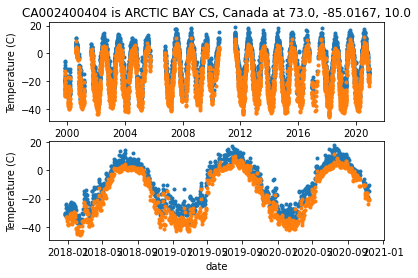

In [4]:
tmaxArray=ghn.getVar(statDict,'TMAX')
days1, tmax = zip(*tmaxArray)
tminArray=ghn.getVar(statDict,'TMIN')
days2, tmin = zip(*tminArray)

fig, ax = plt.subplots(2,1)
ax[0].plot(days1,tmax,'.')
ax[0].plot(days2,tmin,'.')
ax[0].set_xlabel("date")
ax[0].set_ylabel("Temperature (C)")
ax[0].set_title(ghn.getStation(statNames[whichStat]))
ax[1].plot(days1[-1000:],tmax[-1000:],'.')
ax[1].plot(days2[-1000:],tmin[-1000:],'.')
ax[1].set_xlabel("date")
ax[1].set_ylabel("Temperature (C)")

## Task 1
Can you design a machine learning technique that can predict the climate (defined as the weekly or monthly average) a year in advance?  [Later in the term files containing the 2021 data will be made available.

Importing libraries:

In [5]:
import numpy as np 
import matplotlib.pyplot as plt 
import pandas as pd

import matplotlib.style #Some style nonsense
import matplotlib as mpl #Some more style nonsense

mpl.rcParams["legend.frameon"] = False
mpl.rcParams['figure.dpi']=200 # dots per inch
plt.style.use('bmh')

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

Loop to download all .dly files for data from all stations

In [6]:
def getDly():
    """
    function that downloads all .dly files into the folder the jupyter notebook is in
    """
    stations = range(990) # 0 to 990 stations 
    for i in stations: #loop over each station
        fileName=statNames[whichStat]+'.dly' #file name
        urlName='http://www.hep.ucl.ac.uk/undergrad/0056/other/projects/ghcnd/ghcnd_gsn/'+fileName #url for file 
        urllib.request.urlretrieve(urlName,fileName) #download to local folder

In [7]:
#getDly() #RUN TO DOWNLOAD ALL FILES TO LOCAL FOLDER WHERE NOTEBOOK IS

This first part of the notebook is just for initial testing and experimentation for me to understand the nature of the data and how to implement it.

The function below retrieves the temperature values from a weather station. The output is an average temperature value calculated as the mean of the maximum daily temperature and minimum daily temperature. The retrieved date and temperature values using getVar have holes as this function omits the dates where there are no temperature values. Therefore, the temperatures have been resampled and linearly interpolated in order to fill the holes. For larger holes, this is not a great solution, so it is best to choose a data set from a station that has minimal amounts of holes. Some example stations have been provided below. 

The function returns daily, weekly, and monthly temperatures. The daily temperature is simply the data retrieved from the station and resampled. This is done using a pandas function resample() and this fills in the missing dates and temperatures. The dates are filled with the dates and the temperatures are filled with NaN values. To fill the NaN values, the temperatures are linearly interpolated using a pandas function. The result of this is a pandas dataframe which is easier to manipulate compared to arrays. 

The weekly temperatures are calculated using resampling also. It goes through the index of dates for the daily dataframe and resamples after 7 days and calculates the mean for the 7 days. 

The monthly temperatures are calculated using resampling also, using the month string of the index of dates. 

In [8]:
def getTemp(station):
    """
    This function returns 3 dataframes of temperatures in degC based on the input 
    station number. The first dataframe is of daily temperatures, the second dataframe is of
    weekly average temperatures, the third is of monthly average temperatures.
    """
    statNames=ghn.getStatKeyNames() #get station names using given function
    fileName=statNames[station]+'.dly' #get filename, stationID + .dly
    data=ghn.processFile(fileName) #get station data using given function
    print("Station #", station, "is", ghn.getStation(statNames[station])) #outputs station name, ID
    
    tmaxArray=ghn.getVar(data,'TMAX') #get TMAX daily data 
    tminArray=ghn.getVar(data,'TMIN') #get TMIN daily data
    
    days1, tmax = zip(*tmaxArray) #unpack tmax into date and temperature values
    days2, tmin = zip(*tminArray) #unpack tmin into date and temperature values
    
    #crop array into 5000 most recent values (less holes)
    tmaxData = {'Date': days1[-5000:], 'Tmax (C)': tmax[-5000:]} 
    tminData = {'Date': days2[-5000:], 'Tmin (C)': tmin[-5000:]}
    
    #create dataframe for tmax and tmin values 
    df_tmax = pd.DataFrame(data = tmaxData)
    df_tmin = pd.DataFrame(data = tminData)
    
    #set the index of dataframes as the date
    df_tmax.index = pd.to_datetime(df_tmax['Date'])
    df_tmin.index = pd.to_datetime(df_tmin['Date'])
    
    #resample the dataframes so that the missing dates in between (holes) are included
    new = df_tmax.resample('1d').mean()
    new1 = df_tmin.resample('1d').mean()
    
    #create dataframe of tmax and tmin together, index is date
    df = new.join(new1['Tmin (C)'])
    
    #interpolate the missing temperature values linearly
    df = df.interpolate()
    #fill the end values if missing with the value closest to end of series.
    df = df.ffill().bfill()
    
    #create an average series of temperature by taking the mean of tmax and tmin
    df['Average (C)'] = df.mean(axis=1)
    
    #remove the tmax and tmin columns from the dataframe
    df_tmax = df.pop('Tmax (C)')
    df_tmin = df.pop('Tmin (C)')
    #df_daily is dataframe of daily average temp values
    df_daily = df
    df_weekly = df_daily.resample('D').interpolate()[::7]
    df_monthly = df_daily.resample('M').mean()
    
    #return 3 dataframes
    return df_daily, df_weekly, df_monthly

Testing the function by generating first dataframes for station 0.

In [9]:
df_daily, df_weekly, df_monthly = getTemp(0) #testing function

Station # 0 is AE000041196 is SHARJAH INTER. AIRP, United Arab Emirates at 25.333, 55.517, 34.0


Outputting head and tail of the monthly dataframe

In [10]:
df_monthly #outputting head and tail of dataframe

,Average (C)
Date,
2002-10-31,28.737500
2002-11-30,24.586667
2002-12-31,20.952419
2003-01-31,18.218548
2003-02-28,21.502679
...,...
2020-07-31,37.158065
2020-08-31,36.724194
2020-09-30,34.870833


Plotting monthly dataframe

Text(0.5, 1.0, 'AE000041196 is SHARJAH INTER. AIRP, United Arab Emirates at 25.333, 55.517, 34.0')

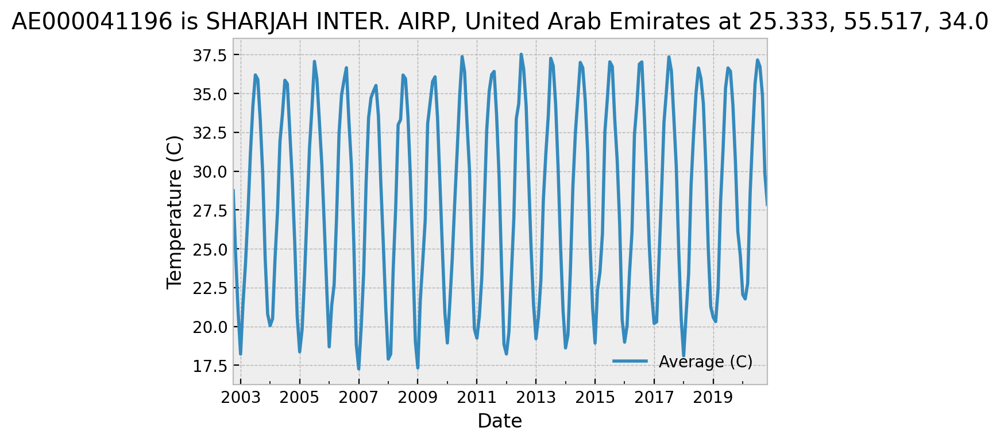

In [11]:
df_monthly.plot(y='Average (C)', use_index=True) #plot data
plt.ylabel('Temperature (C)') #set y label
plt.title(ghn.getStation(statNames[0])) #set title as station name

## Normalize Data
It is best to normalize the data before feeding it to the neural network. We can normalize it by subtracting the mean and dividing by the standard deviation.

The data is normalized using the mean and standard deviation of the training data set as the validation and testing data sets need to be hidden from the model in order to produce a more accurate representation of the predicative performance of the model.

In [12]:
def normalize(df):
    n = len(df) #takes length of dataframe input
    mean = df[0:int(n*0.75)].mean() #mean of training data set 75% of temps
    std = df[0:int(n*0.75)].std() #standard dev of training data set
    normalized_df = (df - mean) / std #normalized temp = (temp - mean) / std
    
    return normalized_df #return dataframe of normalized temperatures

## Preparing the data 
To train the network, the data needs to be changed to a format where the data has sequence so it can be used as an input. There also needs data to use as the target (label). This can be done using the function below. The function takes the input of our data, which is the temperature in a series and outputs a dataframe of `windowsize+1` columns. Offset is how far into the future we want to predict. 

For a series of daily values, if we want to predict a day into the future, the offset should be set to 1. If we want to predict a year into the future, the offset should be set to 365. The time into the future is defined as offset multiplied by timestep. Therefore, the daily, weekly, and monthly data sets will have different offsets for predicting 1 year into the future.

In [13]:
def create_data(series,windowsize,offset):
    """
    Function to convert a series of data values into a dataframe of values used
    to train, validate, and test model
    """
    df = pd.DataFrame() #creates dataframe to store sequences of data
    for i in range(windowsize): #loop over windowsize amount of sequences
        df[i] = series.shift(windowsize-i) #Shift the data by windowsize-i samples
    df['label'] = series.shift(-offset) #label (target) data
    return df #returns the entire dataframe

## Cleaning Data
Since `create_data` shifts the series given, it creates NaN values at the head and tails of the dataframe. The function below drops these rows and returns a dataframe where the data is clean and sequenced.

In [14]:
def clean_data(df):
    """
    function to clean dataframe created from create_data() by dropping the rows where there are NaN values
    returns dataframe with no NaN values
    """
    df.dropna(axis=0, inplace=True) #df.dropna(axis=0) drops the rows where there are NaN values.
    return df #returns clean df with no NaN values

## Split Data

The data is split in training, validation, and test data and labels. The split will be 75%, 15%, 10% respectively. These values can be changed as desired.

The input data is the first windowsize columns of the sequence dataframe, and the labels are the final column of the sequence dataframe. So basically, this function splits the sequenced dataframe into the appropriate proportions of training, validation, and testing that is specified. And then, it creates the labels by using df.label.values, which appends the values of the "label" column of the sequence dataframe into an array. It then drops the label column and this is appended to the input data variable. This is then reshaped so it can be input into the model. This is repeated for the validation and testing sequenced dataframes as well. 

In [15]:
def split(df):
    """
    function to split dataframe into training, validation, and testing proportions and generate arrays of 
    inputs and labels used to train model
    """
    n = len(df)
    train = df[0:int(n*0.75)] #takes first 75% rows and creates df
    val = df[int(n*0.75):int(n*0.90)] #takes 75-90% rows and creates df
    test = df[int(n*0.90):] #takes final 10% rows and creates df
    
    train_label = train.label.values #creates array of training labels 
    train_data = train.drop('label', axis=1).values  #drops label column from training df
    train_data = train_data.reshape(-1,windowsize,1) #creates array of train data input from df
    
    val_label = val.label.values #creates array of val labels 
    val_data = val.drop('label', axis=1).values #drops label column from val df
    val_data = val_data.reshape(-1,windowsize,1) #creates array of val data input from df
    
    test_label = test.label.values #creates array of test labels 
    test_data = test.drop('label', axis=1).values #drops label column from test df
    test_data = test_data.reshape(-1,windowsize,1) #creates array of test data input from df
    
    #returns input data and labels for training and testing models later
    return train_data, train_label, val_data, val_label, test_data, test_label


Call the getTemp function to get the daily temperatures for station 0

In [16]:
#get temp of station 0
df_daily, df_weekly, df_monthly = getTemp(0)

Station # 0 is AE000041196 is SHARJAH INTER. AIRP, United Arab Emirates at 25.333, 55.517, 34.0


Preprocess the data so it can be used to train the model

In [17]:
offset = 365 #we want to predict 1 year into the future, so the offset is 365 (days)
#because time step in our data is 1 day
windowsize = 50 #51 sequences of values
norm_df = normalize(df_daily) #normalize daily temp data
df = create_data(norm_df, windowsize, offset) #create 51 sequences of values with 365 offset
clean_df = clean_data(df) #drop the NaN values 
#split the dataframe into train, val, and test and get 50 sequences + 1 labels
train_data, train_label, val_data, val_label, test_data, test_label = split(clean_df)

Test that the functions are working and the input data/labels have the correct shapes

In [18]:
print(train_data.shape, train_label.shape)
print(val_data.shape, val_label.shape)
print(test_data.shape, test_label.shape)

(4632, 50, 1) (4632,)
(927, 50, 1) (927,)
(618, 50, 1) (618,)


Output the normalized dataframe to check it's working 

In [19]:
norm_df

,Average (C)
Date,
2002-10-28,0.053347
2002-10-29,0.107001
2002-10-30,0.114666
2002-10-31,0.145325
2002-11-01,-0.038632
...,...
2020-11-09,0.022687
2020-11-10,-0.030967
2020-11-11,0.045682


## Create and compare different models

### RNN
The first network structure that came to mind was a recurrent neural network (RNN). The RNN has been trained using layers of LSTM from the Keras module, which means Long Short-Term Memory. LSTMs have feedback connections called "lookback" which means it remembers patterns of past data and sequences by looking back at the data as defined intervals.

Traditional RNNs have a problem called the 'exploding gradient' problem, as the errors increase of decrease exponentially depending on the distance from the final layer, which means no learning is done. LSTM modules can help with this problem as their gates perform updates on each step, which helps to minimize the error.

The function below creates an RNN with 2 LSTM layers and 2 Dense layers

In [20]:
def rnn_model(windowsize):
    """
    function to create model, input windowsize needs to be same as the windowsize defined in create_data()
    """
    rnn=keras.models.Sequential()
    rnn.add(keras.layers.LSTM(64,input_shape=(windowsize,1),return_sequences=True)) 
    rnn.add(keras.layers.LSTM(32,activation='linear'))
    rnn.add(keras.layers.Dense(32,activation='linear'))
    rnn.add(keras.layers.Dense(1,activation="linear"))
    rnn.compile(loss='mean_squared_error',optimizer='adam')
    return rnn

The function is called to create an RNN model and it is trained using the training data and validation data

In [21]:
rnn = rnn_model(windowsize)
history = rnn.fit(train_data,train_label,epochs=15,batch_size=128,verbose=1,validation_data=(val_data,val_label))

Epoch 1/15
37/37 [==============================] - 4s 50ms/step - loss: 0.2350 - val_loss: 0.1082
Epoch 2/15
37/37 [==============================] - 1s 40ms/step - loss: 0.1125 - val_loss: 0.0993
Epoch 3/15
37/37 [==============================] - 1s 40ms/step - loss: 0.1105 - val_loss: 0.0982
Epoch 4/15
37/37 [==============================] - 1s 40ms/step - loss: 0.1092 - val_loss: 0.0948
Epoch 5/15
37/37 [==============================] - 2s 41ms/step - loss: 0.1086 - val_loss: 0.0977
Epoch 6/15
37/37 [==============================] - 2s 43ms/step - loss: 0.1096 - val_loss: 0.1014
Epoch 7/15
37/37 [==============================] - 2s 44ms/step - loss: 0.1072 - val_loss: 0.0925
Epoch 8/15
37/37 [==============================] - 2s 42ms/step - loss: 0.1042 - val_loss: 0.0888
Epoch 9/15
37/37 [==============================] - 2s 43ms/step - loss: 0.1007 - val_loss: 0.0912
Epoch 10/15
37/37 [==============================] - 2s 42ms/step - loss: 0.1045 - val_loss: 0.0831
Epoch 11/

A summary of the RNN structure is outputted below

In [22]:
rnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 50, 64)            16896     
                                                                 
 lstm_1 (LSTM)               (None, 32)                12416     
                                                                 
 dense (Dense)               (None, 32)                1056      
                                                                 
 dense_1 (Dense)             (None, 1)                 33        
                                                                 
Total params: 30,401
Trainable params: 30,401
Non-trainable params: 0
_________________________________________________________________


The training loss and validation loss of the RNN model is plotted below against epochs

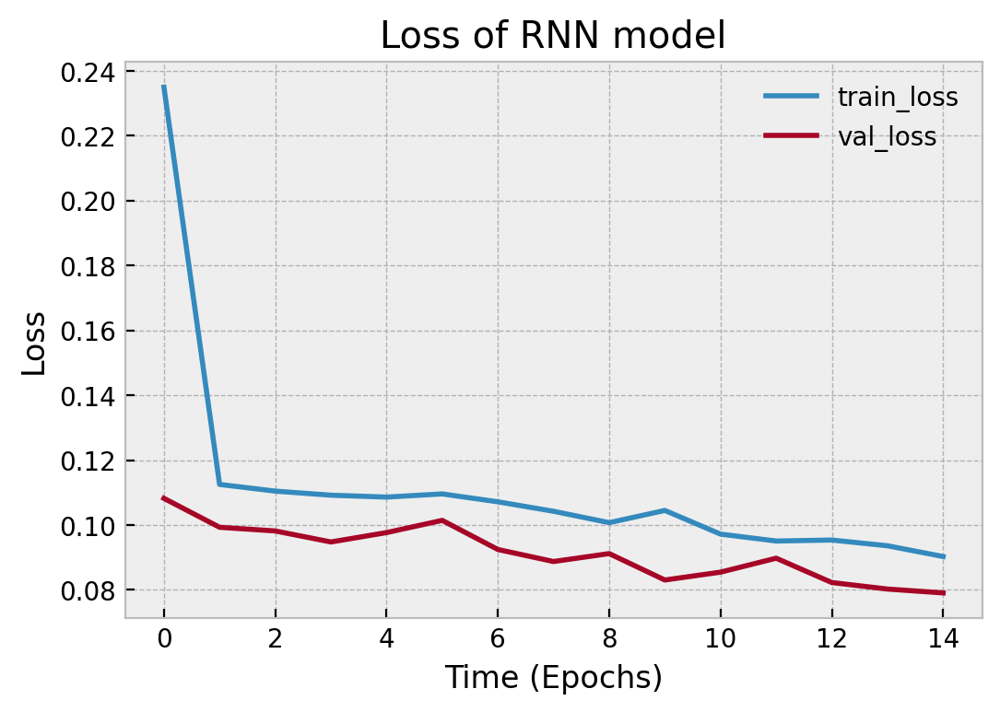

In [23]:
fig,ax=plt.subplots()
ax.plot(history.history['loss'], label='train_loss')
ax.plot(history.history['val_loss'], label='val_loss')
ax.set_title('Loss of RNN model')
ax.set_xlabel('Time (Epochs)')
ax.set_ylabel('Loss')
ax.legend()

As seen in the plot, both the validation loss and training loss are gradually decreasing over time and do not diverge, which is good. 

The model output is plotted below with comparison to the true future. The results show that the model does a reasonable job of predicting the underlying trends. Assuming that the high variation in the true data is statistical noise, then we should want the model to not follow the sharp discontinuities. 

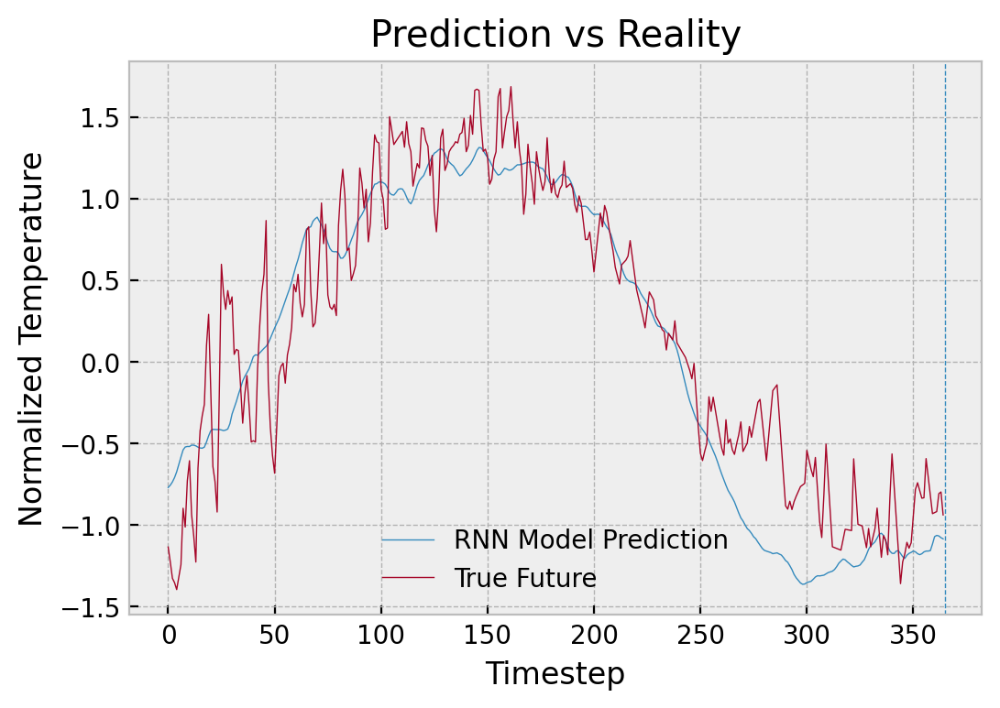

In [24]:
test_predict = rnn.predict(test_data[:offset])
fig,ax=plt.subplots()
ax.plot(test_predict, linewidth=0.5, label="RNN Model Prediction")
ax.plot(test_label[:offset], linewidth=0.5, label="True Future")
ax.axvline(365, linestyle='--', linewidth=0.5)
ax.set_title("Prediction vs Reality")
ax.set_xlabel("Timestep")
ax.set_ylabel("Normalized Temperature")
ax.legend()

### CNN
Convolutional neural networks (CNNs) make predictions based on a fixed-width history, but the width is shorter than the RNN, therefore, we should expect worse predictive performance from the CNN compared to the RNN. However, this serves as a good comparison to the performance of the RNN.

The function below creates a cnn model using Conv1D, MaxPooling1D, and Dense layers.

In [25]:
def cnn_model(windowsize):
    """
    function to create model, input windowsize needs to be same as the windowsize defined in create_data()
    """
    cnn = keras.models.Sequential()
    cnn.add(keras.layers.Conv1D(64, 3,input_shape=(windowsize,1)))
    cnn.add(keras.layers.MaxPooling1D((2)))
    cnn.add(keras.layers.Conv1D(16, 3, activation='relu'))
    cnn.add(keras.layers.Flatten())
    cnn.add(keras.layers.Dense(64, activation='relu'))
    cnn.add(keras.layers.Dense(1,activation="linear"))
    cnn.compile(loss='mean_squared_error',optimizer='adam')
    return cnn

The cnn_model function is called to create a CNN model and the model is trained using the training  and validation data and labels. 

In [26]:
cnn = cnn_model(windowsize)
history = cnn.fit(train_data,train_label,epochs=15,batch_size=128,verbose=1,validation_data=(val_data,val_label))

Epoch 1/15
37/37 [==============================] - 1s 8ms/step - loss: 0.2212 - val_loss: 0.1020
Epoch 2/15
37/37 [==============================] - 0s 6ms/step - loss: 0.1003 - val_loss: 0.0986
Epoch 3/15
37/37 [==============================] - 0s 6ms/step - loss: 0.0997 - val_loss: 0.0942
Epoch 4/15
37/37 [==============================] - 0s 6ms/step - loss: 0.0945 - val_loss: 0.0933
Epoch 5/15
37/37 [==============================] - 0s 6ms/step - loss: 0.0947 - val_loss: 0.0927
Epoch 6/15
37/37 [==============================] - 0s 5ms/step - loss: 0.0934 - val_loss: 0.1042
Epoch 7/15
37/37 [==============================] - 0s 6ms/step - loss: 0.0914 - val_loss: 0.0910
Epoch 8/15
37/37 [==============================] - 0s 6ms/step - loss: 0.0914 - val_loss: 0.0895
Epoch 9/15
37/37 [==============================] - 0s 5ms/step - loss: 0.0885 - val_loss: 0.1016
Epoch 10/15
37/37 [==============================] - 0s 5ms/step - loss: 0.0880 - val_loss: 0.0902
Epoch 11/15
37/37 [

A summary of the structure of the CNN is outputted below

In [27]:
cnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 48, 64)            256       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 24, 64)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 22, 16)            3088      
                                                                 
 flatten (Flatten)           (None, 352)               0         
                                                                 
 dense_2 (Dense)             (None, 64)                22592     
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                      

The training loss and validation loss of the RNN model is plotted below against epochs

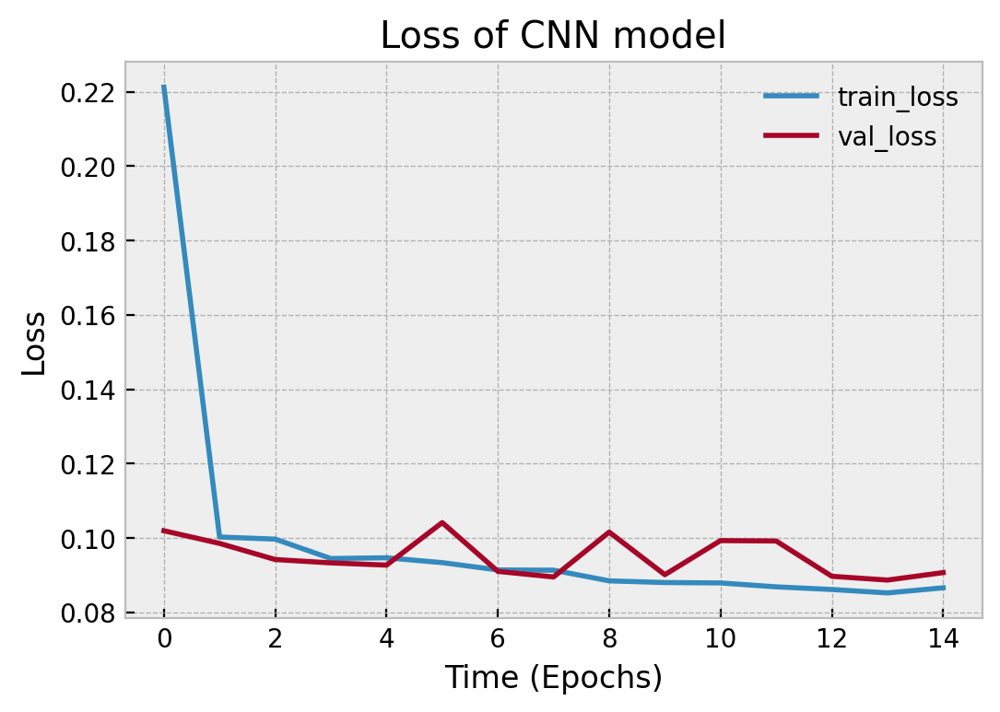

In [28]:
fig,ax=plt.subplots()
ax.plot(history.history['loss'], label='train_loss') #training loss
ax.plot(history.history['val_loss'], label='val_loss') #val loss
ax.set_title('Loss of CNN model')
ax.set_xlabel('Time (Epochs)')
ax.set_ylabel('Loss')
ax.legend()

As seen in the plot, both the validation loss and training loss are gradually decreasing over time and do not diverge, which is good. 

The model output is plotted below with comparison to the true future. The results show that the model does a reasonable job of predicting the underlying trends. Compared to the output from the RNN, the CNN output appears more discontinuous with more statistical noise. This suggests that the RNN does a better job at predicting the underlying trends compared to the CNN output. 

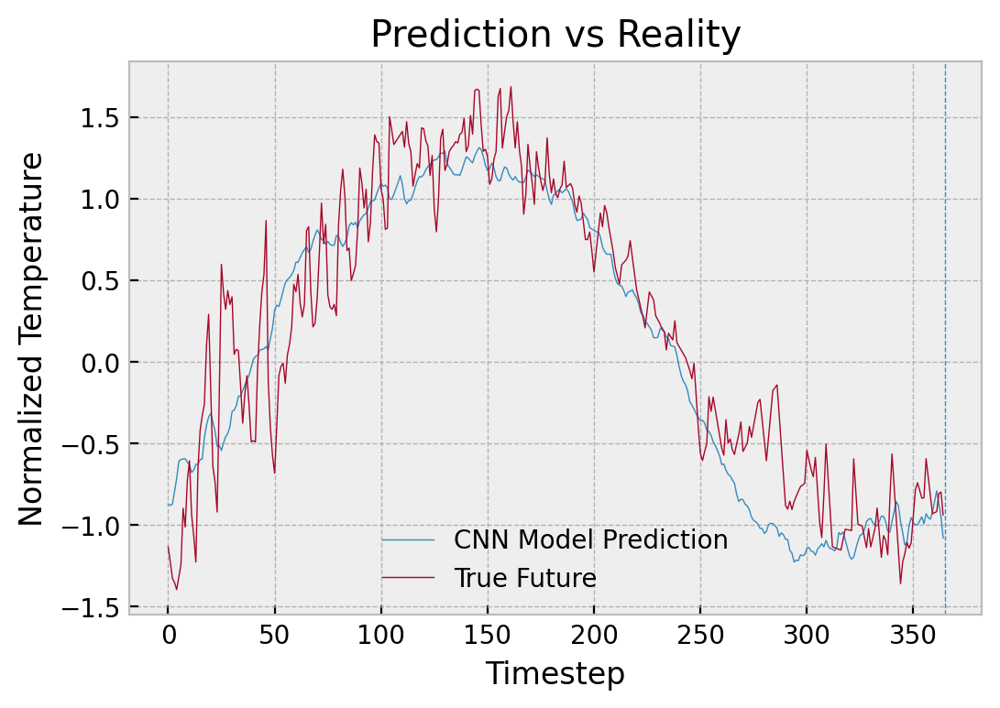

In [29]:
test_predict=cnn.predict(test_data[:offset])
fig,ax=plt.subplots()
ax.plot(test_predict, linewidth=0.5, label="CNN Model Prediction")
ax.plot(test_label[:offset], linewidth=0.5, label="True Future")
ax.axvline(365, linestyle='--', linewidth=0.5)
ax.set_title("Prediction vs Reality")
ax.set_xlabel("Timestep")
ax.set_ylabel("Normalized Temperature")
ax.legend()

### Dense Model
The simplest model is just a model with dense layers. The function below creates a model with just dense layers.

In [30]:
def dense_model(windowsize):
    """
    function to create model, input windowsize needs to be same as the windowsize defined in create_data()
    """
    dense = keras.models.Sequential()
    dense.add(keras.layers.Dense(128, activation='relu', input_shape=(windowsize,1)))
    dense.add(keras.layers.Dense(64, activation='relu'))
    dense.add(keras.layers.Flatten())
    dense.add(keras.layers.Dense(32 , activation='relu'))
    dense.add(keras.layers.Dense(1, activation='linear'))
    dense.compile(loss='mean_squared_error',optimizer='adam')
    return dense

Model is created and trained

In [31]:
dense = dense_model(windowsize)
history = dense.fit(train_data,train_label,epochs=15,batch_size=128,verbose=1,validation_data=(val_data,val_label))

Epoch 1/15
37/37 [==============================] - 1s 9ms/step - loss: 0.1817 - val_loss: 0.1073
Epoch 2/15
37/37 [==============================] - 0s 7ms/step - loss: 0.1010 - val_loss: 0.1000
Epoch 3/15
37/37 [==============================] - 0s 7ms/step - loss: 0.0964 - val_loss: 0.1038
Epoch 4/15
37/37 [==============================] - 0s 7ms/step - loss: 0.0964 - val_loss: 0.0946
Epoch 5/15
37/37 [==============================] - 0s 7ms/step - loss: 0.0968 - val_loss: 0.0874
Epoch 6/15
37/37 [==============================] - 0s 7ms/step - loss: 0.0964 - val_loss: 0.1061
Epoch 7/15
37/37 [==============================] - 0s 7ms/step - loss: 0.0924 - val_loss: 0.0899
Epoch 8/15
37/37 [==============================] - 0s 7ms/step - loss: 0.0899 - val_loss: 0.0897
Epoch 9/15
37/37 [==============================] - 0s 7ms/step - loss: 0.0888 - val_loss: 0.0885
Epoch 10/15
37/37 [==============================] - 0s 7ms/step - loss: 0.0889 - val_loss: 0.0950
Epoch 11/15
37/37 [

Model structure is shown below

In [32]:
dense.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 50, 128)           256       
                                                                 
 dense_5 (Dense)             (None, 50, 64)            8256      
                                                                 
 flatten_1 (Flatten)         (None, 3200)              0         
                                                                 
 dense_6 (Dense)             (None, 32)                102432    
                                                                 
 dense_7 (Dense)             (None, 1)                 33        
                                                                 
Total params: 110,977
Trainable params: 110,977
Non-trainable params: 0
_________________________________________________________________


The loss is plotted against time below. The validation loss does not decrease over time which suggests that the training is not increasing the performance of the model and the model is not learning. The validation loss diverging from the training loss could also suggest overfitting.

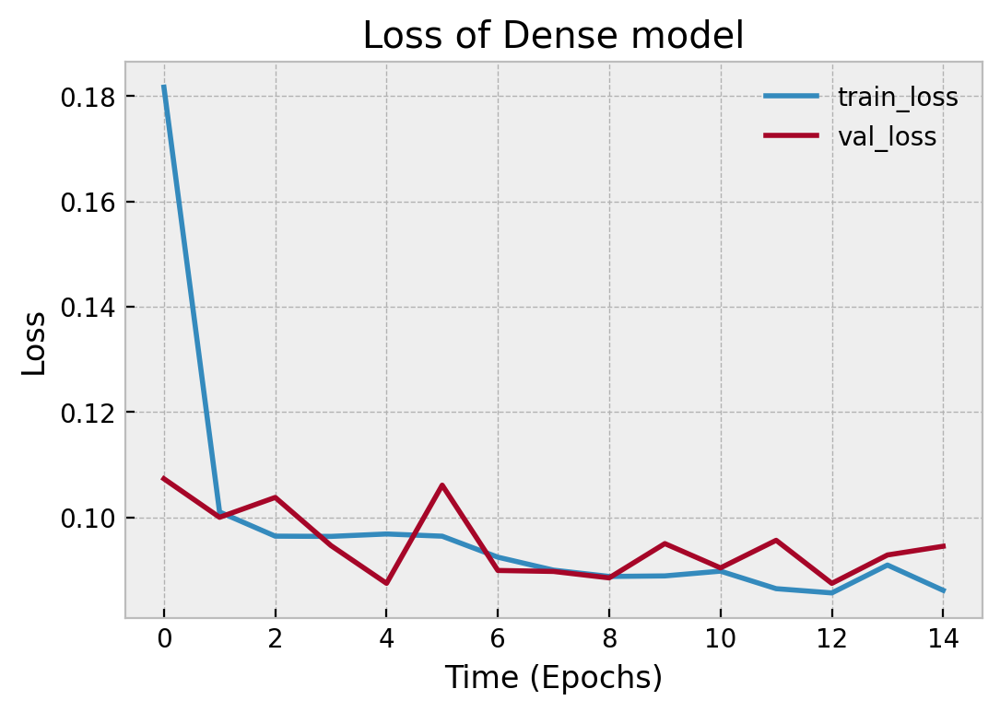

In [33]:
fig,ax=plt.subplots()
ax.plot(history.history['loss'], label='train_loss')
ax.plot(history.history['val_loss'], label='val_loss')
ax.set_title('Loss of Dense model')
ax.set_xlabel('Time (Epochs)')
ax.set_ylabel('Loss')
ax.legend()

Surprisingly, the dense model shows relatively good performance compared to the CNN and RNN. However, it also follows the statistical noise similar to the CNN.

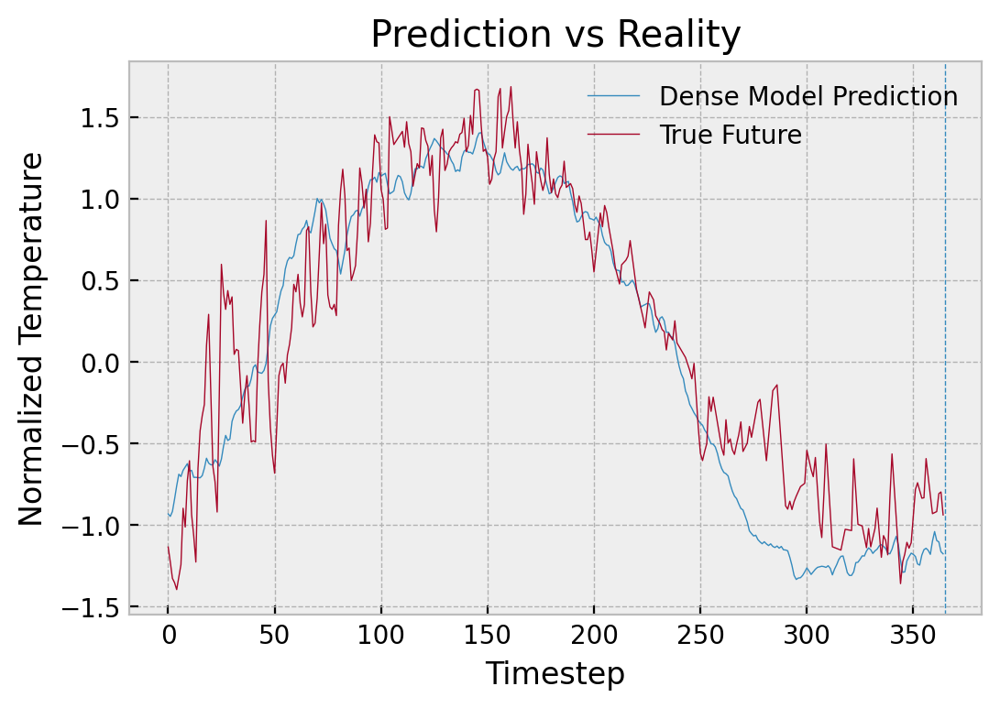

In [34]:
test_predict=dense.predict(test_data[:offset])
fig,ax=plt.subplots()
ax.plot(test_predict, linewidth=0.5, label="Dense Model Prediction")
ax.plot(test_label[:offset], linewidth=0.5, label="True Future")
ax.axvline(365, linestyle='--', linewidth=0.5)
ax.set_title("Prediction vs Reality")
ax.set_xlabel("Timestep")
ax.set_ylabel("Normalized Temperature")
ax.legend()

## Comparing different models (Dense, CNN, RNN) for different stations

The function below combines the data preprocessing functions into 1 function and returns the training, validation, and testing data and labels given the temperature dataframe.

In [35]:
## Data processing function
def procData(df, offset=365, windowsize=50):
    """
    function to process data, combines all of the functions listed above
    normalizes data, sequences data, cleans sequenced dataframe, and splits into training, validation, and testing 
    inputs and labels
    """
    norm_df = normalize(df)
    df = create_data(norm_df, windowsize, offset)
    clean_df = clean_data(df)
    train_data, train_label, val_data, val_label, test_data, test_label = split(clean_df)
    return train_data, train_label, val_data, val_label, test_data, test_label

Training and comparing the models for stat 0 and 220, chosen as the recent temperature data does not contain that massive holes. 

Station # 0 is AE000041196 is SHARJAH INTER. AIRP, United Arab Emirates at 25.333, 55.517, 34.0
Station # 924 is USW00023066 is GRAND JUNCTION WALKER FLD, United States at 39.1342, -108.54, 1480.7
Station # 934 is USW00024131 is BOISE AIR TERMINAL, United States at 43.5667, -116.2406, 857.7


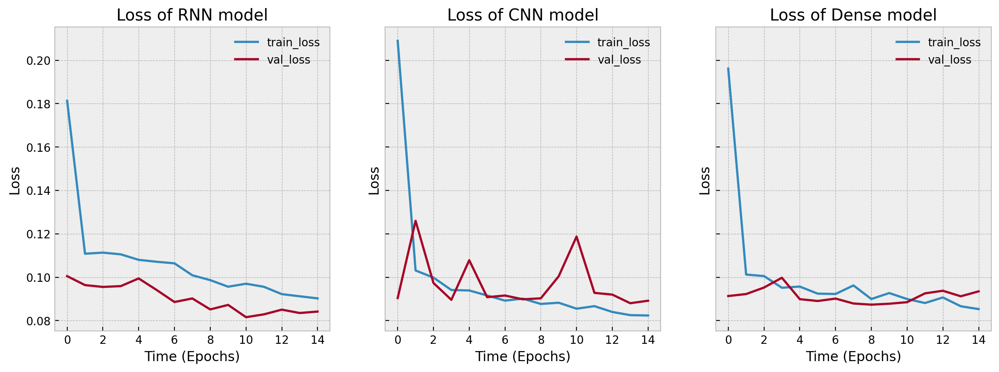

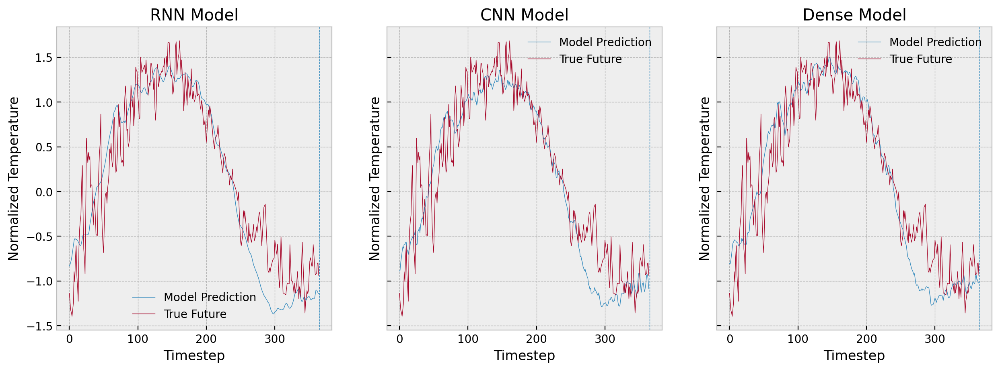

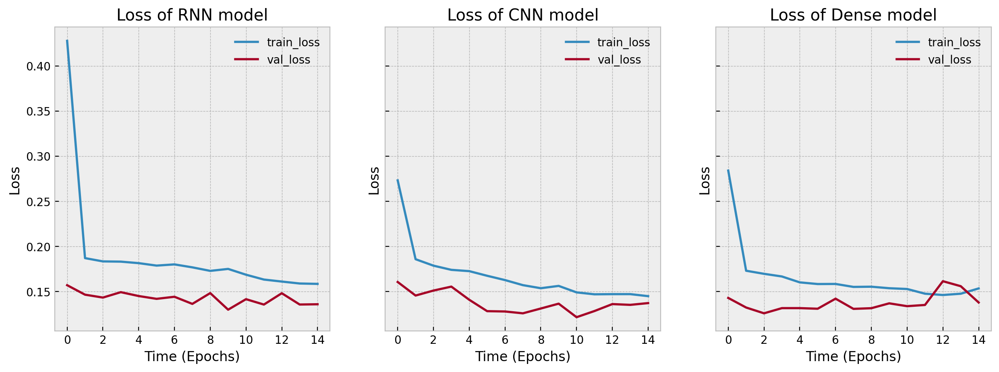

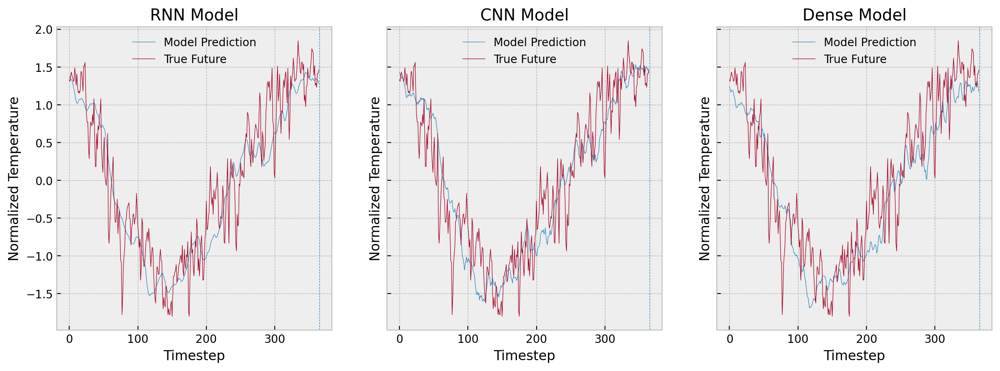

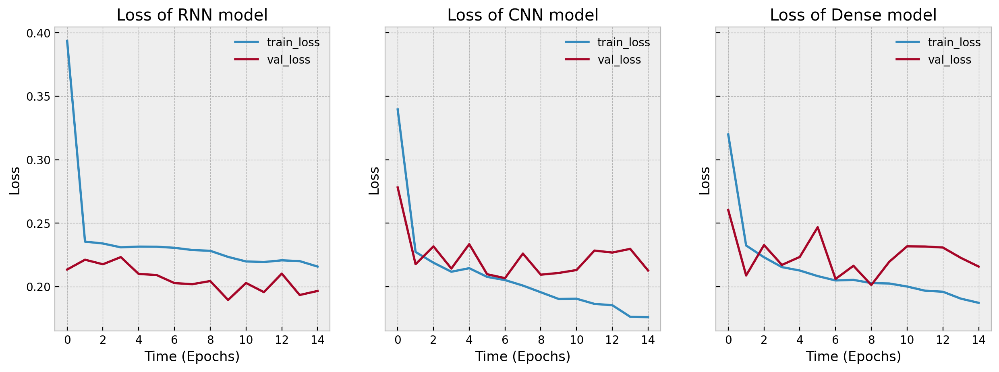

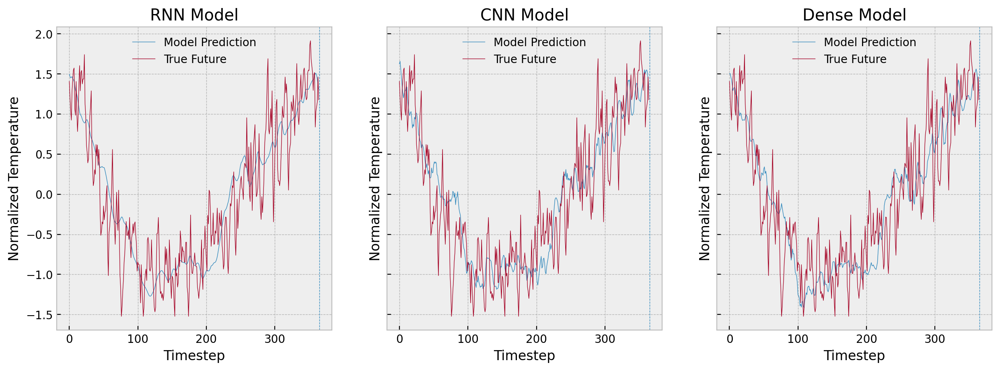

In [36]:
#statNames=ghn.getStatKeyNames()
offset = 365
for i in [0,924,934]:
    df_daily, df_weekly, df_monthly = getTemp(i)
    train_data, train_label, val_data, val_label, test_data, test_label = procData(df_daily)
    
    model1 = rnn_model(windowsize=50)
    history1 = model1.fit(train_data,train_label,epochs=15,batch_size=128,verbose=0,validation_data=(val_data,val_label))
    
    model2 = cnn_model(windowsize=50)
    history2 = model2.fit(train_data,train_label,epochs=15,batch_size=128,verbose=0,validation_data=(val_data,val_label))
    
    model3 = dense_model(windowsize=50)
    history3 = model3.fit(train_data,train_label,epochs=15,batch_size=128,verbose=0,validation_data=(val_data,val_label))    
    
    fig,ax=plt.subplots(1,3, figsize = (15,5), sharex=True, sharey=True)
    
    ax[0].plot(history1.history['loss'], label='train_loss')
    ax[0].plot(history1.history['val_loss'], label='val_loss')
    ax[0].set_title('Loss of RNN model')
    ax[0].set_xlabel('Time (Epochs)')
    ax[0].set_ylabel('Loss')
    ax[0].legend()
    
    ax[1].plot(history2.history['loss'], label='train_loss')
    ax[1].plot(history2.history['val_loss'], label='val_loss')
    ax[1].set_title('Loss of CNN model')
    ax[1].set_xlabel('Time (Epochs)')
    ax[1].set_ylabel('Loss')
    ax[1].legend()    
    
    ax[2].plot(history3.history['loss'], label='train_loss')
    ax[2].plot(history3.history['val_loss'], label='val_loss')
    ax[2].set_title('Loss of Dense model')
    ax[2].set_xlabel('Time (Epochs)')
    ax[2].set_ylabel('Loss')
    ax[2].legend()
    
    test_predict1 = model1.predict(test_data[:offset])
    test_predict2 = model2.predict(test_data[:offset])
    test_predict3 = model3.predict(test_data[:offset])
    
    fig,ax=plt.subplots(1,3, figsize = (15,5), sharex=True, sharey=True)
    
    ax[0].plot(test_predict1, linewidth=0.5, label="Model Prediction")
    ax[0].plot(test_label[:offset], linewidth=0.5, label="True Future")
    ax[0].axvline(offset, linestyle='--', linewidth=0.5)
    ax[0].set_title("RNN Model")
    ax[0].set_xlabel("Timestep")
    ax[0].set_ylabel("Normalized Temperature")
    ax[0].legend()
    
    ax[1].plot(test_predict2, linewidth=0.5, label="Model Prediction")
    ax[1].plot(test_label[:offset], linewidth=0.5, label="True Future")
    ax[1].axvline(offset, linestyle='--', linewidth=0.5)
    ax[1].set_title("CNN Model")
    ax[1].set_xlabel("Timestep")
    ax[1].set_ylabel("Normalized Temperature")
    ax[1].legend()
    
    ax[2].plot(test_predict3, linewidth=0.5, label="Model Prediction")
    ax[2].plot(test_label[:offset], linewidth=0.5, label="True Future")
    ax[2].axvline(offset, linestyle='--', linewidth=0.5)
    ax[2].set_title("Dense Model")
    ax[2].set_xlabel("Timestep")
    ax[2].set_ylabel("Normalized Temperature")
    ax[2].legend()

Based on the results, it can be seen that the RNN performs the best as it has low validation loss and has good predicative performance as it predicts the underlying temperature trends quite well. This could be because RNNs use Long Short Term Memory (LSTM) modules which has feedback connections and can process sequences of data unlike CNNs and Dense networks. 

It is also the only model that has decreasing validation loss, whereas for the other 2 models, the validation loss appears relatively constant over time, which means the CNN and Dense models are not "learning" over time. Whereas for the RNN model, the model is learning over time.

Therefore, for the task, I chose to create only RNN models. 

# Task 1: Predicting weekly/monthly average of maximum/minimum temperature, snow, and precipitation a year in advance

For this task, I decided to split up the parameters and tackle them separately. I started with Tmax, which is the maximum daily temperature. 

## TMAX (Maximum daily temperature)

When Tmax is retrieved from the GHCN database, it comes as a date with a corresponding temperature as two separate arrays. Therefore, this function retrieves the Tmax from a given station and processes the data by putting it into a pandas dataframe and filling any holes in the data using linear interpolation. It is recommended that a dataset with minimal amount of holes is used, as linear interpolation over a large hole is not suitable. 

The function also processes the daily temperatures into weekly and monthly averages, which is the required form for this task. 

In [37]:
def getTmax(station):
    """
    function to retrieve maximum temperatures from a station into daily, weekly, and monthly values
    returns 3 dataframes with daily, weekly, and monthly means.
    """
    fileName=statNames[station]+'.dly' #get filename, stationID + .dly
    data=ghn.processFile(fileName) #get station data using given function
    print("Station #", station, "is", ghn.getStation(statNames[station])) #outputs station name, ID
    
    tmaxArray=ghn.getVar(data,varName='TMAX') #get TMAX data 

    days, tmax = zip(*tmaxArray) #unpack into date and temp values
    
    tmaxData = {'Date': days, 'Tmax': tmax} #create data array 
    
    #create dataframe using data array
    df_tmax = pd.DataFrame(data = tmaxData)
    
    #set the index of dataframes as the date
    df_tmax.index = pd.to_datetime(df_tmax['Date'])
    
    #resample the dataframes so that the missing dates in between (holes) are included
    tmax_daily = df_tmax.resample('1d').mean()
    #interpolate the missing values linearly
    tmax_daily = tmax_daily.interpolate()
    #weekly mean is calculated as the 7 day average of daily dataframe
    tmax_weekly = tmax_daily.resample('7d').mean()
    #monthly mean is calculated using date index of daily dataframe
    tmax_monthly = tmax_daily.resample('M').mean()

    return tmax_daily, tmax_weekly, tmax_monthly

The station number 924 was chosen as after trial and error of retrieving data, it appeared to be the station where the data had a minimal amount of holes, over a large period of time. The station is also based in an area where there is a wide range of temperature. As seen in the plots of monthly and weekly average of tmax below

In [38]:
tmax_daily, tmax_weekly, tmax_monthly = getTmax(924)

Station # 924 is USW00023066 is GRAND JUNCTION WALKER FLD, United States at 39.1342, -108.54, 1480.7


A plot of monthly and weekly averages are shown below for station number 924, this is done to visualize the variation of the data and to spot any potential holes. 

<AxesSubplot:xlabel='Date'>

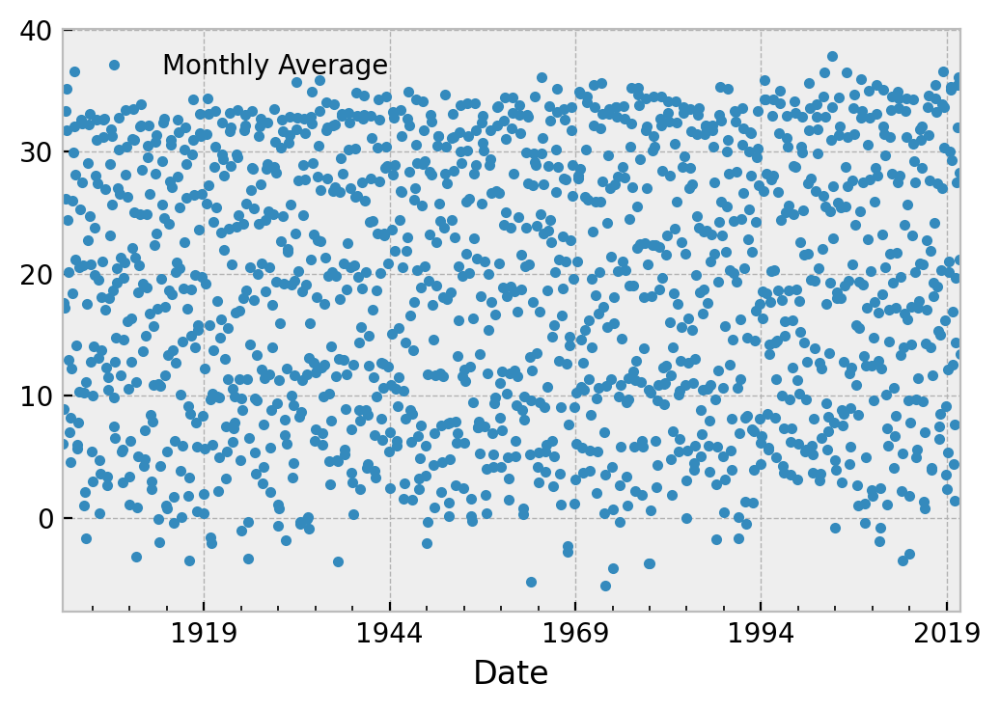

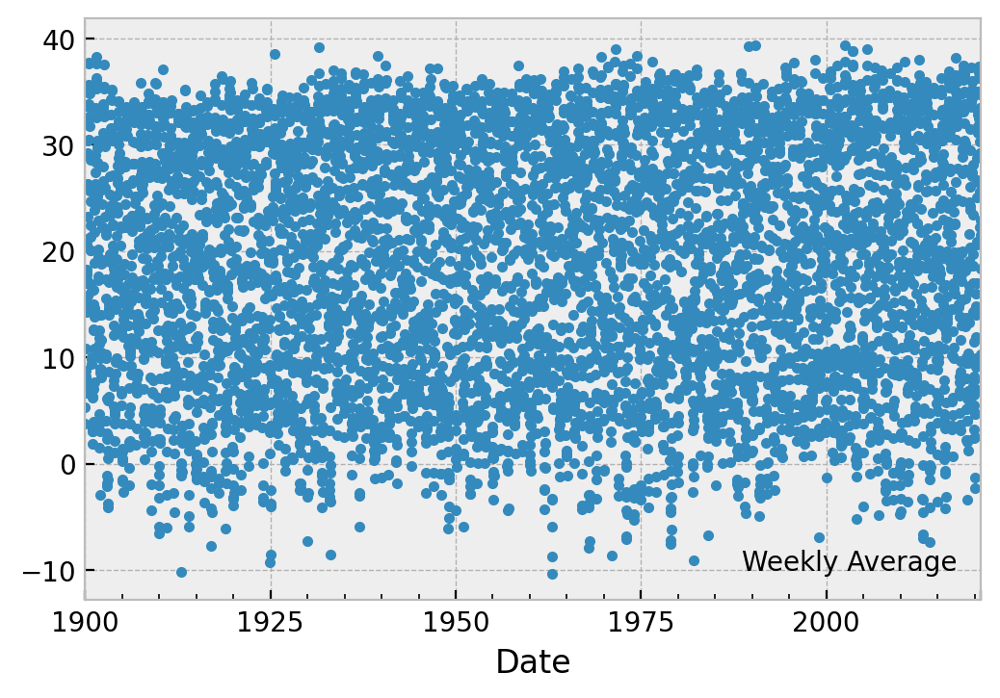

In [39]:
tmax_monthly.plot(y='Tmax', use_index=True, style='.', label='Monthly Average')
tmax_weekly.plot(y='Tmax', use_index=True, style='.', label='Weekly Average')

Since we are now dealing with weekly averages, as the task specifies, the offset is now equal to 52, which is roughly the amount of weeks in a year, as we are predicting the average weekly temperatures after a year. 

In [40]:
offset = 52 # time in advance we want to predict #monthly = 12, weekly = 52
tmax_daily, tmax_weekly, tmax_monthly = getTmax(924) #get data
train_data, train_label, val_data, val_label, test_data, test_label = procData(tmax_weekly, offset = 52) #get input/labels

Station # 924 is USW00023066 is GRAND JUNCTION WALKER FLD, United States at 39.1342, -108.54, 1480.7


Training model only using RNN now as it has the best performance based on previous testing

In [41]:
tmax_model = rnn_model(windowsize) #create model
#train model
history = tmax_model.fit(train_data,train_label,epochs=15,batch_size=64,verbose=1,validation_data=(val_data,val_label))

Epoch 1/15
73/73 [==============================] - 4s 31ms/step - loss: 0.2613 - val_loss: 0.1084
Epoch 2/15
73/73 [==============================] - 2s 26ms/step - loss: 0.1041 - val_loss: 0.1057
Epoch 3/15
73/73 [==============================] - 2s 25ms/step - loss: 0.1010 - val_loss: 0.1008
Epoch 4/15
73/73 [==============================] - 2s 26ms/step - loss: 0.0981 - val_loss: 0.1052
Epoch 5/15
73/73 [==============================] - 2s 25ms/step - loss: 0.0988 - val_loss: 0.1017
Epoch 6/15
73/73 [==============================] - 2s 25ms/step - loss: 0.0983 - val_loss: 0.1011
Epoch 7/15
73/73 [==============================] - 2s 25ms/step - loss: 0.0978 - val_loss: 0.0977
Epoch 8/15
73/73 [==============================] - 2s 27ms/step - loss: 0.0952 - val_loss: 0.0959
Epoch 9/15
73/73 [==============================] - 2s 26ms/step - loss: 0.0965 - val_loss: 0.1171
Epoch 10/15
73/73 [==============================] - 2s 26ms/step - loss: 0.0963 - val_loss: 0.0972
Epoch 11/

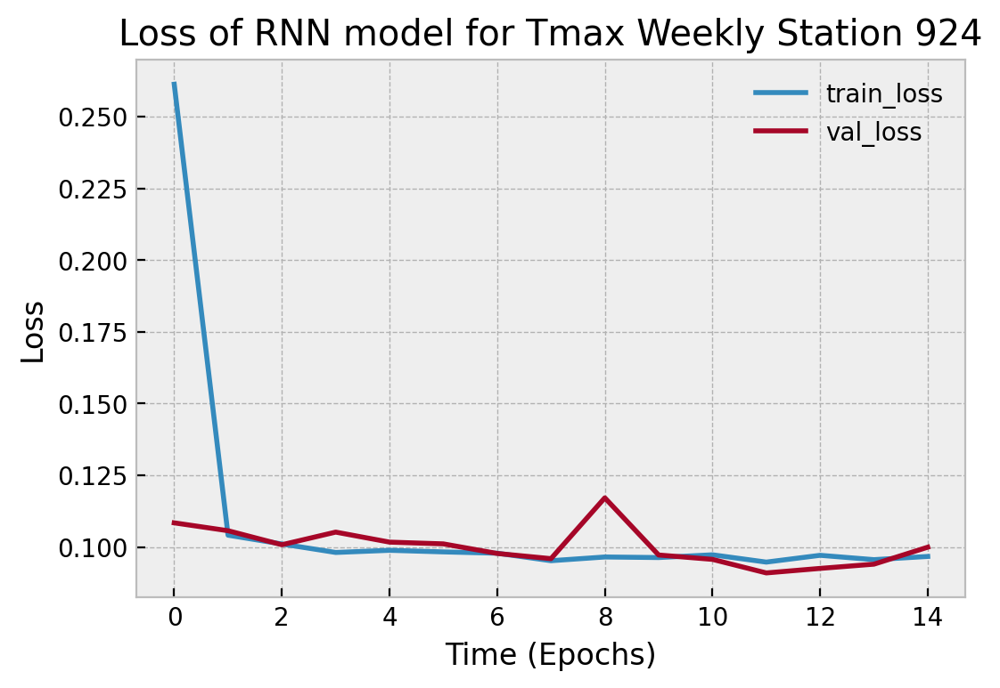

In [42]:
fig,ax=plt.subplots()
ax.plot(history.history['loss'], label='train_loss')
ax.plot(history.history['val_loss'], label='val_loss')
ax.set_title('Loss of RNN model for Tmax Weekly Station 924')
ax.set_xlabel('Time (Epochs)')
ax.set_ylabel('Loss')
ax.legend()

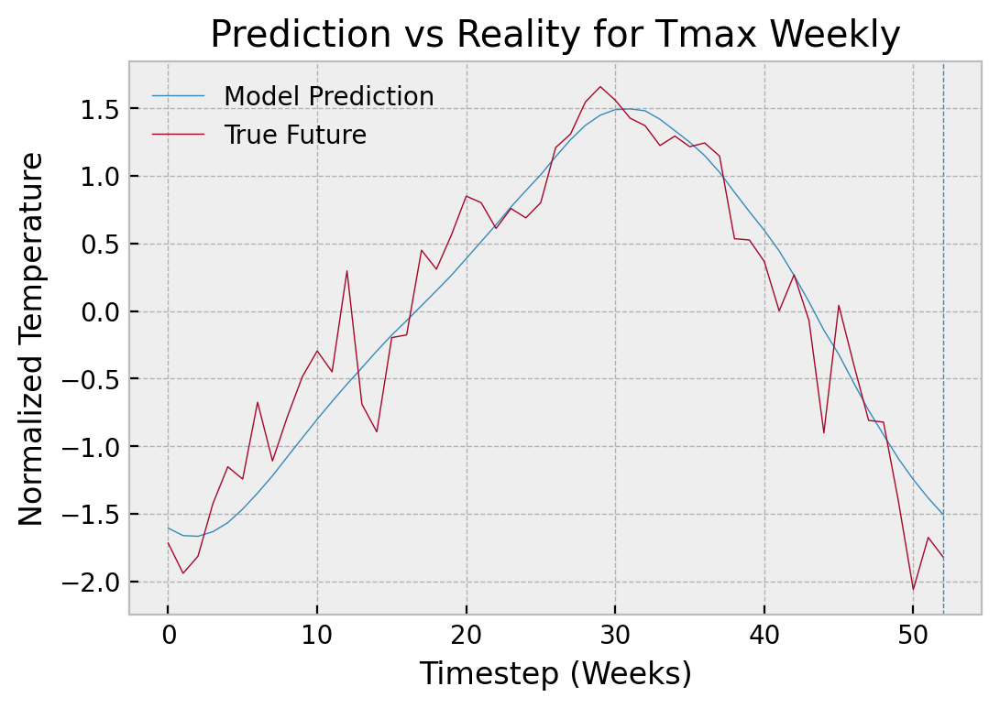

In [43]:
test_predict = tmax_model.predict(test_data[:offset+1])
fig,ax=plt.subplots()
ax.plot(test_predict, linewidth=0.5, label="Model Prediction")
ax.plot(test_label[:offset+1], linewidth=0.5, label="True Future")
ax.axvline(offset, linestyle='--', linewidth=0.5)
ax.set_title("Prediction vs Reality for Tmax Weekly")
ax.set_xlabel("Timestep (Weeks)")
ax.set_ylabel("Normalized Temperature")
ax.legend()

As seen in the plots above, the RNN model has good performance with relatively low loss after training. The validation and training loss converge and there is a gradual decrease in validation loss over time, which shows that the model is "learning" and the performance is improving

The model does a good job at predicting the underlying temperature trends. Assuming the volatility in the true data is statistical noise, then it is good that the model does not follow these noise discontinuities. 

The dotted vertical line shows the time after 1 year. From the plot, it can be seen that there is a slight difference between the true value and the predicted value at the vertical line, but the difference is small. 

## TMin  (Maximum daily temperature)

The process for the daily minimum temperature is very similar to the process for the daily maximum temperature. The function is the same, but the difference is that the TMIN parameter is retrieved. 

In [44]:
def getTmin(station):
    """
    function to retrieve minimum temperature data from a station
    returns 3 dataframes with daily, weekly, and monthly means
    """
    fileName=statNames[station]+'.dly' #get filename, stationID + .dly
    data=ghn.processFile(fileName) #get station data using given function
    print("Station #", station, "is", ghn.getStation(statNames[station])) #outputs station name, ID
    
    tminArray=ghn.getVar(data,varName='TMIN') #get TMIN daily data 

    days, tmin = zip(*tminArray) #unpack into date and temperature
   
    #create dataframe 
    tminData = {'Date': days, 'Tmin': tmin}  #
    df_tmin = pd.DataFrame(data = tminData)
    
    #set the index of dataframes as the date
    df_tmin.index = pd.to_datetime(df_tmin['Date'])
    
    #resample the dataframes so that the missing dates in between (holes) are included
    tmin_daily = df_tmin.resample('1d').mean()
    tmin_daily = tmin_daily.interpolate() #interpolate missing temperature values
    tmin_weekly = tmin_daily.resample('7d').mean() #find weekly mean
    tmin_monthly = tmin_daily.resample('M').mean() #find monthly mean

    return tmin_daily, tmin_weekly, tmin_monthly

The station number 924 was chosen as after trial and error of retrieving data, it appeared to be the station where the data had a minimal amount of holes, over a large period of time. The station is also based in an area where there is a wide range of temperature. As seen in the plots of monthly and weekly average of tmax below

In [45]:
tmin_daily, tmin_weekly, tmin_monthly = getTmin(924) #get tmin data for station

Station # 924 is USW00023066 is GRAND JUNCTION WALKER FLD, United States at 39.1342, -108.54, 1480.7


A plot of monthly and weekly averages are shown below for station number 924, this is done to visualize the variation of the data and to spot any potential holes. 

<AxesSubplot:xlabel='Date'>

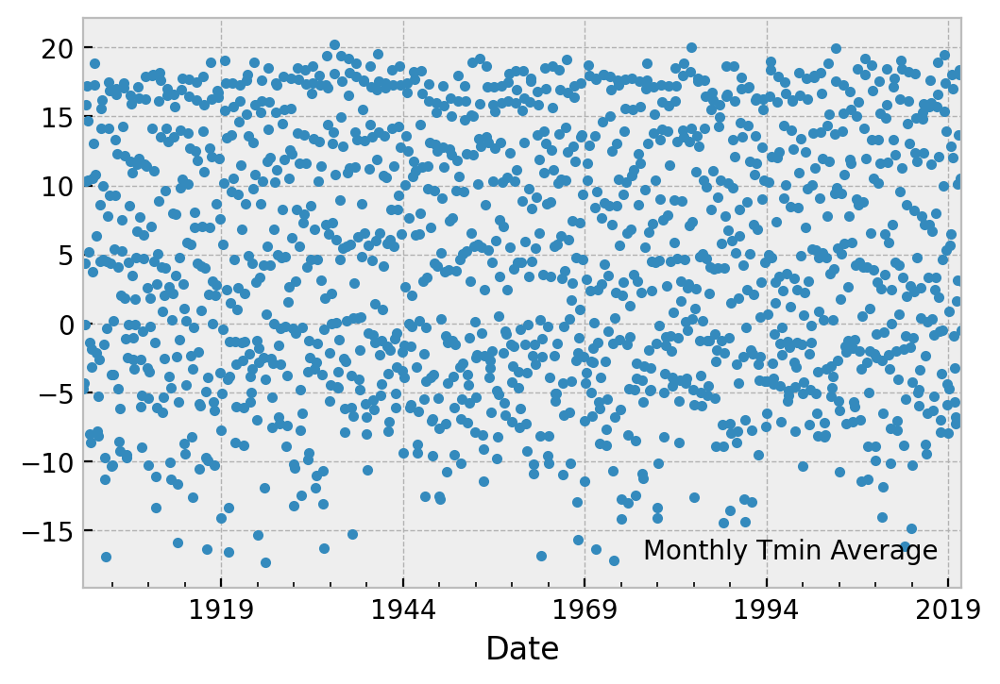

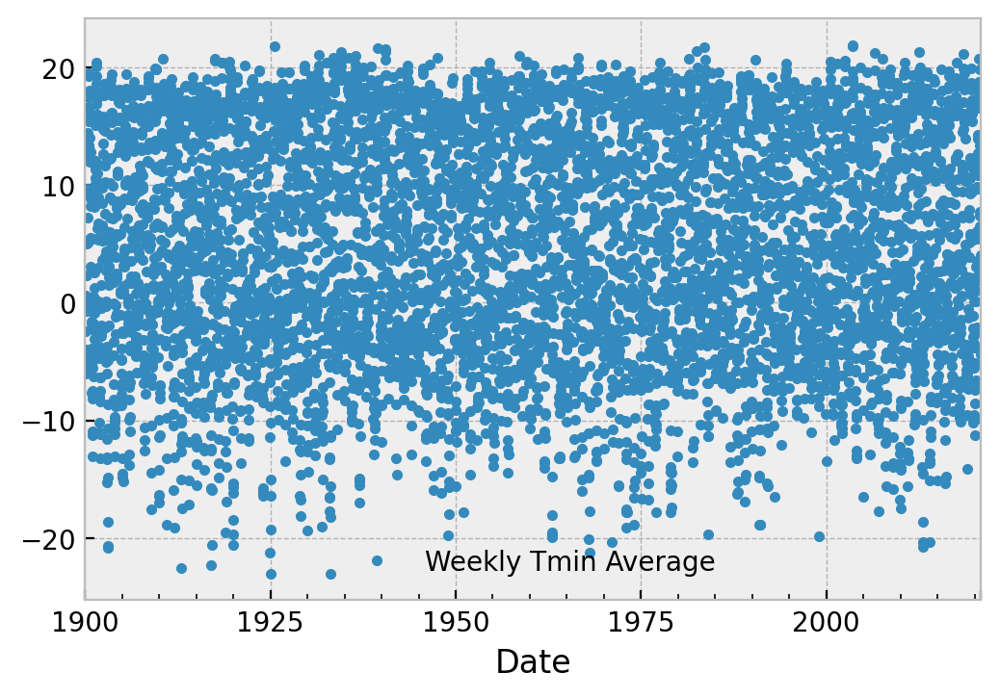

In [46]:
tmin_monthly.plot(y='Tmin', use_index=True, style='.', label='Monthly Tmin Average')
tmin_weekly.plot(y='Tmin', use_index=True, style='.', label='Weekly Tmin Average')

Since we are now dealing with weekly averages, as the task specifies, the offset is now equal to 52, which is roughly the amount of weeks in a year, as we are predicting the average weekly temperatures after a year. 

In [47]:
offset = 52 #monthly = 12, weekly = 52
tmin_daily, tmin_weekly, tmin_monthly = getTmin(924)
train_data, train_label, val_data, val_label, test_data, test_label = procData(tmin_weekly, offset = 52)

Station # 924 is USW00023066 is GRAND JUNCTION WALKER FLD, United States at 39.1342, -108.54, 1480.7


Creating and training the model

In [48]:
tmin_model = rnn_model(windowsize) #create model
#train model
history = tmin_model.fit(train_data,train_label,epochs=15,batch_size=64,verbose=1,validation_data=(val_data,val_label))

Epoch 1/15
73/73 [==============================] - 4s 33ms/step - loss: 0.2317 - val_loss: 0.0909
Epoch 2/15
73/73 [==============================] - 2s 25ms/step - loss: 0.1073 - val_loss: 0.0806
Epoch 3/15
73/73 [==============================] - 2s 24ms/step - loss: 0.1027 - val_loss: 0.0800
Epoch 4/15
73/73 [==============================] - 2s 24ms/step - loss: 0.0999 - val_loss: 0.0808
Epoch 5/15
73/73 [==============================] - 2s 25ms/step - loss: 0.1070 - val_loss: 0.0867
Epoch 6/15
73/73 [==============================] - 2s 25ms/step - loss: 0.1006 - val_loss: 0.0822
Epoch 7/15
73/73 [==============================] - 2s 26ms/step - loss: 0.0975 - val_loss: 0.0773
Epoch 8/15
73/73 [==============================] - 2s 25ms/step - loss: 0.0960 - val_loss: 0.0821
Epoch 9/15
73/73 [==============================] - 2s 25ms/step - loss: 0.0977 - val_loss: 0.0857
Epoch 10/15
73/73 [==============================] - 2s 27ms/step - loss: 0.1008 - val_loss: 0.0891
Epoch 11/

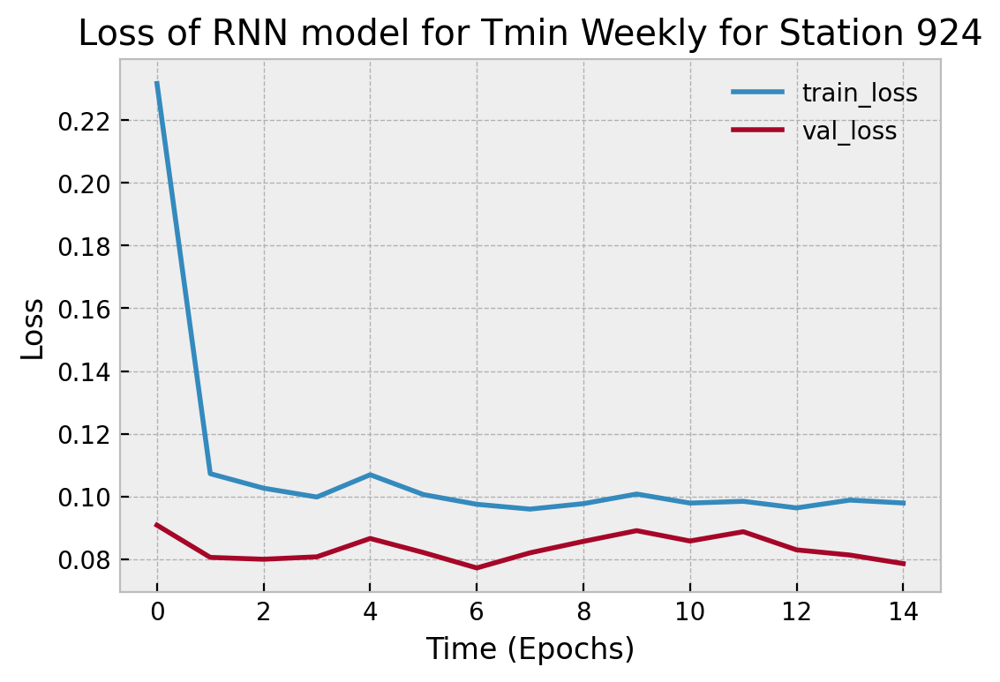

In [49]:
fig,ax=plt.subplots()
ax.plot(history.history['loss'], label='train_loss') #plot train loss
ax.plot(history.history['val_loss'], label='val_loss') #plot val loss
ax.set_title('Loss of RNN model for Tmin Weekly for Station 924')
ax.set_xlabel('Time (Epochs)')
ax.set_ylabel('Loss')
ax.legend()

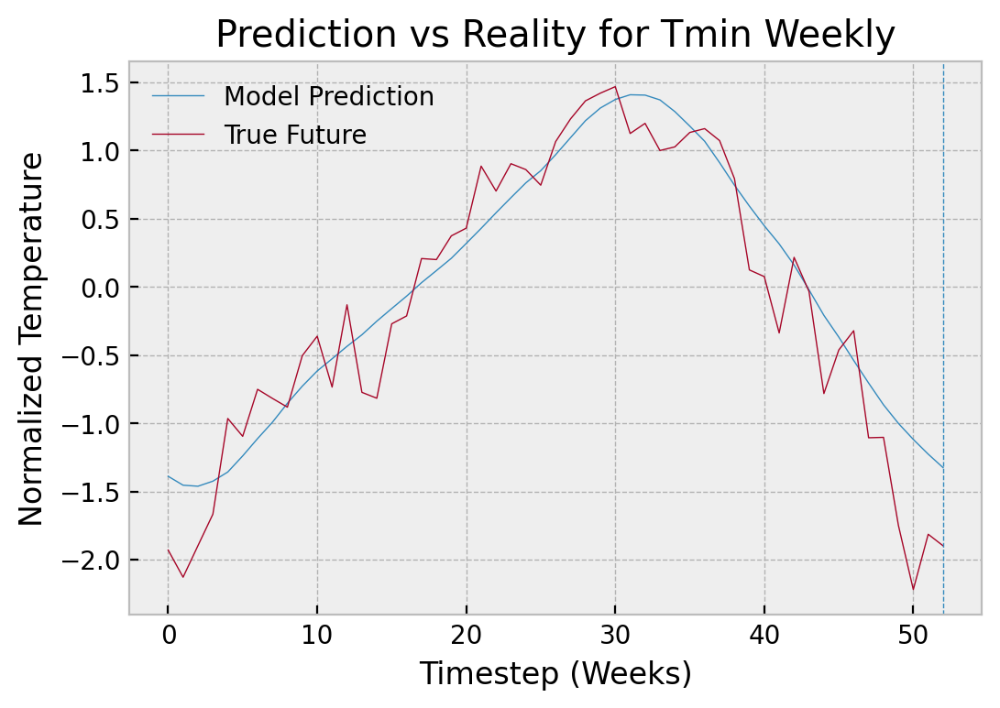

In [50]:
test_predict = tmin_model.predict(test_data[:offset+1])
fig,ax=plt.subplots()
ax.plot(test_predict, linewidth=0.5, label="Model Prediction")
ax.plot(test_label[:offset+1], linewidth=0.5, label="True Future")
ax.axvline(offset, linestyle='--', linewidth=0.5)
ax.set_title("Prediction vs Reality for Tmin Weekly")
ax.set_xlabel("Timestep (Weeks)")
ax.set_ylabel("Normalized Temperature")
ax.legend()

As seen in the plots above, the RNN model has good performance with relatively low loss after training. This Tmin model also does a good job at predicting the underlying temperature trends. Assuming the volatility in the true data is statistical noise, then it is good that the model does not follow these noise discontinuities. 

However, although the model does a good job at predicting the underlying trends, for this task, we want the climate 1 year after. Based on the plot, there is a large residual between the model prediction and the true future at the 1 year mark.

# SNOW DEPTH
Similar function as above to retrieve snow depth from a station. The NaN values this time are not interpolated but filled with 0s instead.

In [51]:
def getSnwd(station):
    """
    function to retrieve snow depth data of a station
    returns 3 dataframes with daily, weekly, and monthly means
    """
    fileName=statNames[station]+'.dly' #get filename, stationID + .dly
    data=ghn.processFile(fileName) #get station data using given function
    print("Station #", station, "is", ghn.getStation(statNames[station])) #outputs station name, ID
    
    snowArray=ghn.getVar(data,varName='SNWD') #get SNWD daily data 

    days, snwd = zip(*snowArray)
    
    snwdData = {'Date': days, 'Snowdepth': snwd} 
    
    #create dataframe for snow
    df_snwd = pd.DataFrame(data = snwdData)
    
    #set the index of dataframes as the date
    df_snwd.index = pd.to_datetime(df_snwd['Date'])
    
    #resample the dataframes so that the missing dates in between (holes) are included
    snwd_daily = df_snwd.resample('1d').mean()
    snwd_daily = snwd_daily.fillna(0)
    snwd_weekly = snwd_daily.resample('7d').mean()
    snwd_monthly = snwd_daily.resample('M').mean()

    return snwd_daily, snwd_weekly, snwd_monthly

Station 946 is an airport in Alaska, USA which provides snow depth data from 1930s with minimal holes. 

In [52]:
snwd_daily, snwd_weekly, snwd_monthly = getSnwd(946)

Station # 946 is USW00026411 is FAIRBANKS INTL AP, United States at 64.8039, -147.8761, 131.7


Visualization of monthly and weekly snow depth data

<AxesSubplot:xlabel='Date'>

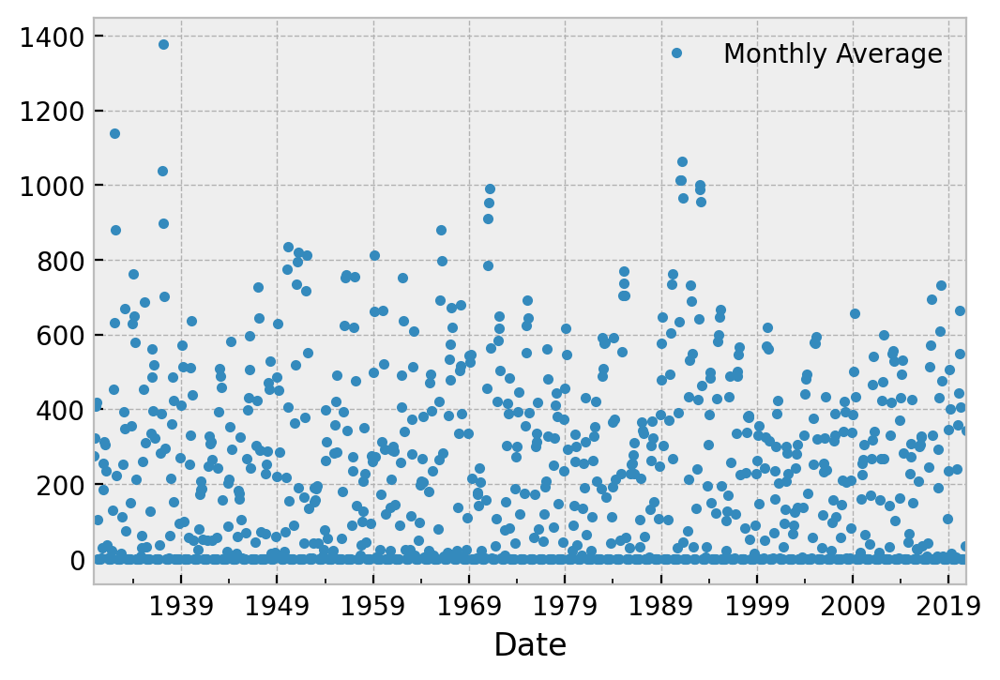

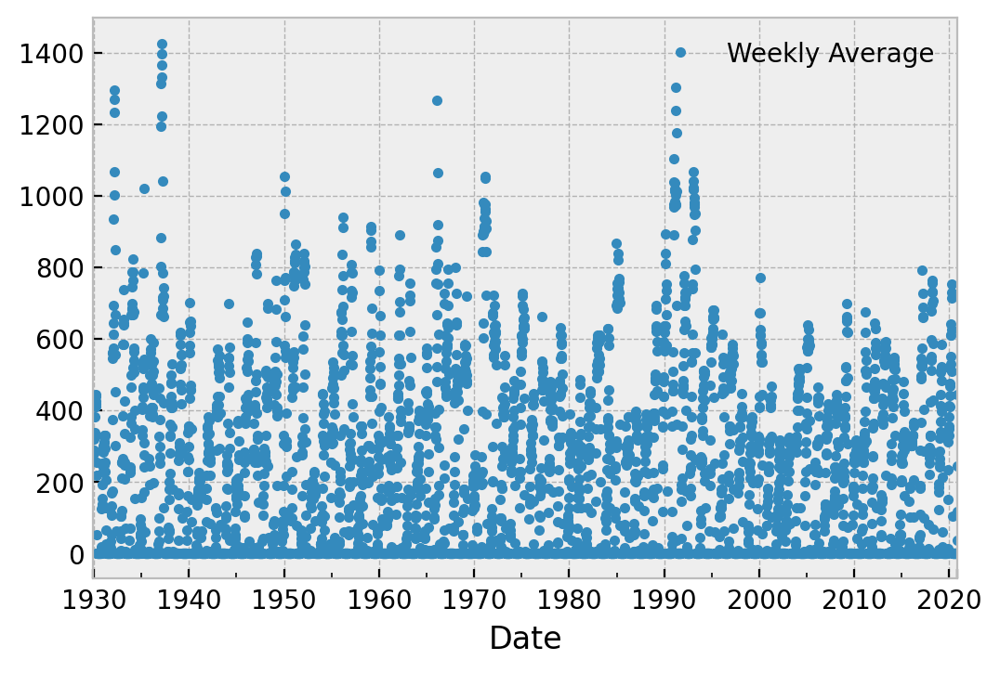

In [53]:
snwd_monthly.plot(y='Snowdepth', use_index=True, style='.', label='Monthly Average')
snwd_weekly.plot(y='Snowdepth', use_index=True, style='.', label='Weekly Average')

For snow depth, I decided to use the monthly average as the weekly data is too volatile for the model to train on. Therefore, the offset is set to 12 as the monthly data is used. 

In [54]:
offset = 12 #monthly = 12, weekly = 52
train_data, train_label, val_data, val_label, test_data, test_label = procData(snwd_monthly, offset = offset)

In [55]:
snwd_model = rnn_model(windowsize)
history = snwd_model.fit(train_data,train_label,epochs=15,batch_size=64,verbose=1,validation_data=(val_data,val_label))

Epoch 1/15
13/13 [==============================] - 2s 58ms/step - loss: 0.9303 - val_loss: 0.5087
Epoch 2/15
13/13 [==============================] - 0s 26ms/step - loss: 0.8073 - val_loss: 0.3624
Epoch 3/15
13/13 [==============================] - 0s 27ms/step - loss: 0.5880 - val_loss: 0.2376
Epoch 4/15
13/13 [==============================] - 0s 26ms/step - loss: 0.4323 - val_loss: 0.2140
Epoch 5/15
13/13 [==============================] - 0s 28ms/step - loss: 0.3839 - val_loss: 0.1368
Epoch 6/15
13/13 [==============================] - 0s 26ms/step - loss: 0.3759 - val_loss: 0.1738
Epoch 7/15
13/13 [==============================] - 0s 27ms/step - loss: 0.3436 - val_loss: 0.1156
Epoch 8/15
13/13 [==============================] - 0s 29ms/step - loss: 0.3820 - val_loss: 0.1460
Epoch 9/15
13/13 [==============================] - 0s 28ms/step - loss: 0.3430 - val_loss: 0.1449
Epoch 10/15
13/13 [==============================] - 0s 27ms/step - loss: 0.3344 - val_loss: 0.1654
Epoch 11/

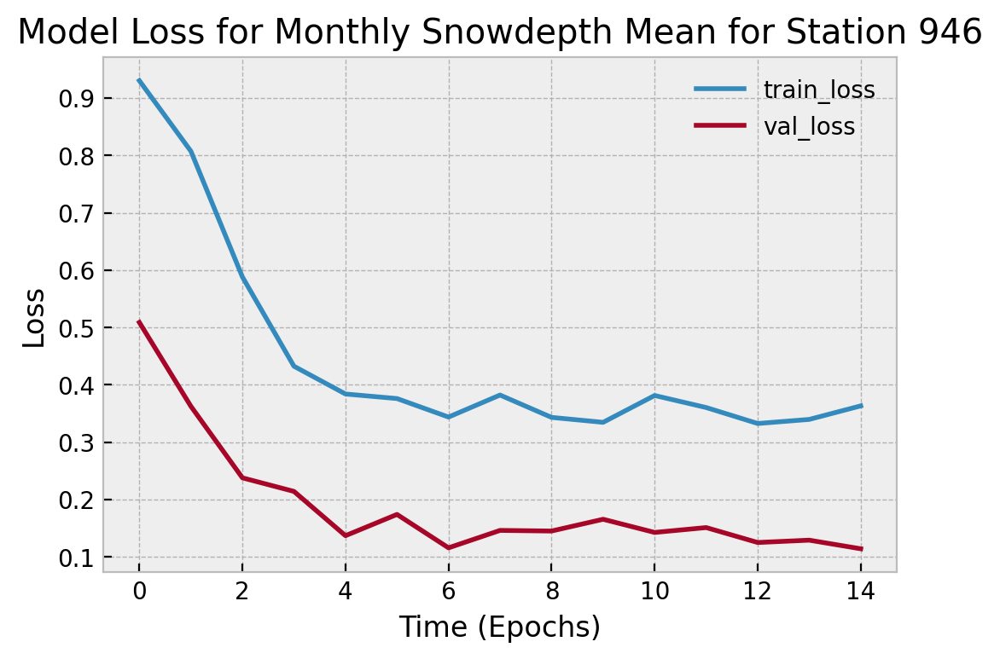

In [56]:
fig,ax=plt.subplots()
ax.plot(history.history['loss'], label='train_loss')
ax.plot(history.history['val_loss'], label='val_loss')
ax.set_title('Model Loss for Monthly Snowdepth Mean for Station 946')
ax.set_xlabel('Time (Epochs)')
ax.set_ylabel('Loss')
ax.legend()

The model achieves a relatively low validation loss. It is interesting as there seems to be a fixed loss separating the training loss and validation loss.

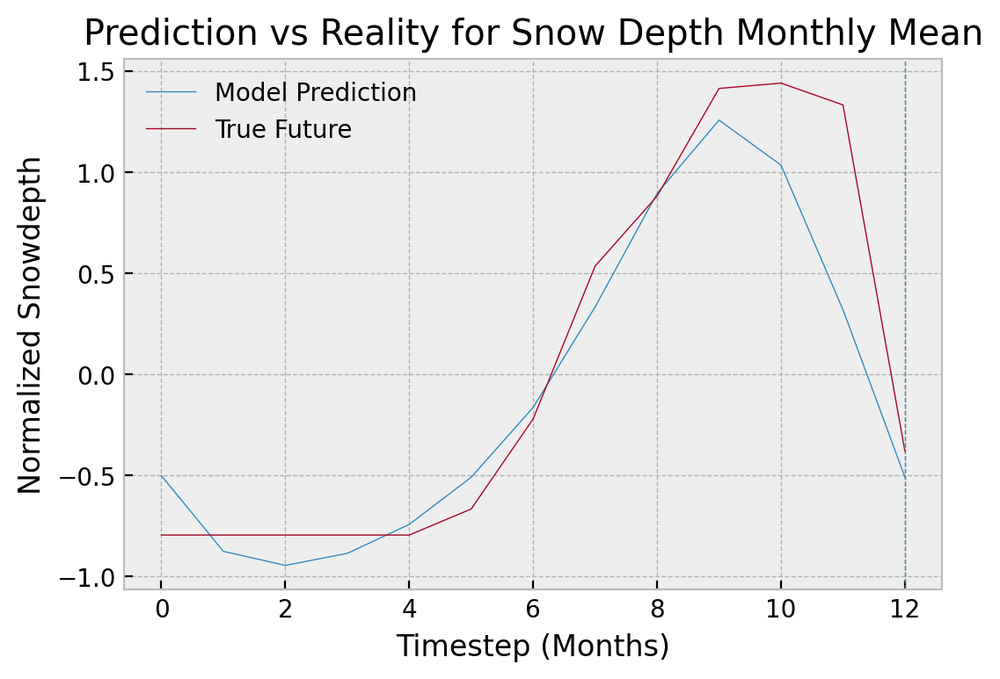

In [57]:
test_predict = snwd_model.predict(test_data[:offset+1])
fig,ax=plt.subplots()
ax.plot(test_predict, linewidth=0.5, label="Model Prediction")
ax.plot(test_label[:offset+1], linewidth=0.5, label="True Future")
ax.axvline(offset, linestyle='--', linewidth=0.5)
ax.set_title("Prediction vs Reality for Snow Depth Monthly Mean")
ax.set_xlabel("Timestep (Months)")
ax.set_ylabel("Normalized Snowdepth")
ax.legend()

The model does a good job at predicting the snow depth. One year into the future, the residual between the model output and the true value is relatively small.

# SNOWFALL
The function below is similar to the previous ones, but it retrieves snowfall from the station. 

In [58]:
def getSnow(station):
    """
    function to retrieve snow fall data of a station
    returns 3 dataframes with daily, weekly, and monthly means
    """
    fileName=statNames[station]+'.dly' #get filename, stationID + .dly
    data=ghn.processFile(fileName) #get station data using given function
    print("Station #", station, "is", ghn.getStation(statNames[station])) #outputs station name, ID
    
    snowArray=ghn.getVar(data,varName='SNOW') #get SNOW daily data 

    days, snow = zip(*snowArray) #get dates and temperature values
    
    #create datafrane for snow values
    snowData = {'Date': days, 'Snowfall': snow} 
    df_snow = pd.DataFrame(data = snowData)
    
    #set the index of dataframes as the date
    df_snow.index = pd.to_datetime(df_snow['Date'])
    
    #resample the dataframes so that the missing dates in between (holes) are included
    snow_daily = df_snow.resample('1d').mean()
    snow_daily = snow_daily.fillna(0)
    snow_weekly = snow_daily.resample('7d').mean()
    snow_monthly = snow_daily.resample('M').mean()

    return snow_daily, snow_weekly, snow_monthly

Station 946 is used again as it provides a long length of data with minimal holes.

In [59]:
snow_daily, snow_weekly, snow_monthly = getSnow(946)

Station # 946 is USW00026411 is FAIRBANKS INTL AP, United States at 64.8039, -147.8761, 131.7


Visualizing data

<AxesSubplot:xlabel='Date'>

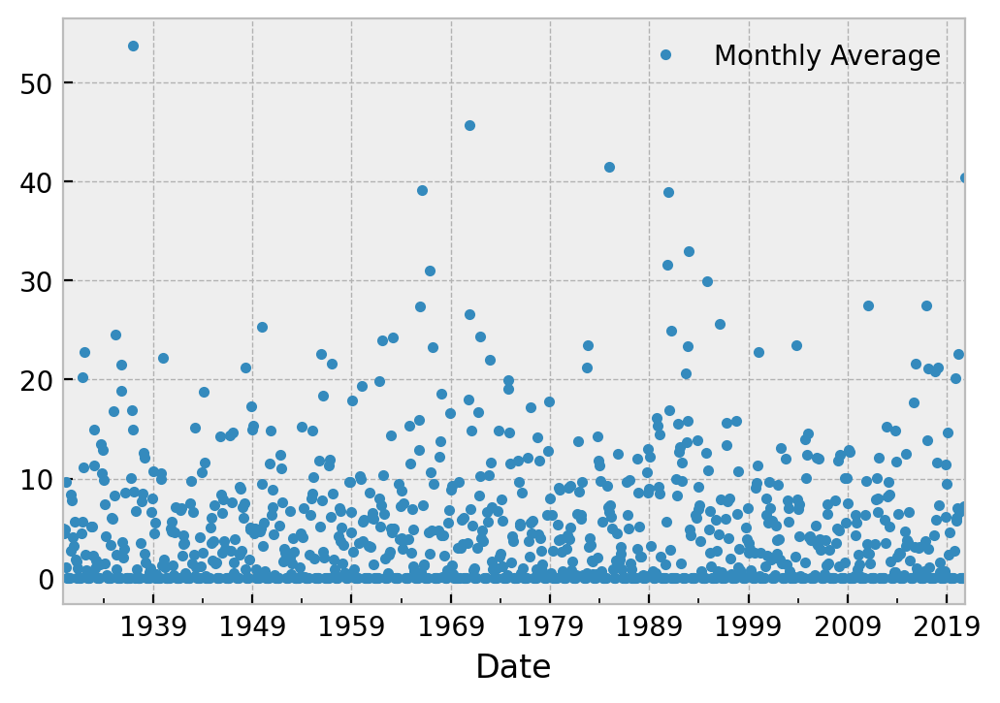

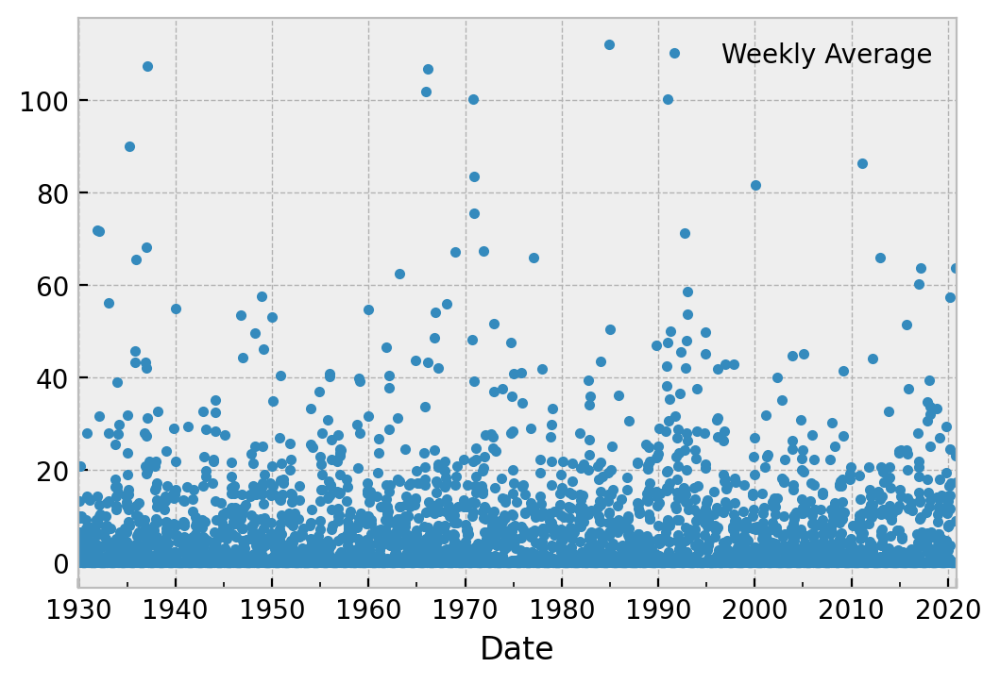

In [60]:
snow_monthly.plot(y='Snowfall', use_index=True, style='.', label='Monthly Average')
snow_weekly.plot(y='Snowfall', use_index=True, style='.', label='Weekly Average')

The monthly average is used again for snow fall, which means the offset is set to 12 again. The training, val, and testing data and inputs are created and the model is created and trained. 

In [61]:
offset = 12 #monthly = 12, weekly = 52
train_data, train_label, val_data, val_label, test_data, test_label = procData(snow_monthly, offset = offset)
snow_model = rnn_model(windowsize)
history = snow_model.fit(train_data,train_label,epochs=15,batch_size=64,verbose=1,validation_data=(val_data,val_label))

Epoch 1/15
13/13 [==============================] - 2s 57ms/step - loss: 0.9982 - val_loss: 0.5553
Epoch 2/15
13/13 [==============================] - 0s 25ms/step - loss: 0.9496 - val_loss: 0.5037
Epoch 3/15
13/13 [==============================] - 0s 29ms/step - loss: 0.8655 - val_loss: 0.4580
Epoch 4/15
13/13 [==============================] - 0s 25ms/step - loss: 0.7456 - val_loss: 0.4224
Epoch 5/15
13/13 [==============================] - 0s 30ms/step - loss: 0.6879 - val_loss: 0.4009
Epoch 6/15
13/13 [==============================] - 0s 29ms/step - loss: 0.6783 - val_loss: 0.4144
Epoch 7/15
13/13 [==============================] - 0s 25ms/step - loss: 0.6693 - val_loss: 0.4336
Epoch 8/15
13/13 [==============================] - 0s 26ms/step - loss: 0.6783 - val_loss: 0.3828
Epoch 9/15
13/13 [==============================] - 0s 28ms/step - loss: 0.6655 - val_loss: 0.4792
Epoch 10/15
13/13 [==============================] - 0s 28ms/step - loss: 0.7374 - val_loss: 0.3815
Epoch 11/

The plot of loss against time appears similar to the snow depth, the validation loss is relatively high, which could be due to the high variability of snow data, which means it is difficult to model.

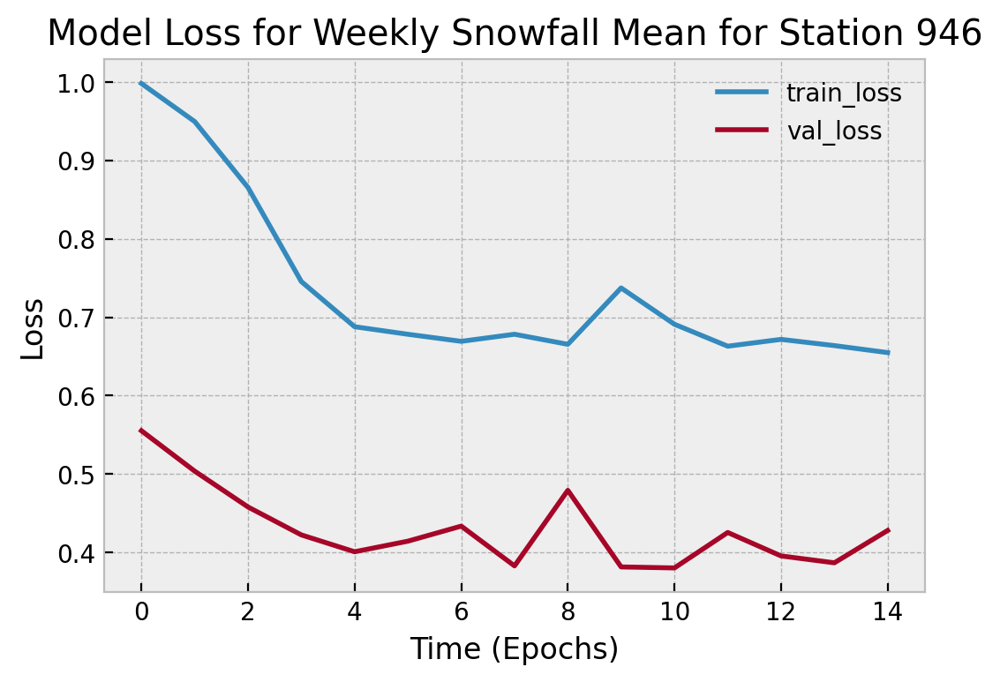

In [62]:
fig,ax=plt.subplots()
ax.plot(history.history['loss'], label='train_loss')
ax.plot(history.history['val_loss'], label='val_loss')
ax.set_title('Model Loss for Weekly Snowfall Mean for Station 946')
ax.set_xlabel('Time (Epochs)')
ax.set_ylabel('Loss')
ax.legend()

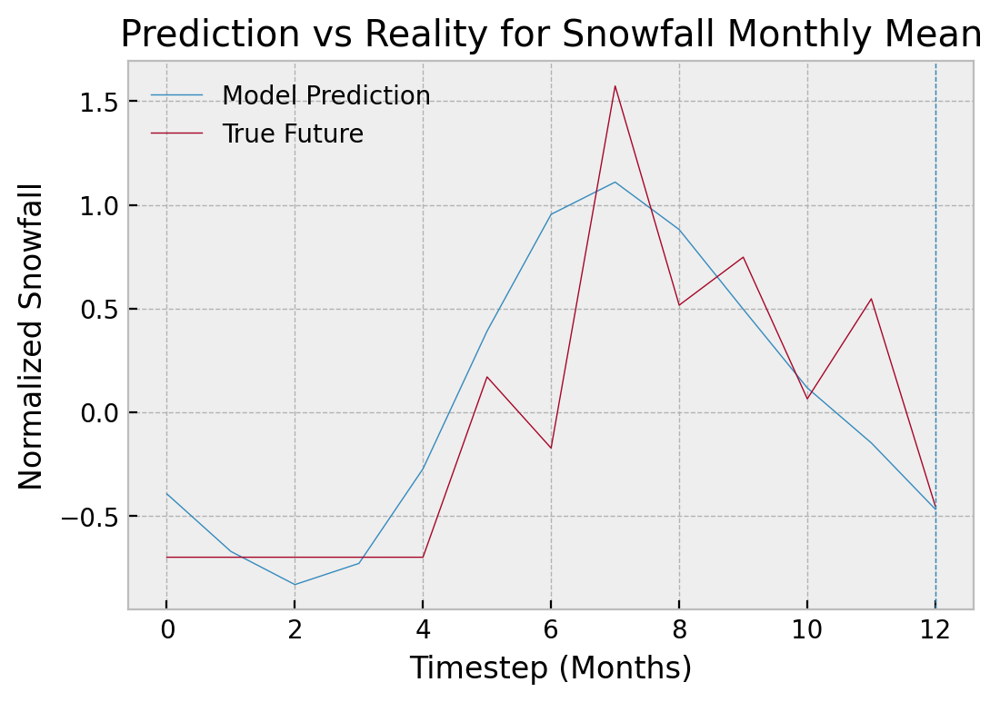

In [63]:
test_predict = snow_model.predict(test_data[:offset+1])
fig,ax=plt.subplots()
ax.plot(test_predict, linewidth=0.5, label="Model Prediction")
ax.plot(test_label[:offset+1], linewidth=0.5, label="True Future")
ax.axvline(offset, linestyle='--', linewidth=0.5)
ax.set_title("Prediction vs Reality for Snowfall Monthly Mean")
ax.set_xlabel("Timestep (Months)")
ax.set_ylabel("Normalized Snowfall")
ax.legend()

# PRECIPITATION
Again, this function is similar to the previous ones, but it retrieves the precipitation data. 

In [64]:
def getPrcp(station):
    """
    function to retrieve precipitation data of a station
    returns 3 dataframes with daily, weekly, and monthly means
    """
    fileName=statNames[station]+'.dly' #get filename, stationID + .dly
    data=ghn.processFile(fileName) #get station data using given function
    print("Station #", station, "is", ghn.getStation(statNames[station])) #outputs station name, ID
    
    snowArray=ghn.getVar(data,varName='PRCP') #get SNOW daily data 

    days, prcp = zip(*snowArray)
    
    prcpData = {'Date': days, 'Precipitation': prcp} 
    
    #create dataframe for snow
    df_prcp = pd.DataFrame(data = prcpData)
    
    #set the index of dataframes as the date
    df_prcp.index = pd.to_datetime(df_prcp['Date'])
    
    #resample the dataframes so that the missing dates in between (holes) are included
    prcp_daily = df_prcp.resample('1d').mean()
    prcp_daily = prcp_daily.fillna(0)
    prcp_weekly = prcp_daily.resample('D').interpolate()[::7]    
    prcp_monthly = prcp_daily.resample('1M').mean()

    return prcp_daily, prcp_weekly, prcp_monthly

Calling function to get precipitation data from station 934.

In [65]:
prcp_daily, prcp_weekly, prcp_monthly = getPrcp(934)

Station # 934 is USW00024131 is BOISE AIR TERMINAL, United States at 43.5667, -116.2406, 857.7


Visualizing data

Text(0, 0.5, 'Precipitation (mm)')

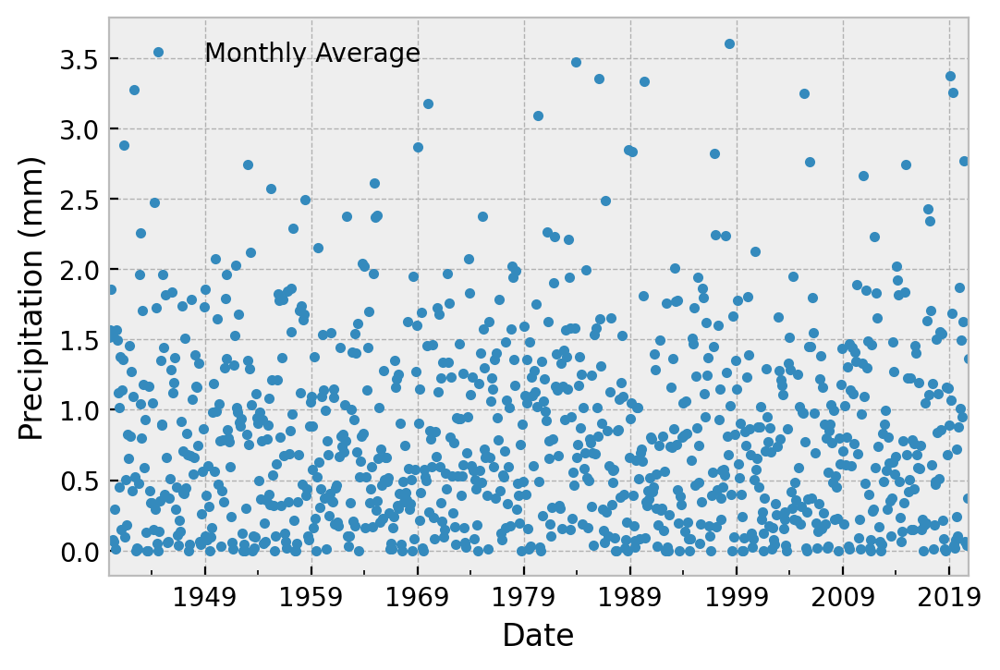

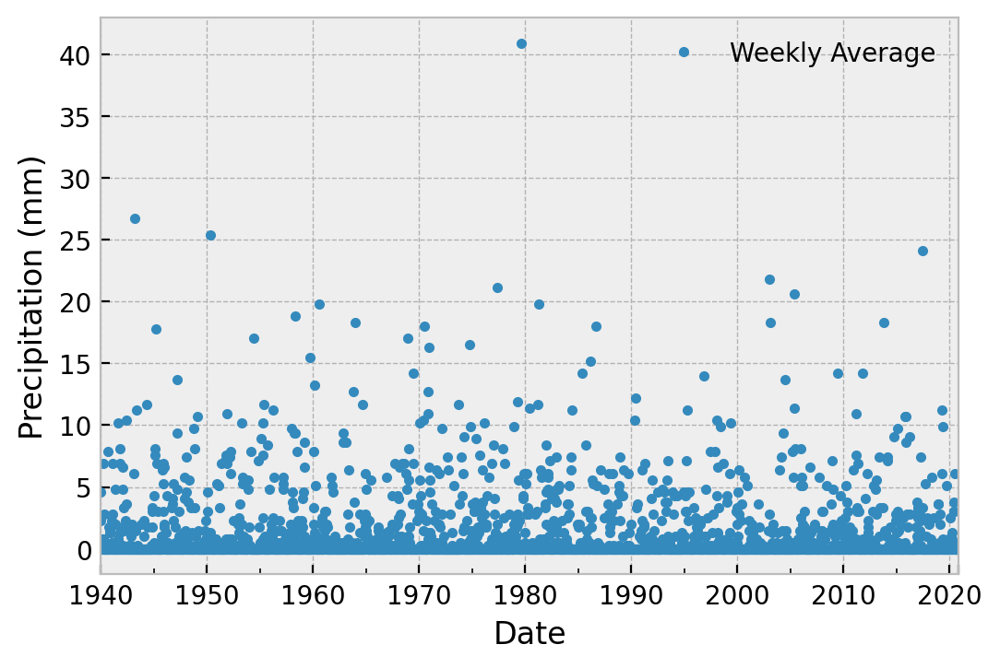

In [66]:
prcp_monthly.plot(y='Precipitation', use_index=True, style='.', label = 'Monthly Average')
plt.ylabel('Precipitation (mm)')
prcp_weekly.plot(y='Precipitation', use_index=True, style='.', label = 'Weekly Average')
plt.ylabel('Precipitation (mm)')

For precipitation data, the monthly average is used as there was high variation in the weekly averages. There is more pattern in the monthly average data, which makes it easier for the model to train on.

In [67]:
offset = 12 #monthly = 12, weekly = 52
train_data, train_label, val_data, val_label, test_data, test_label = procData(prcp_monthly, offset = offset)
prcp_model = rnn_model(windowsize)
history = prcp_model.fit(train_data,train_label,epochs=15,batch_size=64,verbose=1,validation_data=(val_data,val_label))

Epoch 1/15
11/11 [==============================] - 2s 62ms/step - loss: 0.9571 - val_loss: 0.8634
Epoch 2/15
11/11 [==============================] - 0s 25ms/step - loss: 0.9446 - val_loss: 0.8540
Epoch 3/15
11/11 [==============================] - 0s 25ms/step - loss: 0.9304 - val_loss: 0.8354
Epoch 4/15
11/11 [==============================] - 0s 25ms/step - loss: 0.9012 - val_loss: 0.8278
Epoch 5/15
11/11 [==============================] - 0s 25ms/step - loss: 0.8690 - val_loss: 0.8061
Epoch 6/15
11/11 [==============================] - 0s 25ms/step - loss: 0.8359 - val_loss: 0.7820
Epoch 7/15
11/11 [==============================] - 0s 25ms/step - loss: 0.8163 - val_loss: 0.7882
Epoch 8/15
11/11 [==============================] - 0s 25ms/step - loss: 0.8185 - val_loss: 0.7360
Epoch 9/15
11/11 [==============================] - 0s 25ms/step - loss: 0.7894 - val_loss: 0.7340
Epoch 10/15
11/11 [==============================] - 0s 25ms/step - loss: 0.7808 - val_loss: 0.7060
Epoch 11/

The loss for the model is quite high, but it is decreasing over epochs, which suggests that the model is still learning. The high loss suggests that the data has high variation which means it is difficult for the model to fit

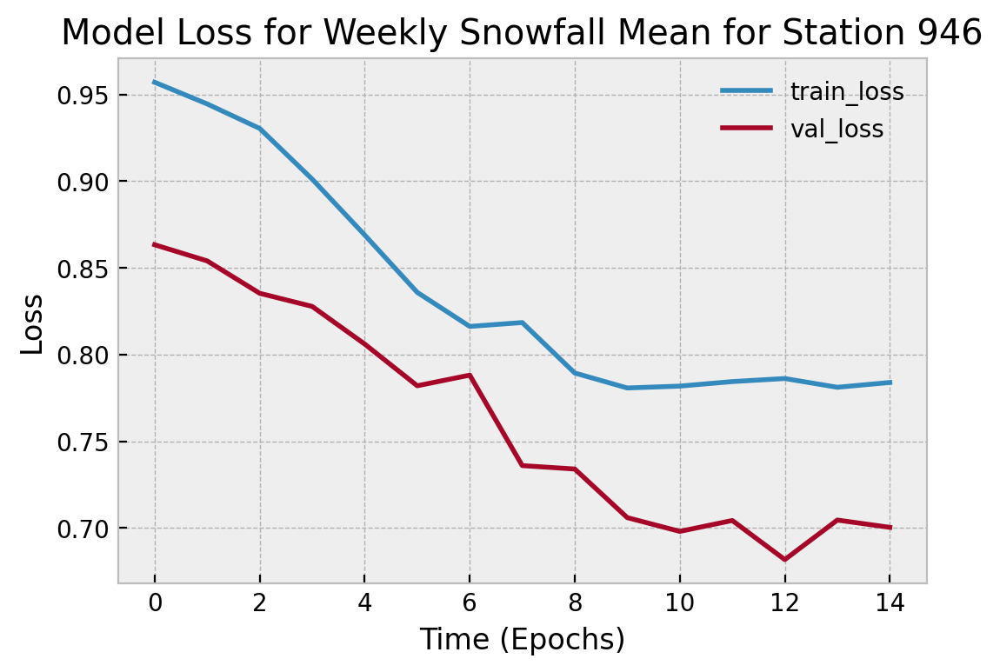

In [68]:
fig,ax=plt.subplots()
ax.plot(history.history['loss'], label='train_loss')
ax.plot(history.history['val_loss'], label='val_loss')
ax.set_title('Model Loss for Weekly Snowfall Mean for Station 946')
ax.set_xlabel('Time (Epochs)')
ax.set_ylabel('Loss')
ax.legend()

The graph of prediction vs reality for the precipitation agrees with the loss curve above. The true future has high variation, which means the fit has large residuals.

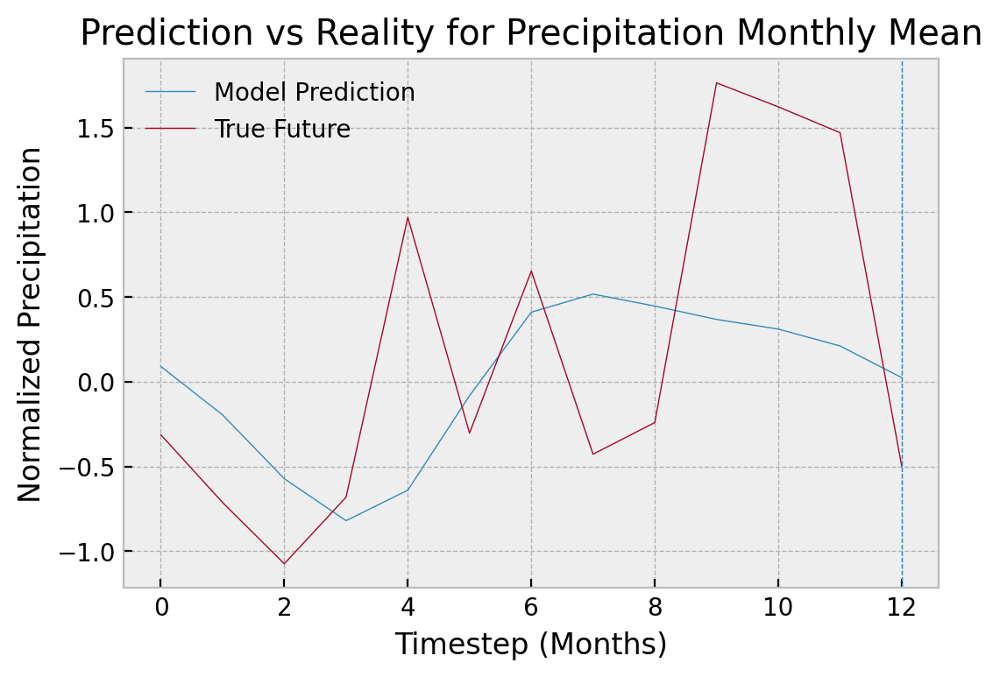

In [69]:
test_predict = prcp_model.predict(test_data[:offset+1])
fig,ax=plt.subplots()
ax.plot(test_predict, linewidth=0.5, label="Model Prediction")
ax.plot(test_label[:offset+1], linewidth=0.5, label="True Future")
ax.axvline(offset, linestyle='--', linewidth=0.5)
ax.set_title("Prediction vs Reality for Precipitation Monthly Mean")
ax.set_xlabel("Timestep (Months)")
ax.set_ylabel("Normalized Precipitation")
ax.legend()

## Conclusions for Task 1

#### Maximum Temp: 
For maximum temperature, the model created effectively forcasts the maximum temperature 1 year in advance. It has good performance in predicting the underlying trends as well as seen in the prediction vs reality comparison over the timesteps. In terms of the absolute value at the 1 year mark, there is still a residual, but this could be due to the variation in the real data itself. The model is predicting the underlying trends and it can be seen as a good sign that it is ignoring the statistical noise and not following the noise wiggles. 


#### Minimum Temp: 
For minimum temperature, the model created also effectively forecasts the temperature 1 year in advance. It has good performance in predicting the underlying trends as well as seen in the prediction vs reality comparison over the timesteps. In terms of the absolute value at the 1 year mark, there is still a residual, but this could be due to the variation in the real data itself. The model is predicting the underlying trends and it can be seen as a good sign that it is ignoring the statistical noise and not following the noise wiggles. 


#### Snow Depth: 
For snow depth, the model is able to forecast the snow depth 1 year in advance as the residual at the 1 year point is relatively low. However, over the timesteps, there is a high residual as the model is not able to achieve good performance in predicting the underlying pattern. It could also be due to the high variation in the snow data which means the residuals are maximized.


#### Snowfall: 
For snowfall, the model is also able to forecast the snow depth 1 year in advance as the residual at the 1 year point is relatively low. However, over the timesteps, there is a high residual as the model is not able to achieve good performance in predicting the underlying pattern. It could also be due to the high variation in the snow data which means the residuals are maximized.


#### Precipitation: 
I would say precipitation is the category where the machine learning techniques performed the worst. The trained model had a very high loss and the predicative output of the model also did not fit the data over the time steps. This could be due to the high volatility in precipitation data sets or unpredictableness of precipitation compared to temperature and snow. 


# 2. Can you design a machine learning technique that can predict the weather (temperature, rainfall, snow fall, etc.) any better than assuming that the weather tomorrow will be exactly the same as the weather today

For this task, the weather tomorrow is predicted, which is defined as the minimum/maximum, temperature, rainfall, snowfall, and snow depth. The climate was defined as the weekly or monthly average, whereas in this case, we are dealing with daily values. Therefore, the datasets used for this task can be from the daily dataframe instead of the weekly or monthly dataframes.

# Tmax (Maximum daily temperature)

The model creating process can be streamlined into a function

In [70]:
def Tmax_model(station):
    """
    function to retrieve maximum temperature data of a station, create inputs/labels, train model, and plot results
    """
    tmax_daily, tmax_weekly, tmax_monthly = getTmax(station) # getting data
    offset = 1 # we are predicting tomorrow
    #getting train, val, test data/labels
    train_data, train_label, val_data, val_label, test_data, test_label = procData(tmax_daily, offset = offset)
    #creating model
    tmax_model = rnn_model(windowsize)
    #training model
    history = tmax_model.fit(train_data,train_label,epochs=15,batch_size=1024,verbose=0,validation_data=(val_data,val_label))

    #plotting loss
    fig,ax=plt.subplots()
    ax.plot(history.history['loss'], label='train_loss')
    ax.plot(history.history['val_loss'], label='val_loss')
    ax.set_title('Model Loss')
    ax.set_xlabel('Time (Epochs)')
    ax.set_ylabel('Loss')
    ax.legend()
    
    val_array = np.arange(-20,1,1) 
    test_predict = tmax_model.predict(test_data) #predicting future
    
    fig,ax=plt.subplots() 
    ax.plot(val_array, val_label[-21:], linewidth=0.7, label="History") #real history
    ax.scatter(offset, test_predict[0], marker="o", label="Model Prediction") #model output
    ax.scatter(offset, test_label[0], marker="x", label="True Data") #true output
    ax.scatter(offset, val_label[-1], marker="+", label="Same as Today") #same weather as today
    ax.axvline(offset-1, linestyle='--', linewidth=0.5) 
    ax.set_title("Prediction vs Reality for Tmax Tomorrow")
    ax.set_xlabel("Timestep (Days)")
    ax.set_ylabel("Normalized Temperature")
    ax.set_xlim(right=7)
    ax.legend()

Some weather stations that provide data with minimal amount of holes over a long year period

In [71]:
#picked station numbers where the data had minimal holes with long length
temp_stations = [940, 924, 909, 939]
prcp_stations = [946, 944, 949, 951]

Looping over these stations for tmax and predicting the weather for tomorrow

Station # 940 is USW00025308 is ANNETTE ISLAND AP, United States at 55.0389, -131.5786, 33.2
Station # 924 is USW00023066 is GRAND JUNCTION WALKER FLD, United States at 39.1342, -108.54, 1480.7
Station # 909 is USW00014742 is BURLINGTON INTL AP, United States at 44.4683, -73.15, 100.6
Station # 939 is USW00024227 is OLYMPIA AP, United States at 46.9733, -122.9033, 57.3


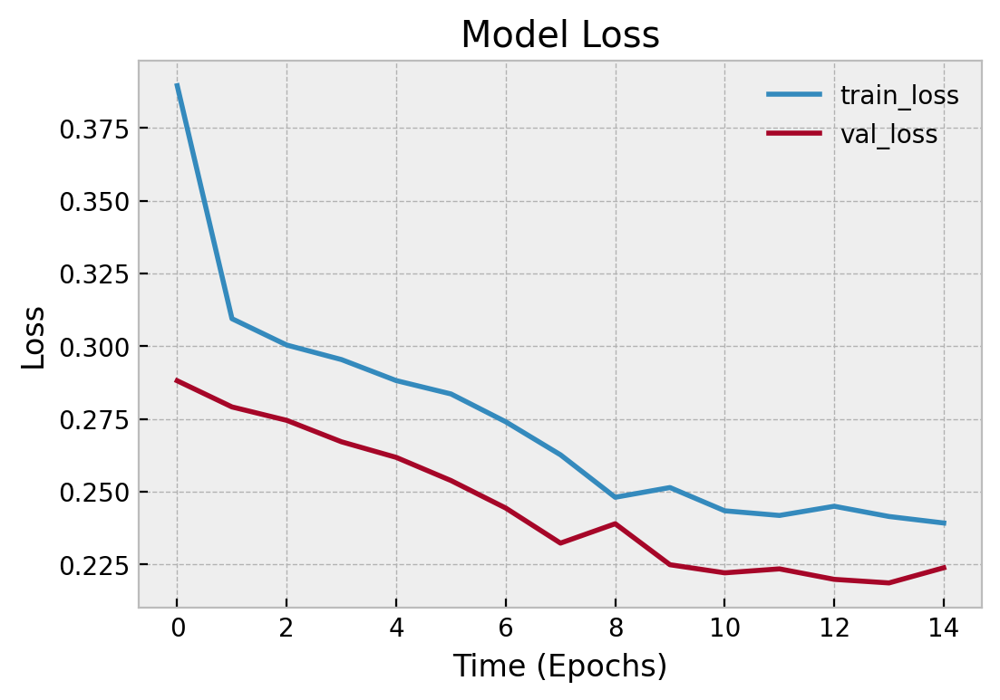

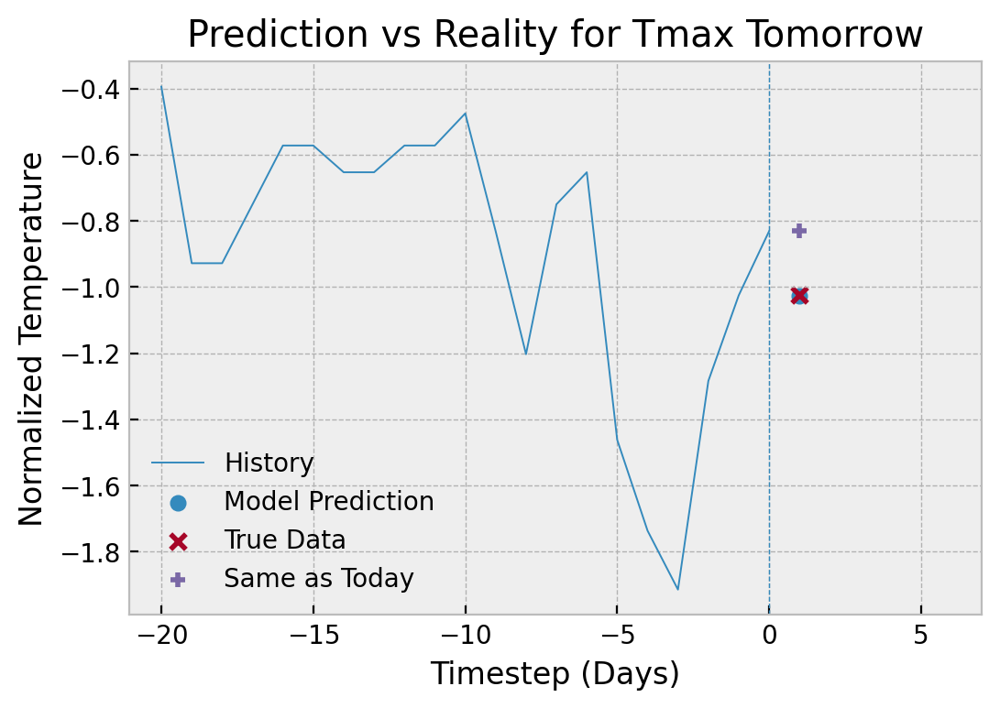

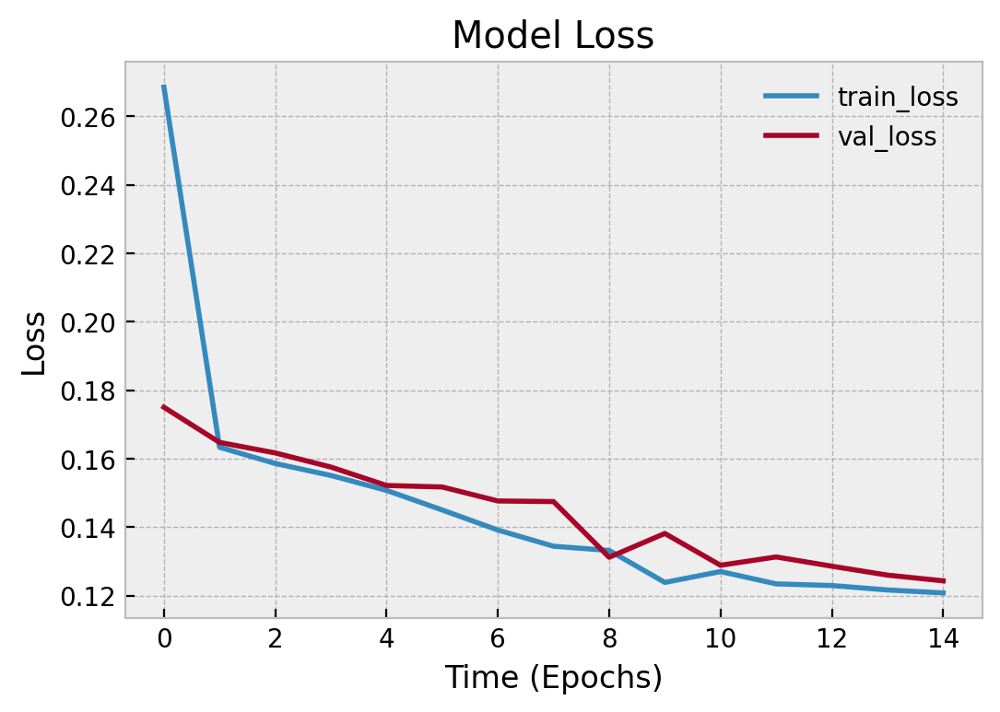

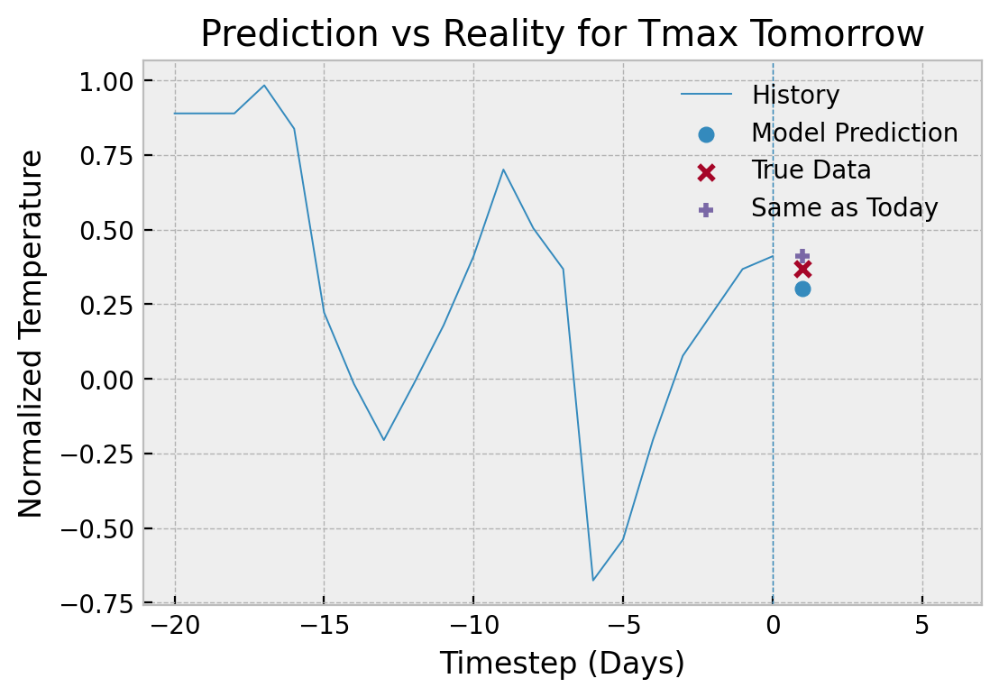

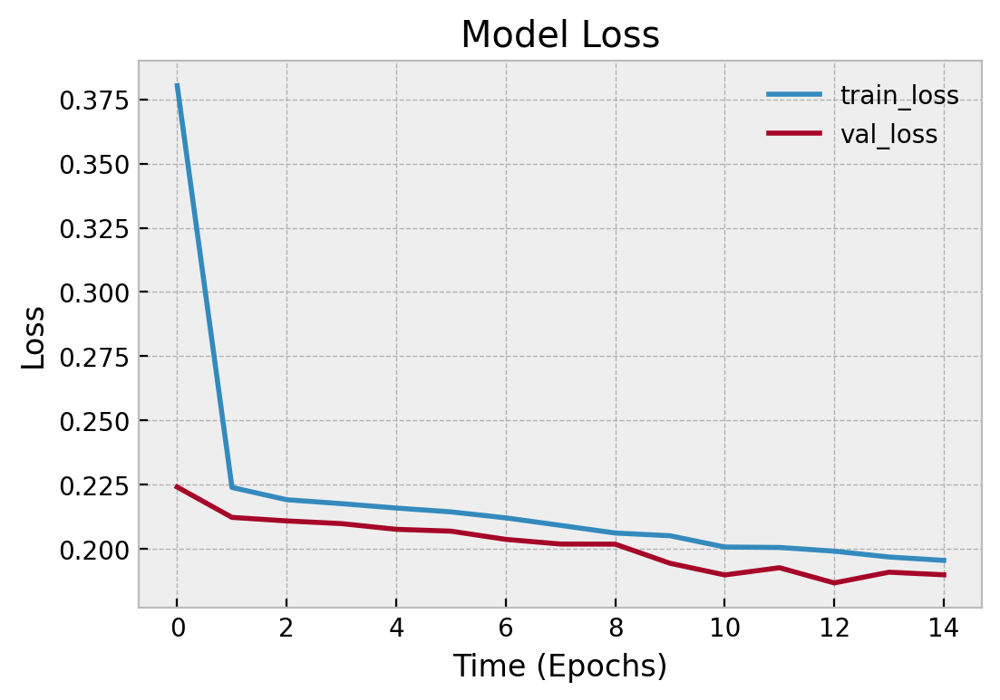

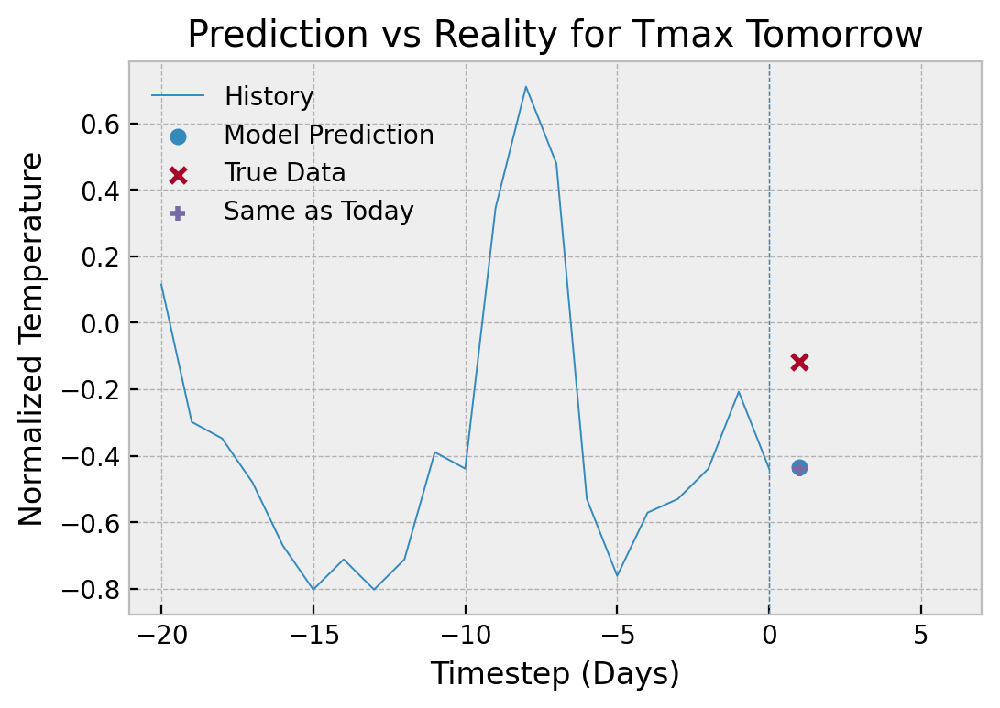

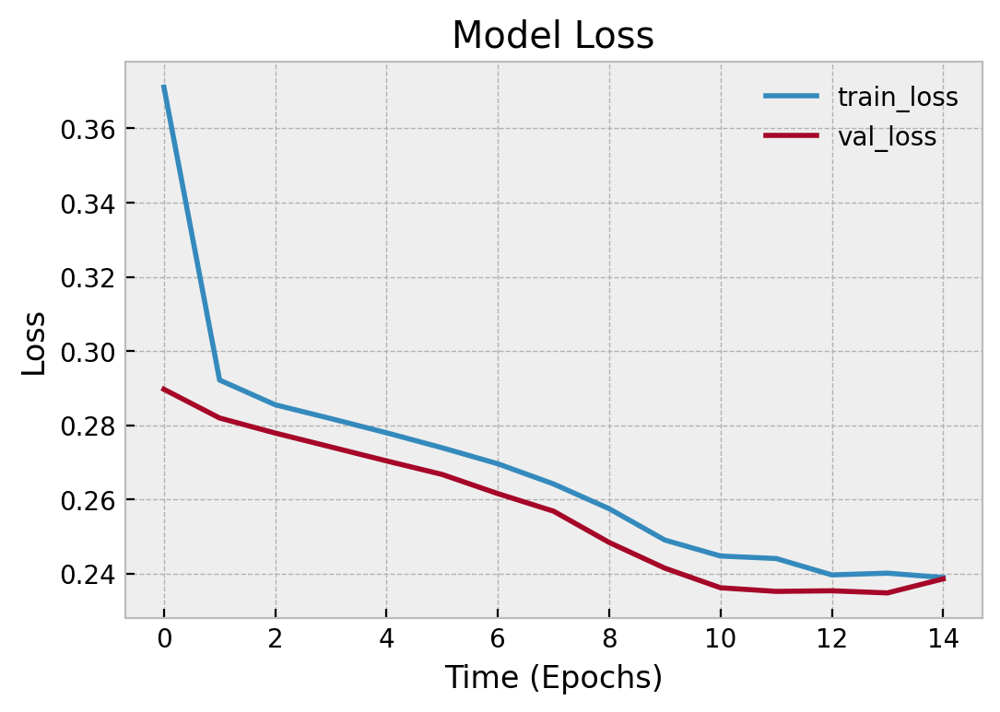

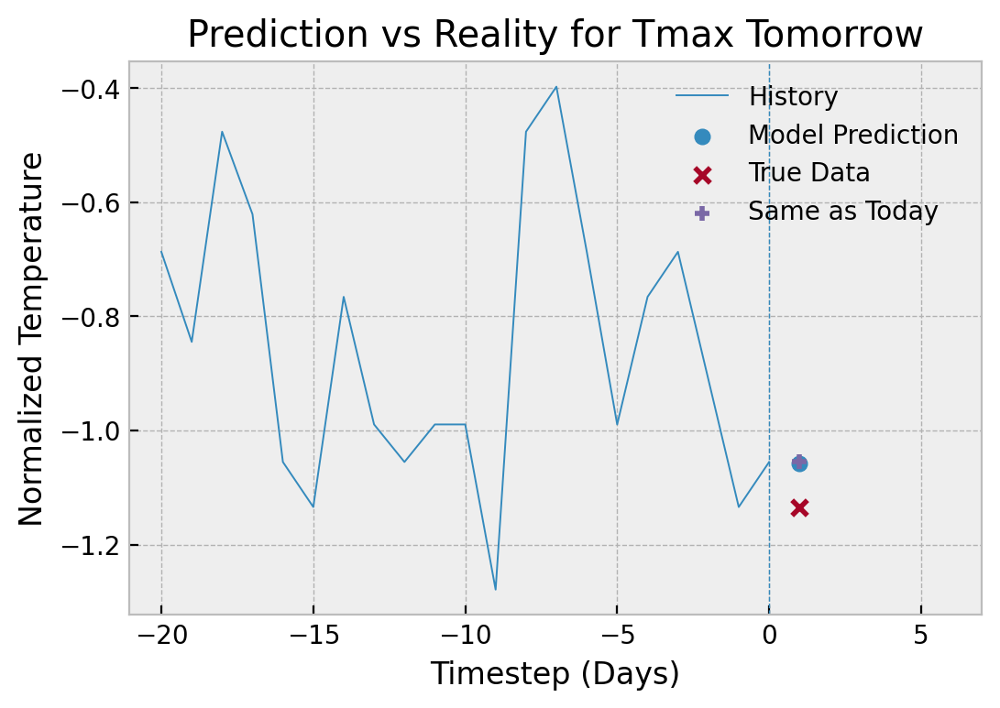

In [72]:
for i in temp_stations: #creating models for maximum temperature tomorrow
    Tmax_model(i)

## Maximum Temperature Prediction Conclusions
#### Station # 940 USW00025308 ANNETTE ISLAND AP, United States
This model has a relatively high loss compared to the other models. The validation loss also spikes at epochs 5 and 13, which could be an error. Overall, the loss curve shows training is done as the training loss and validation loss both decrease over time. 

The model does a better job at predicting the maximum temperature tomorrow compared to just assuming the maximum temperature is the same as today. 

#### Station # 924 USW00023066 GRAND JUNCTION WALKER FLD, United States
This model has a low loss compared to the other models. The validation loss and training loss are decreasing over time and do not diverge. This suggests that the model performance is improving over training.  

The model does a worse job at predicting the maximum temperature tomorrow compared to just assuming the maximum temperature is the same as today. 

#### Station # 909 USW00014742 BURLINGTON INTL AP, United States
This model has a low loss compared to the other models. The validation loss and training loss are decreasing over time and do not diverge. This suggests that the model performance is improving over training.  

The model does a slightly better job at predicting the maximum temperature tomorrow compared to just assuming the maximum temperature is the same as today. 

#### Station # 939 USW00024227 OLYMPIA AP, United States
This model has a average loss compared to the other models. The validation loss and training loss are decreasing over time and do not diverge. This suggests that the model performance is improving over training.  

The model does a worse job at predicting the maximum temperature tomorrow compared to just assuming the maximum temperature is the same as today. 

# Tmin (Minimum daily temperature)

The model creating process can be streamlined into a function

In [73]:
def Tmin_model(station):
    """
    function to retrieve minimum temperature data of a station, create inputs/labels, train model, and plot results
    """
    tmin_daily, tmin_weekly, tmin_monthly = getTmin(station) #getting data
    offset = 1 #predicting tomorrow
    #getting train, val, test data/labels
    train_data, train_label, val_data, val_label, test_data, test_label = procData(tmin_daily, offset = offset)
    #creating model
    tmin_model = rnn_model(windowsize)
    #training model
    history = tmin_model.fit(train_data,train_label,epochs=15,batch_size=1024,verbose=0,validation_data=(val_data,val_label))

    #plotting loss
    fig,ax=plt.subplots()
    ax.plot(history.history['loss'], label='train_loss')
    ax.plot(history.history['val_loss'], label='val_loss')
    ax.set_title('Model Loss')
    ax.set_xlabel('Time (Epochs)')
    ax.set_ylabel('Loss')
    ax.legend()
    
    #plotting prediction
    val_array = np.arange(-20,1,1)
    test_predict = tmin_model.predict(test_data)
    fig,ax=plt.subplots()
    ax.plot(val_array, val_label[-21:], linewidth=0.7, label="History")
    ax.scatter(offset, test_predict[0], marker="o", label="Model Prediction")
    ax.scatter(offset, test_label[0], marker="x", label="True Data")
    ax.scatter(offset, val_label[-1], marker="+", label="Same as Today")
    ax.axvline(offset-1, linestyle='--', linewidth=0.5)
    ax.set_title("Prediction vs Reality for Tmin Tomorrow")
    ax.set_xlabel("Timestep (Days)")
    ax.set_ylabel("Normalized Temperature")
    ax.set_xlim(right=7)
    ax.legend()

Looping over the data from the selected weather stations

Station # 940 is USW00025308 is ANNETTE ISLAND AP, United States at 55.0389, -131.5786, 33.2
Station # 924 is USW00023066 is GRAND JUNCTION WALKER FLD, United States at 39.1342, -108.54, 1480.7
Station # 909 is USW00014742 is BURLINGTON INTL AP, United States at 44.4683, -73.15, 100.6
Station # 939 is USW00024227 is OLYMPIA AP, United States at 46.9733, -122.9033, 57.3


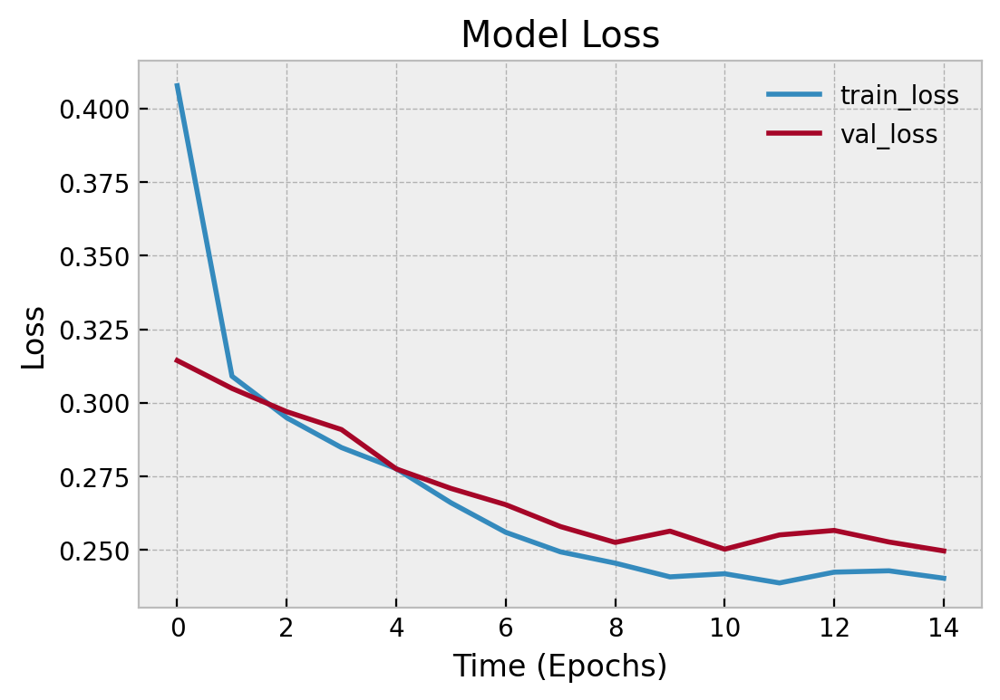

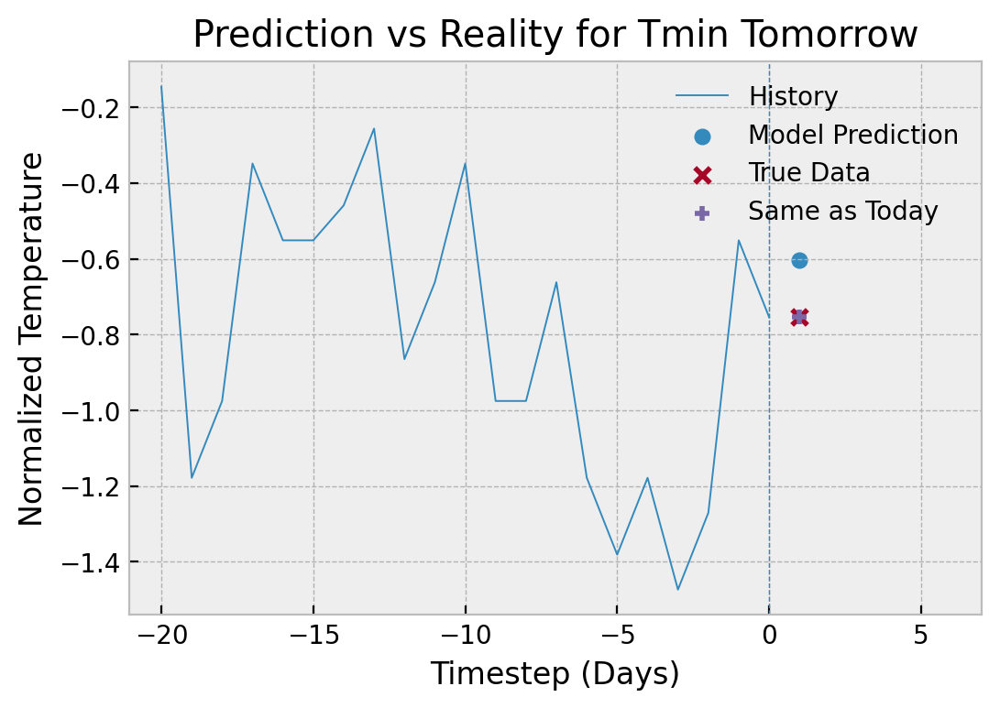

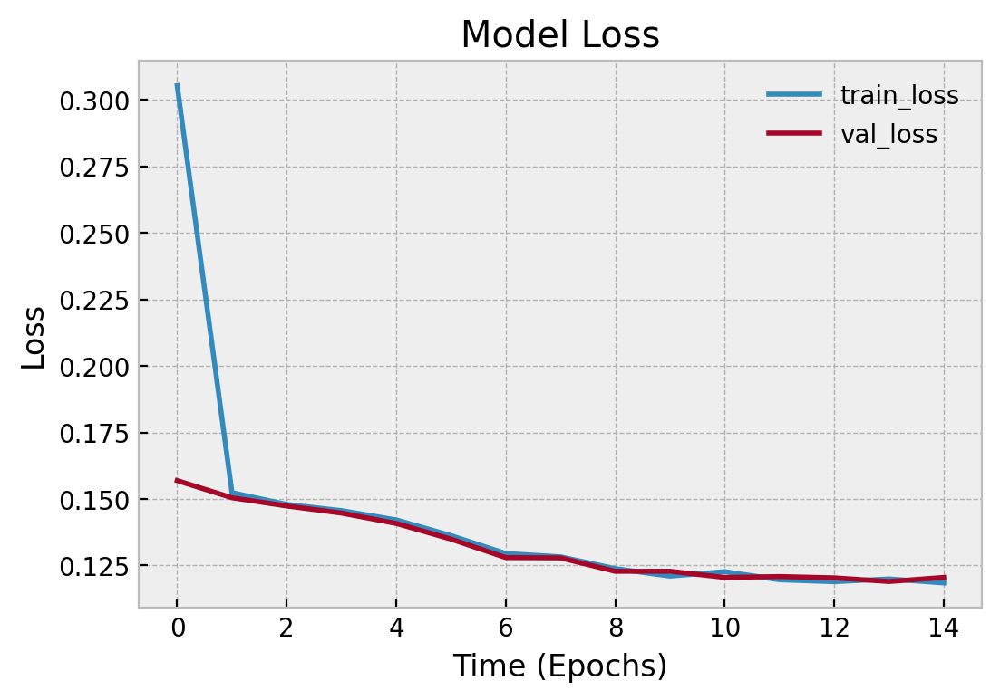

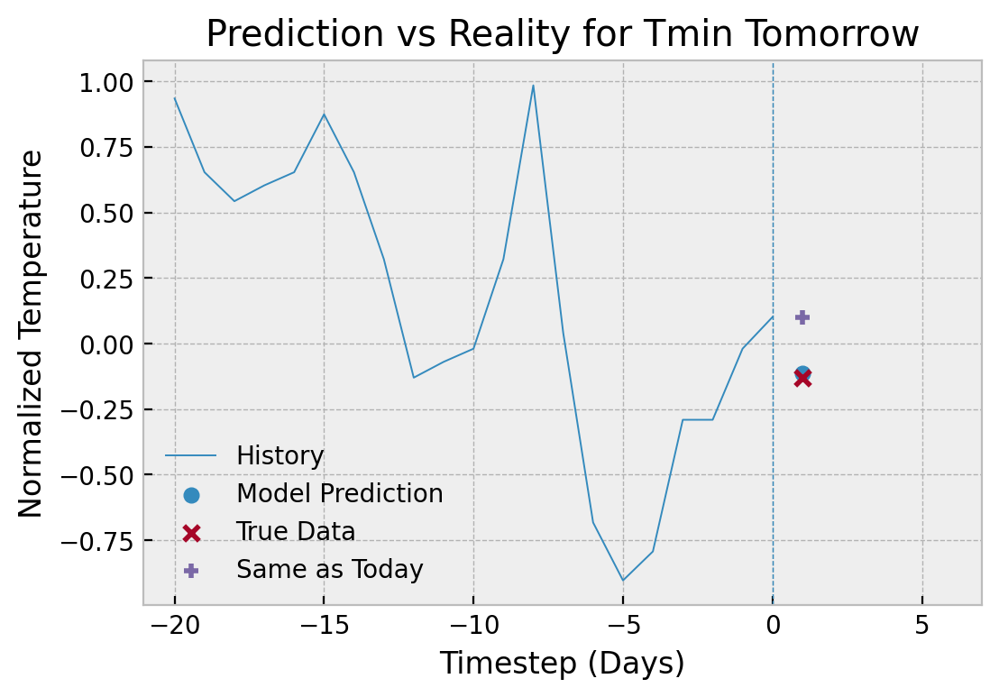

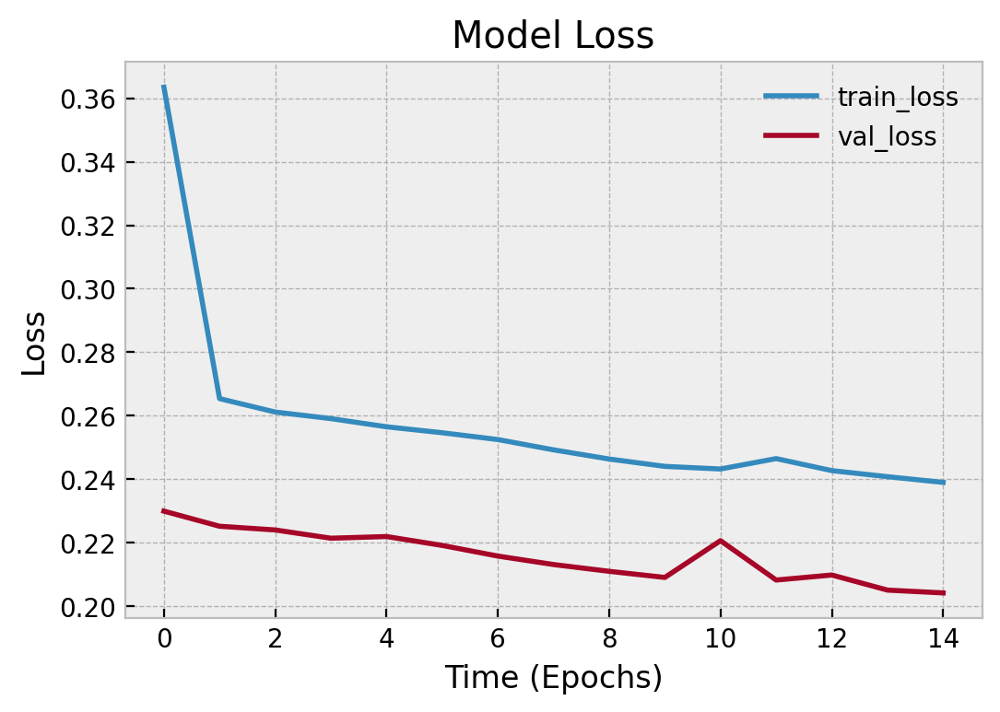

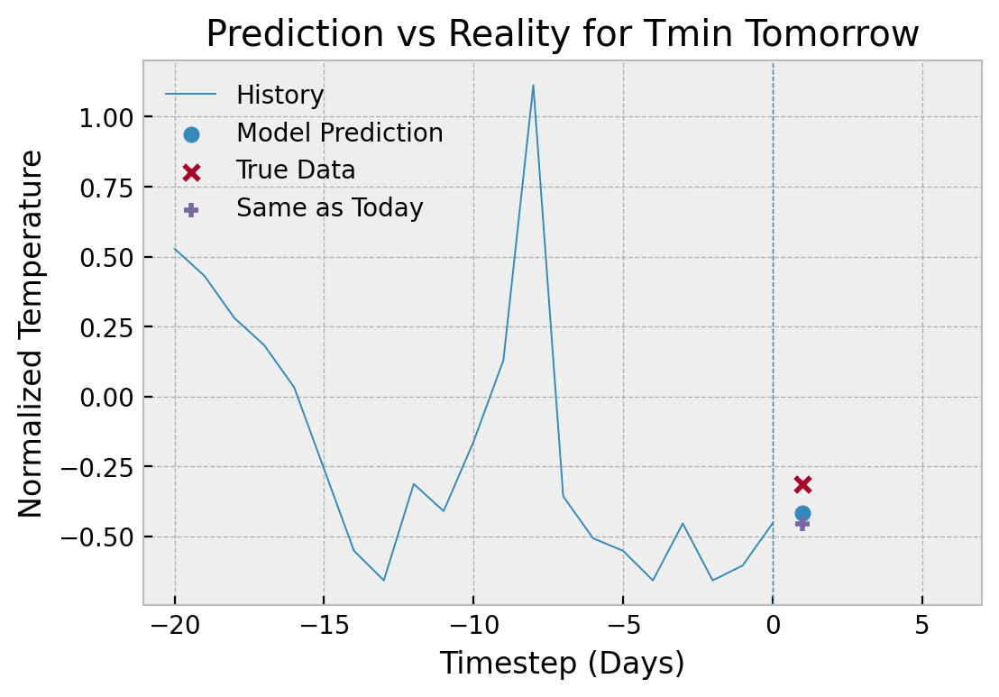

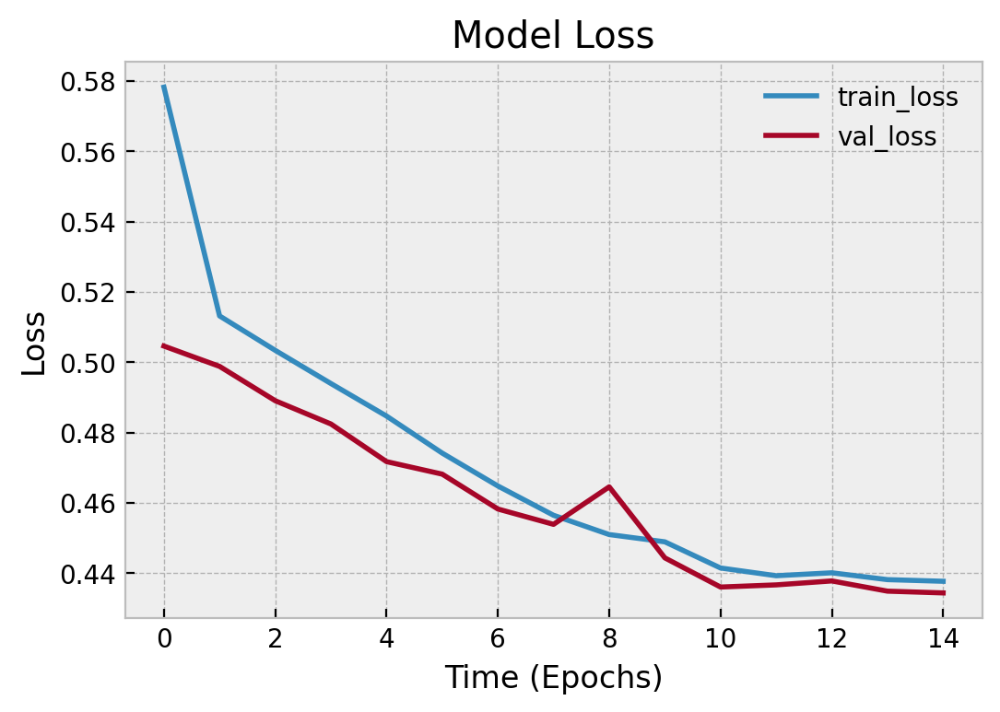

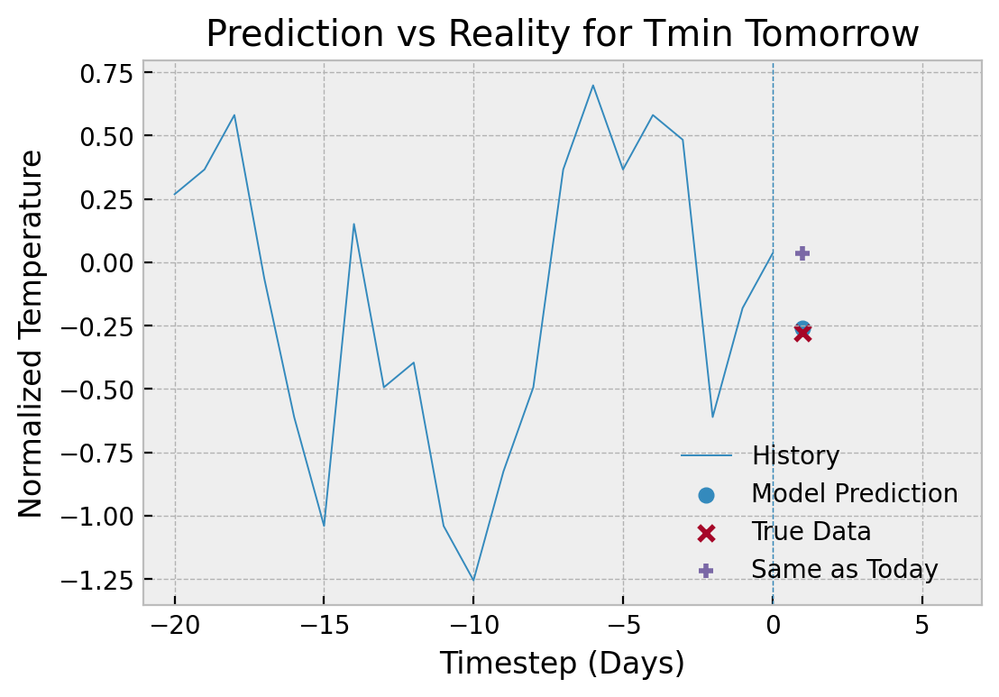

In [74]:
for i in temp_stations: # creating and testing tmin model for 4 different stations
    Tmin_model(i)

## Minimum Temperature Prediction Conclusions

#### Station # 940 USW00025308 ANNETTE ISLAND AP, United States
This model has a average loss compared to the other models. Overall, the loss curve shows training is done as the training loss and validation loss both decrease over time. 

The model does a worse job at predicting the minimum temperature tomorrow compared to just assuming the minimum temperature is the same as today. 

#### Station # 924 USW00023066 GRAND JUNCTION WALKER FLD, United States
This model has a low loss compared to the other models. The validation loss and training loss are decreasing over time and do not diverge. This suggests that the model performance is improving over training.  

The model does a better job at predicting the minimum temperature tomorrow compared to just assuming the minimum temperature is the same as today. 

#### Station # 909 USW00014742 BURLINGTON INTL AP, United States
This model has a average loss compared to the other models. The validation loss and training loss are decreasing over time and do not diverge. This suggests that the model performance is improving over training.  

The model does a better job at predicting the minimum temperature tomorrow compared to just assuming the minimum temperature is the same as today. 

#### Station # 939 USW00024227 OLYMPIA AP, United States
This model has a average loss compared to the other models. The validation loss and training loss are decreasing over time and do not diverge. This suggests that the model performance is improving over training.  

The model does a better job at predicting the minimum temperature tomorrow compared to just assuming the minimum temperature is the same as today. 

# SNOW DEPTH

In [75]:
def Snowdepth_model(station):
    """
    function to retrieve snow depth data of a station, create inputs/labels, train model, and plot results
    """
    snwd_daily, snwd_weekly, snwd_monthly = getSnwd(station) #get data
    offset = 1 #predicting tmr
    #getting inputs/labels
    train_data, train_label, val_data, val_label, test_data, test_label = procData(snwd_daily, offset = offset)
    snwd_model = rnn_model(windowsize) #create model
    #train model
    history = snwd_model.fit(train_data,train_label,epochs=15,batch_size=1024,verbose=0,validation_data=(val_data,val_label))

    #plot loss data
    fig,ax=plt.subplots()
    ax.plot(history.history['loss'], label='train_loss')
    ax.plot(history.history['val_loss'], label='val_loss')
    ax.set_title('Model Loss')
    ax.set_xlabel('Time (Epochs)')
    ax.set_ylabel('Loss')
    ax.legend()
    
    val_array = np.arange(-30,1,1)
    test_predict = snwd_model.predict(test_data) # predicting
    
    #plot prediction data
    fig,ax=plt.subplots()
    ax.plot(val_array, val_label[-31:], linewidth=0.7, label="History")
    ax.scatter(offset, test_predict[0], marker="o", label="Model Prediction")
    ax.scatter(offset, test_label[0], marker="x", label="True Data")
    ax.scatter(offset, val_label[-1], marker="+", label="Same as Today")
    ax.axvline(offset-1, linestyle='--', linewidth=0.5)
    ax.set_title("Prediction vs Reality for Snow Depth Tomorrow")
    ax.set_xlabel("Timestep (Days)")
    ax.set_ylabel("Normalized Snow Depth")
    ax.set_xlim(right=7)
    ax.legend()

Station # 946 is USW00026411 is FAIRBANKS INTL AP, United States at 64.8039, -147.8761, 131.7
Station # 944 is USW00025624 is COLD BAY AP, United States at 55.2208, -162.7325, 23.8
Station # 949 is USW00026615 is BETHEL AP, United States at 60.785, -161.8292, 31.1
Station # 951 is USW00026617 is NOME MUNI AP, United States at 64.5111, -165.44, 4.0


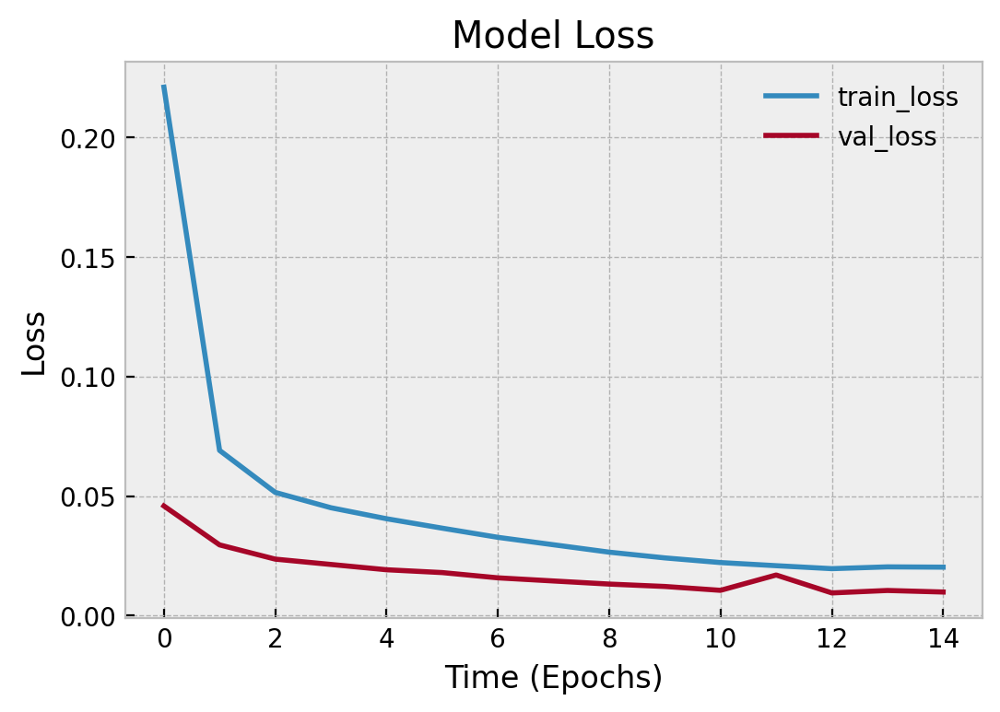

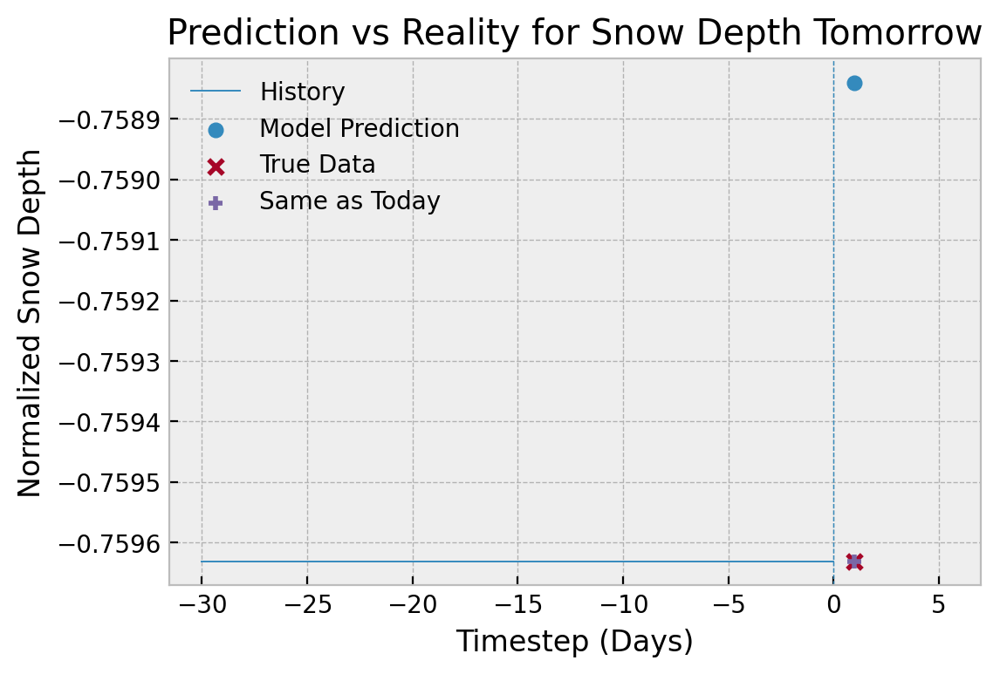

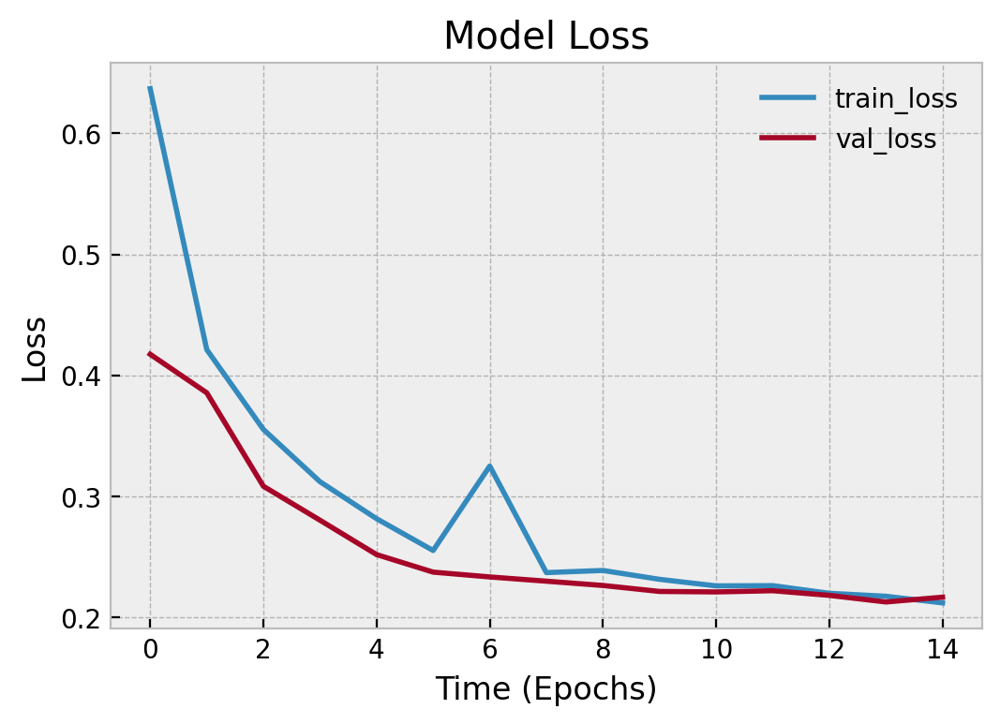

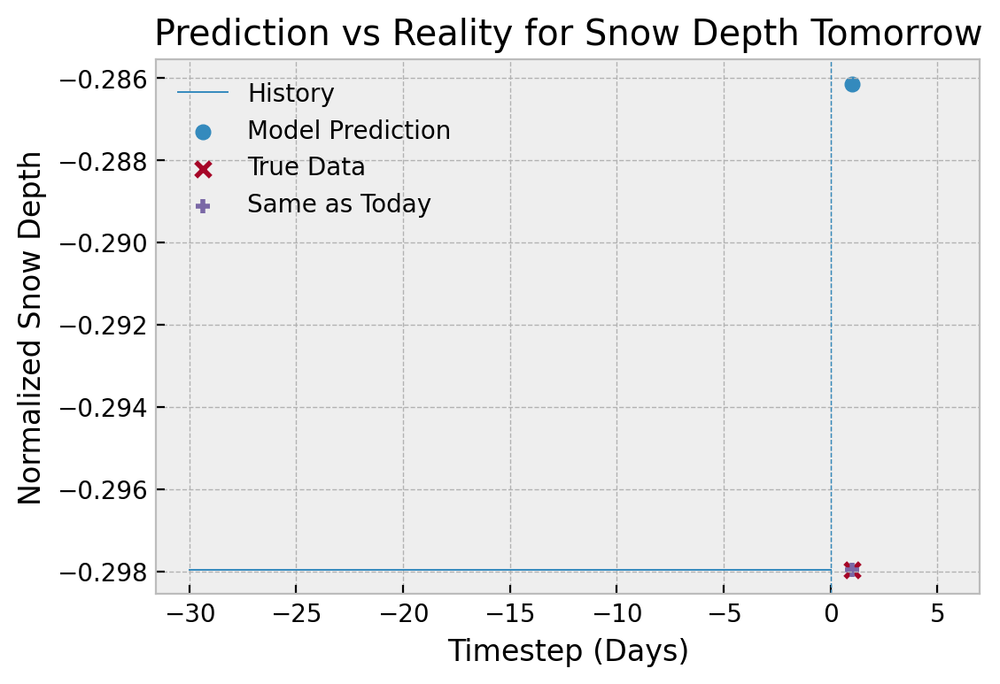

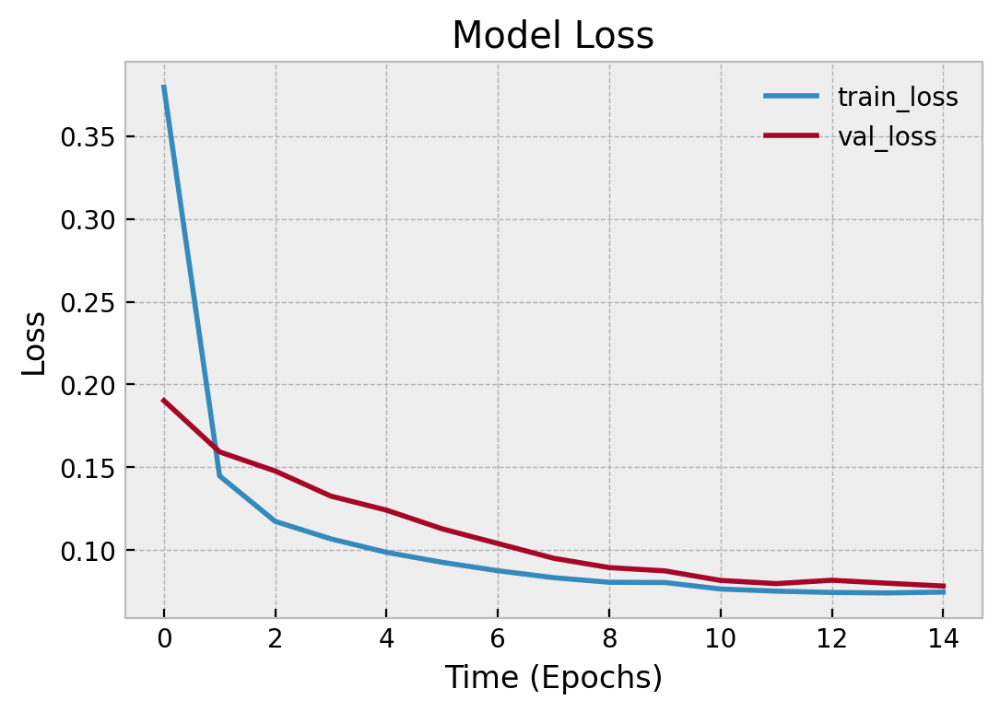

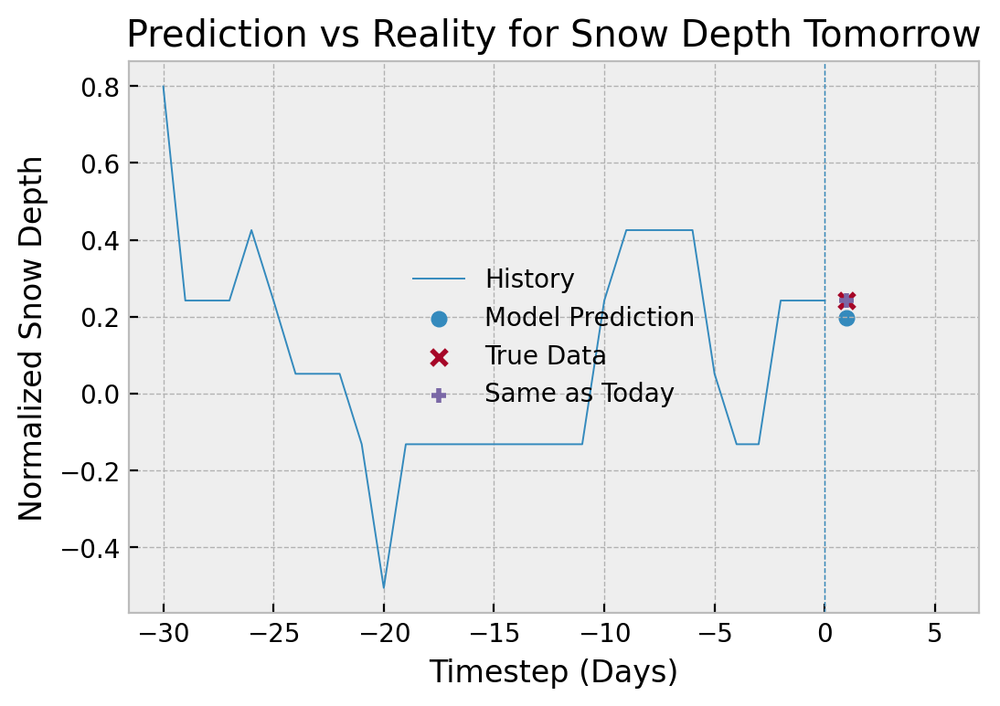

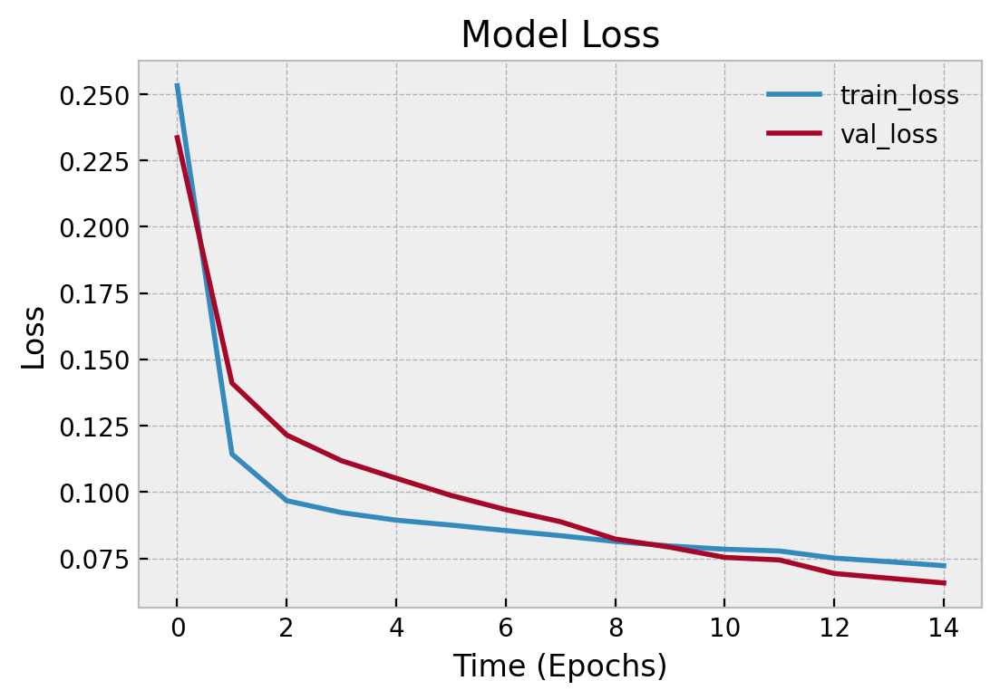

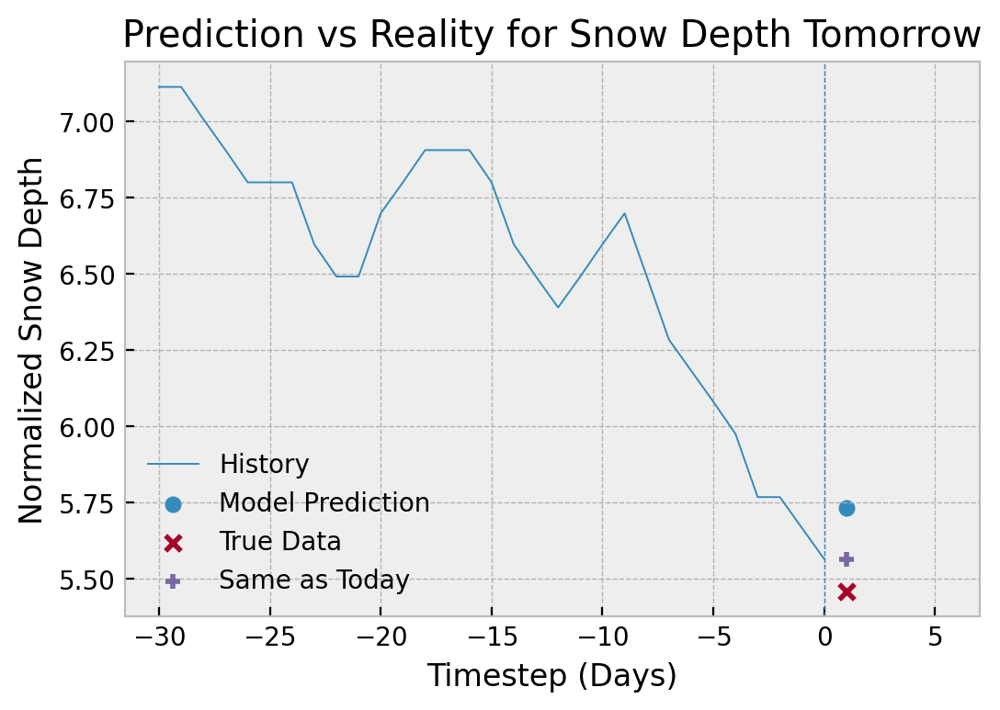

In [76]:
for i in prcp_stations: #create and test model and plot for 4 stations 
    Snowdepth_model(i)

## Snow Depth Prediction Conclusions

#### Station # 946 USW00026411 FAIRBANKS INTL AP, United States

This model has a low loss compared to the other models for snow depth. Overall, the loss curve shows training is done as the training loss and validation loss both decrease over time. 

The model does a worse job at predicting the snow depth tomorrow compared to just assuming the snow depth is the same as today. 

#### Station # 944 USW00025624 COLD BAY AP, United States at 55.2208, -162.7325, 23.8

This model has a high loss compared to the other models for snow depth. Overall, the loss curve shows training is done as the training loss and validation loss both decrease over time. 

The model does a worse job at predicting the snow depth tomorrow compared to just assuming the snow depth is the same as today. 

#### Station # 949 USW00026615 BETHEL AP, United States at 60.785, -161.8292, 31.1

This model has a average loss compared to the other models for snow depth. Overall, the loss curve shows training is done as the training loss and validation loss both decrease over time. 

The model does a worse job at predicting the snow depth tomorrow compared to just assuming the snow depth is the same as today. 

#### Station # 951 USW00026617 NOME MUNI AP, United States at 64.5111, -165.44, 4.0

This model has a average loss compared to the other models for snow depth. Overall, the loss curve shows training is done as the training loss and validation loss both decrease over time. 

The model does a worse job at predicting the snow depth tomorrow compared to just assuming the snow depth is the same as today. 


# SNOWFALL

In [77]:
def Snowfall_model(station):
    """
    function to retrieve snowfall data of a station, create inputs/labels, train model, and plot results
    """
    snow_daily, snow_weekly, snow_monthly = getSnow(station) #get data
    offset = 1 #predicting tmr
    #get input/labels
    train_data, train_label, val_data, val_label, test_data, test_label = procData(snow_daily, offset = offset)
    snow_model = rnn_model(windowsize) #create model
    #train model
    history = snow_model.fit(train_data,train_label,epochs=15,batch_size=1024,verbose=0,validation_data=(val_data,val_label))

    #plot loss data
    fig,ax=plt.subplots()
    ax.plot(history.history['loss'], label='train_loss')
    ax.plot(history.history['val_loss'], label='val_loss')
    ax.set_title('Model Loss')
    ax.set_xlabel('Time (Epochs)')
    ax.set_ylabel('Loss')
    ax.legend()
    
    val_array = np.arange(-30,1,1)
    test_predict = snow_model.predict(test_data) #predict using model
    
    #plot predictions and compare
    fig,ax=plt.subplots()
    ax.plot(val_array, val_label[-31:], linewidth=0.7, label="History")
    ax.scatter(offset, test_predict[0], marker="o", label="Model Prediction")
    ax.scatter(offset, test_label[0], marker="x", label="True Data")
    ax.scatter(offset, val_label[-1], marker="+", label="Same as Today")
    ax.axvline(offset-1, linestyle='--', linewidth=0.5)
    ax.set_title("Prediction vs Reality for Snowfall Tomorrow")
    ax.set_xlabel("Timestep (Days)")
    ax.set_ylabel("Normalized Snowfall")
    ax.set_xlim(right=7)
    ax.legend()

Station # 946 is USW00026411 is FAIRBANKS INTL AP, United States at 64.8039, -147.8761, 131.7
Station # 944 is USW00025624 is COLD BAY AP, United States at 55.2208, -162.7325, 23.8
Station # 949 is USW00026615 is BETHEL AP, United States at 60.785, -161.8292, 31.1
Station # 951 is USW00026617 is NOME MUNI AP, United States at 64.5111, -165.44, 4.0


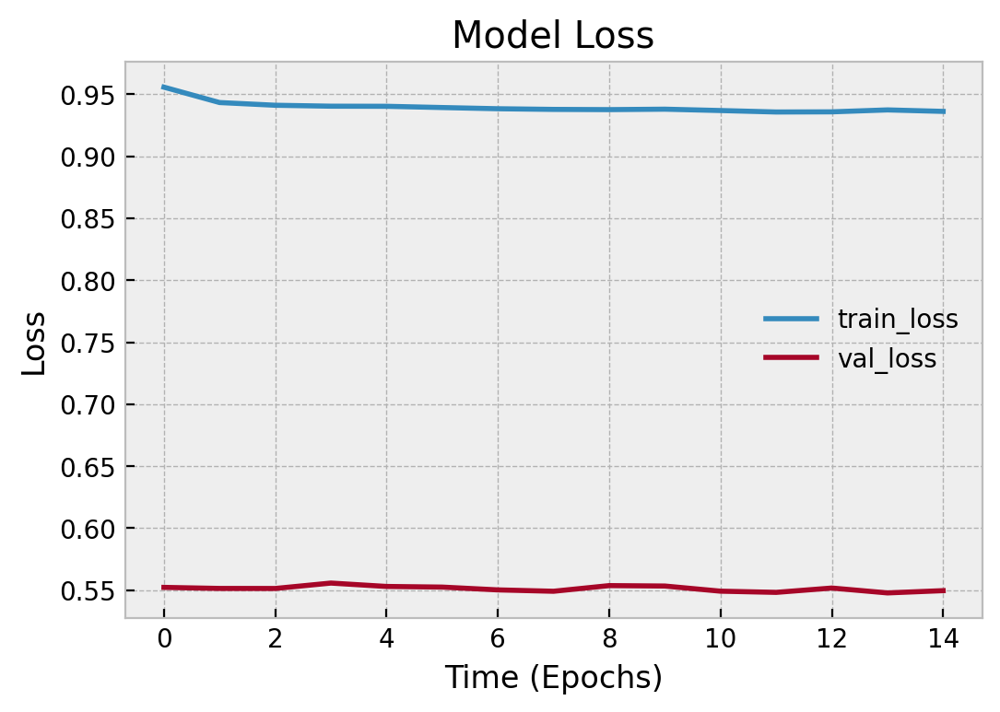

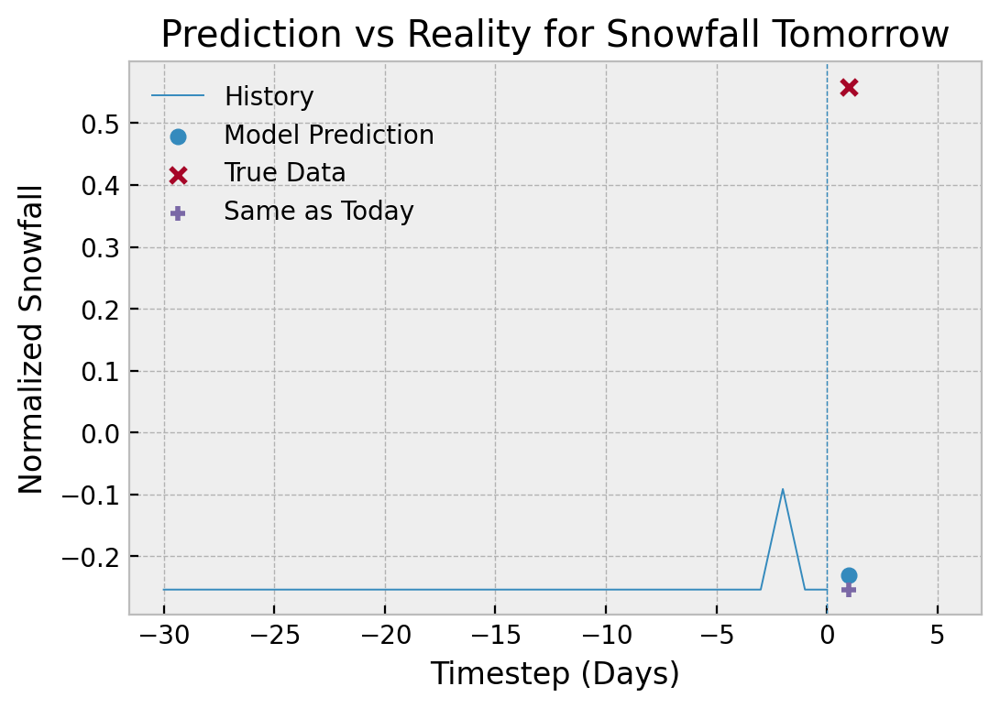

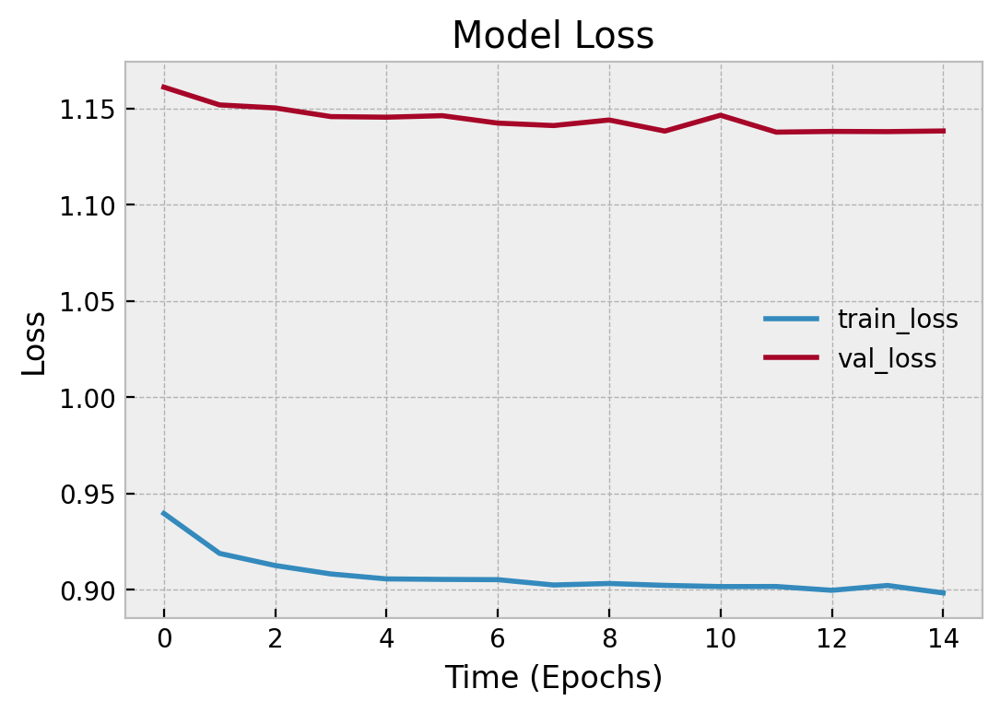

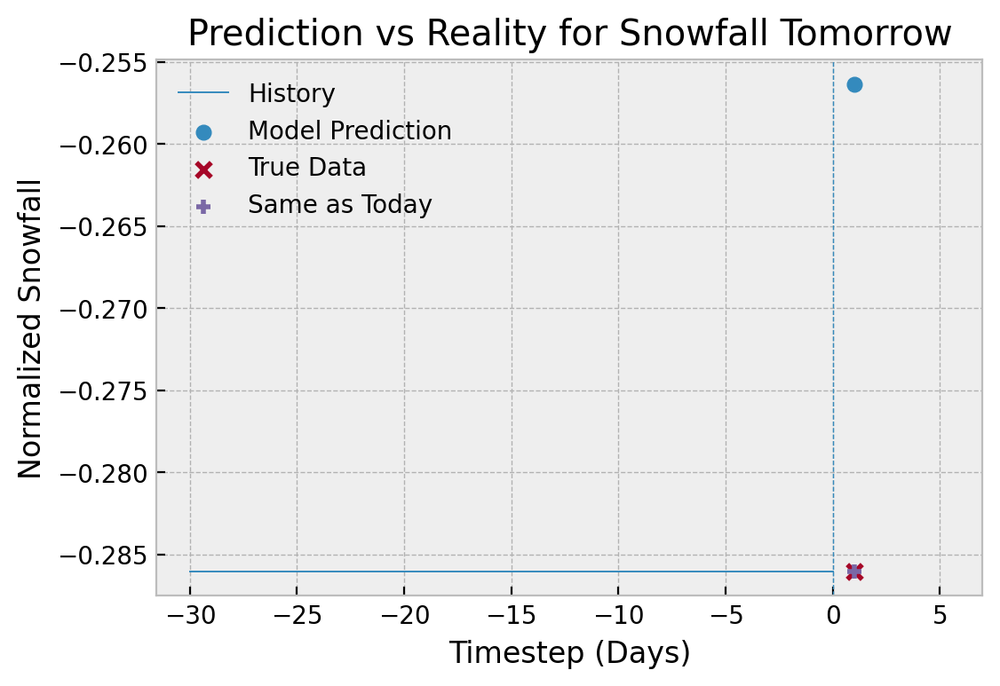

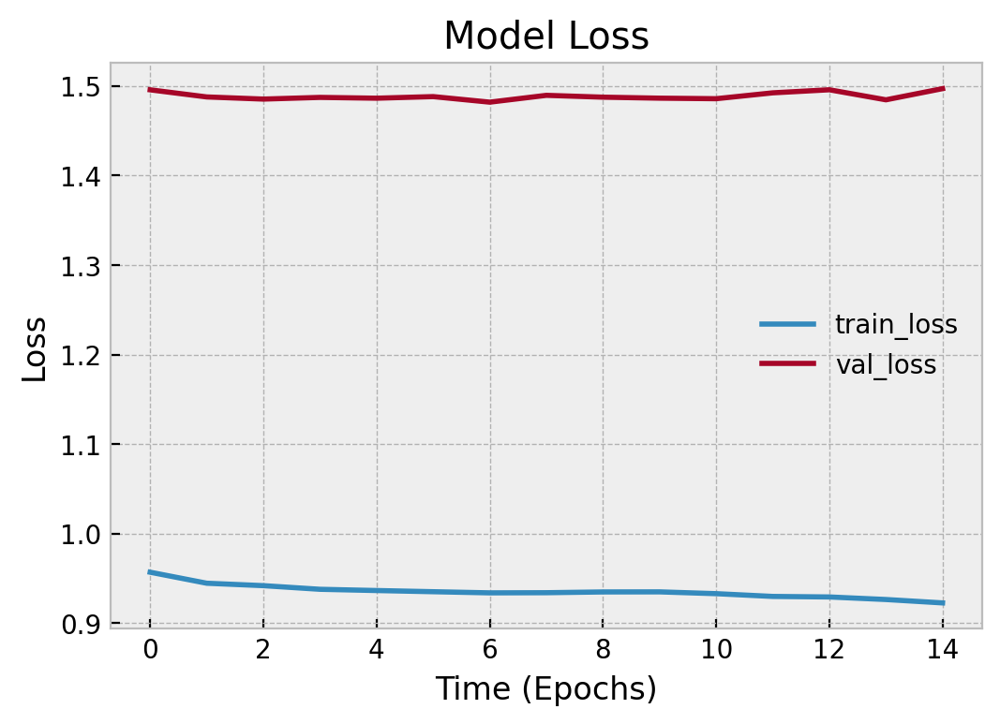

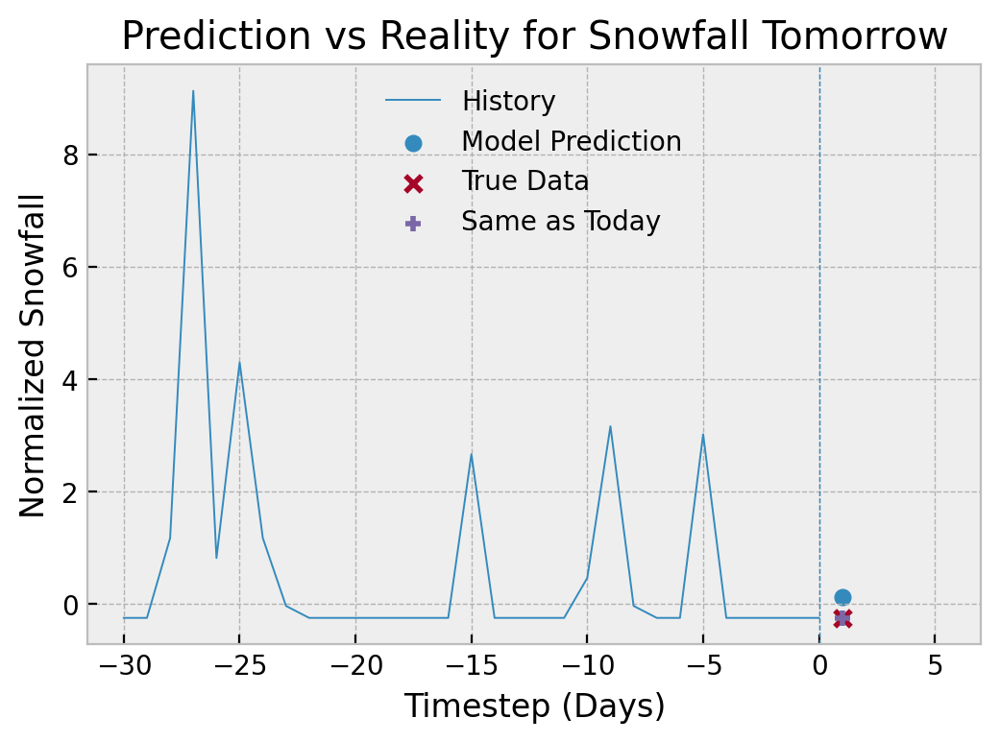

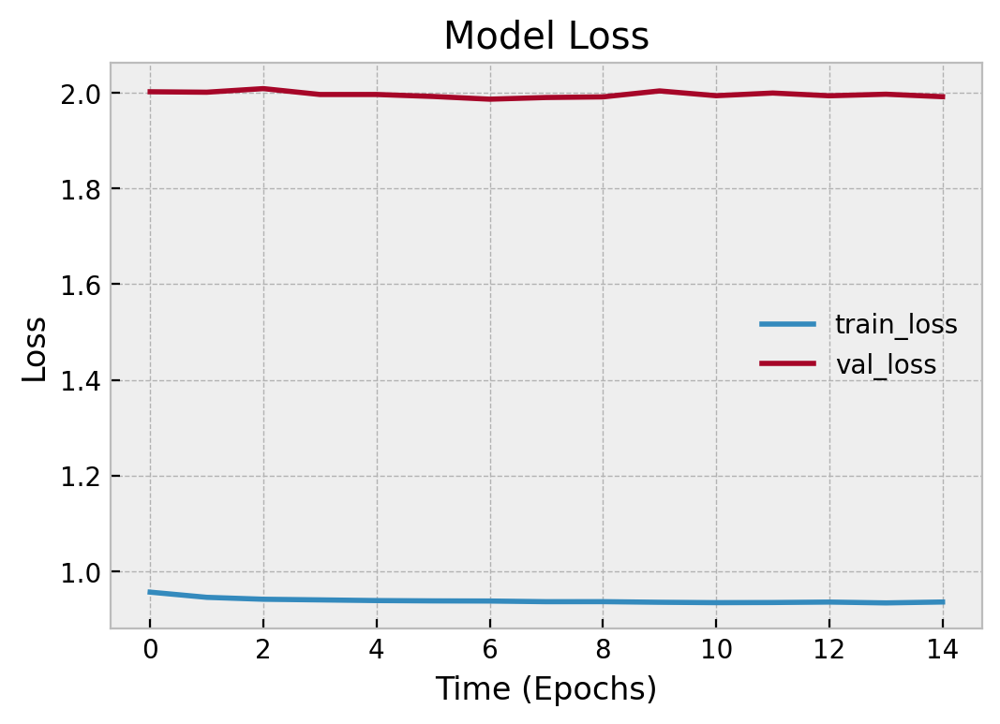

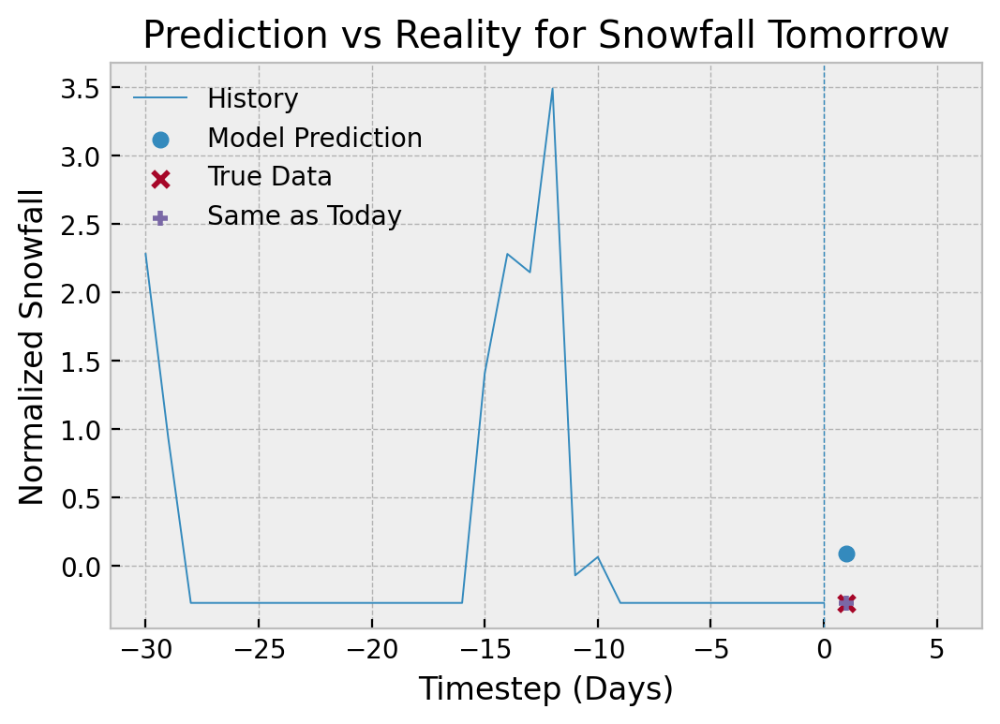

In [78]:
for i in prcp_stations: #predict for 4 different stations
    Snowfall_model(i)

## Snowfall Prediction Conclusions

#### Station # 946 USW00026411 FAIRBANKS INTL AP, United States

This model has a high loss and the training and validation loss stay relatively constant over the training period. This shows that not a lot of training is done and the model performance is not improving significantly. 

The model does a worse job at predicting the snowfall tomorrow compared to just assuming the snowfall is the same as today. 

#### Station # 944 USW00025624 COLD BAY AP, United States at 55.2208, -162.7325, 23.8

This model has a high loss. There is slight improvement of validation and training loss over the training period which shows the model performance is improving slightly

The model does a worse job at predicting the snowfall tomorrow compared to just assuming the snowfall is the same as today.

#### Station # 949 USW00026615 BETHEL AP, United States at 60.785, -161.8292, 31.1

This model has a high loss and the training and validation loss stay relatively constant over the training period. This shows that not a lot of training is done and the model performance is not improving significantly. 

The model does a worse job at predicting the snowfall tomorrow compared to just assuming the snowfall is the same as today.

#### Station # 951 USW00026617 NOME MUNI AP, United States at 64.5111, -165.44, 4.0

This model has a high loss and the training and validation loss stay relatively constant over the training period. This shows that not a lot of training is done and the model performance is not improving significantly. 

The model does a worse job at predicting the snowfall tomorrow compared to just assuming the snowfall is the same as today.


# PRECIPITATION

In [79]:
def Prcp_model(station):
    """
    function to retrieve precipitation data of a station, create inputs/labels, train model, and plot results
    """
    prcp_daily, prcp_weekly, prcp_monthly = getPrcp(station) #get data
    offset = 1 #predict tmr
    #get input/labels
    train_data, train_label, val_data, val_label, test_data, test_label = procData(prcp_daily, offset = offset)
    prcp_model = rnn_model(windowsize) #create model
    #train model
    history = prcp_model.fit(train_data,train_label,epochs=15,batch_size=1024,verbose=0,validation_data=(val_data,val_label))

    #plot loss data
    fig,ax=plt.subplots()
    ax.plot(history.history['loss'], label='train_loss')
    ax.plot(history.history['val_loss'], label='val_loss')
    ax.set_title('Model Loss')
    ax.set_xlabel('Time (Epochs)')
    ax.set_ylabel('Loss')
    ax.legend()
    
    
    val_array = np.arange(-30,1,1)
    test_predict = prcp_model.predict(test_data) #predict
    
    #plot predict data and compare
    fig,ax=plt.subplots()
    ax.plot(val_array, val_label[-31:], linewidth=0.7, label="History")
    ax.scatter(offset, test_predict[0], marker="o", label="Model Prediction")
    ax.scatter(offset, test_label[0], marker="x", label="True Data")
    ax.scatter(offset, val_label[-1], marker="+", label="Same as Today")
    ax.axvline(offset-1, linestyle='--', linewidth=0.5)
    ax.set_title("Prediction vs Reality for Precipitation Tomorrow")
    ax.set_xlabel("Timestep (Days)")
    ax.set_ylabel("Normalized Precipitation")
    ax.set_xlim(right=7)
    ax.legend()

Station # 946 is USW00026411 is FAIRBANKS INTL AP, United States at 64.8039, -147.8761, 131.7
Station # 944 is USW00025624 is COLD BAY AP, United States at 55.2208, -162.7325, 23.8
Station # 949 is USW00026615 is BETHEL AP, United States at 60.785, -161.8292, 31.1
Station # 951 is USW00026617 is NOME MUNI AP, United States at 64.5111, -165.44, 4.0


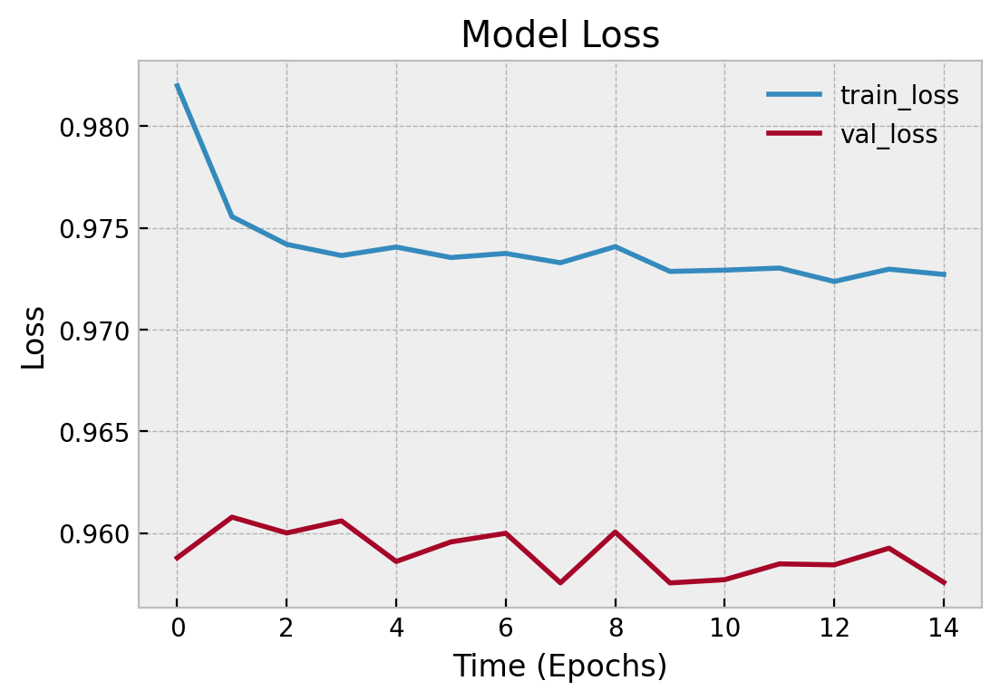

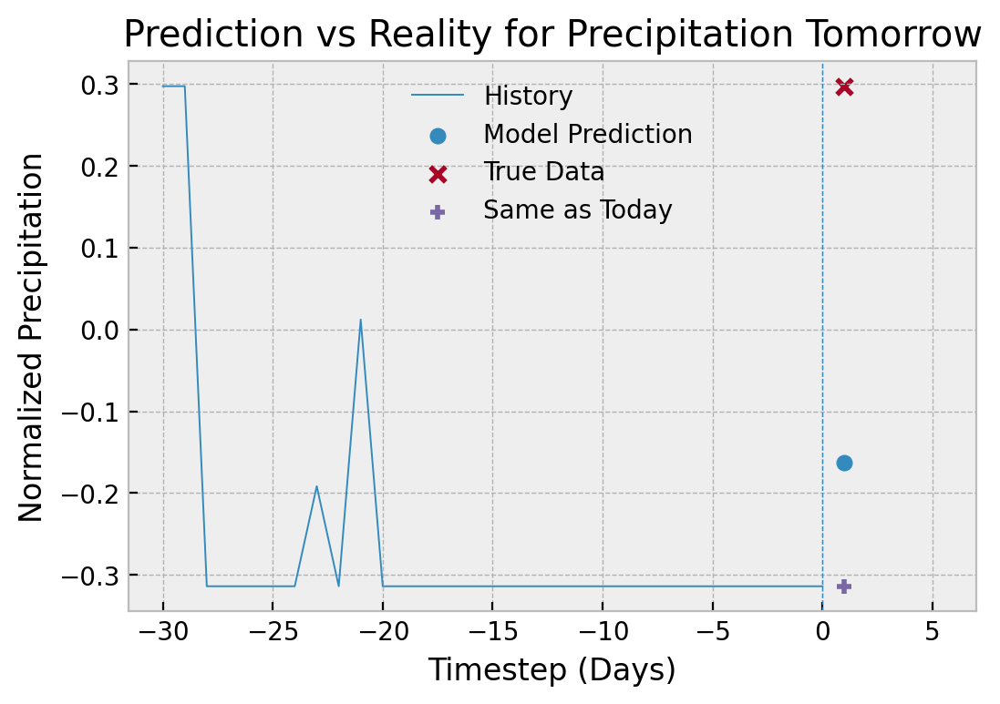

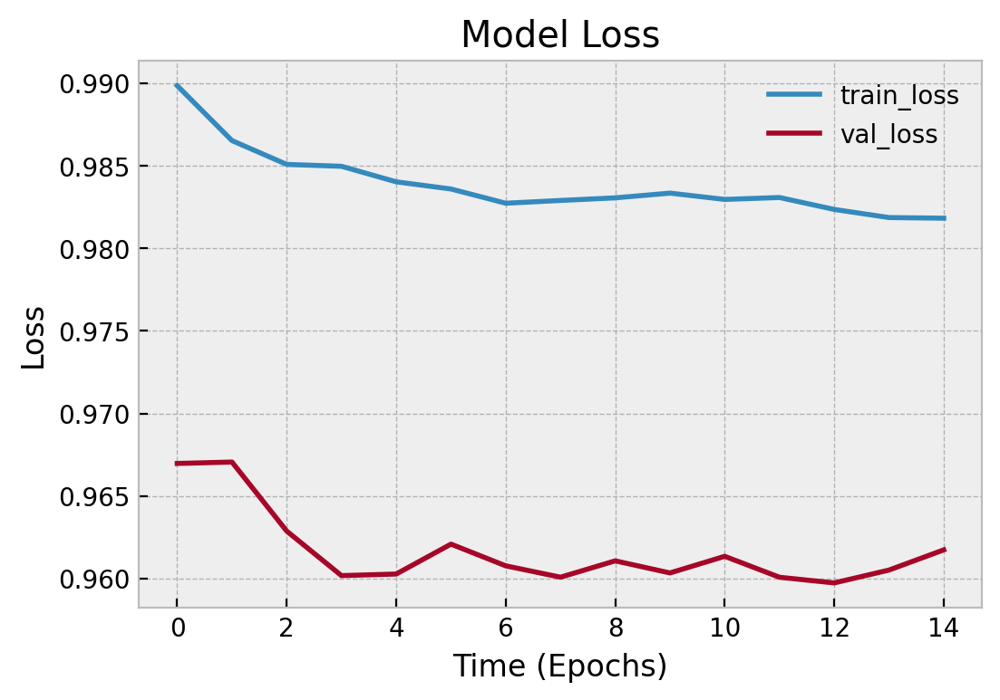

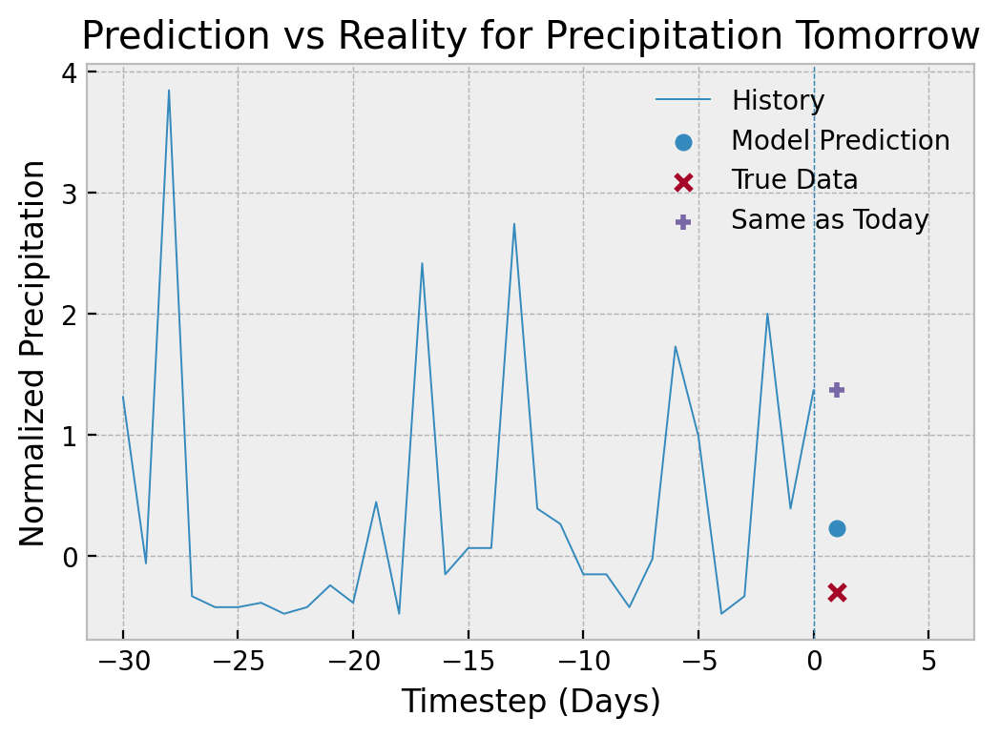

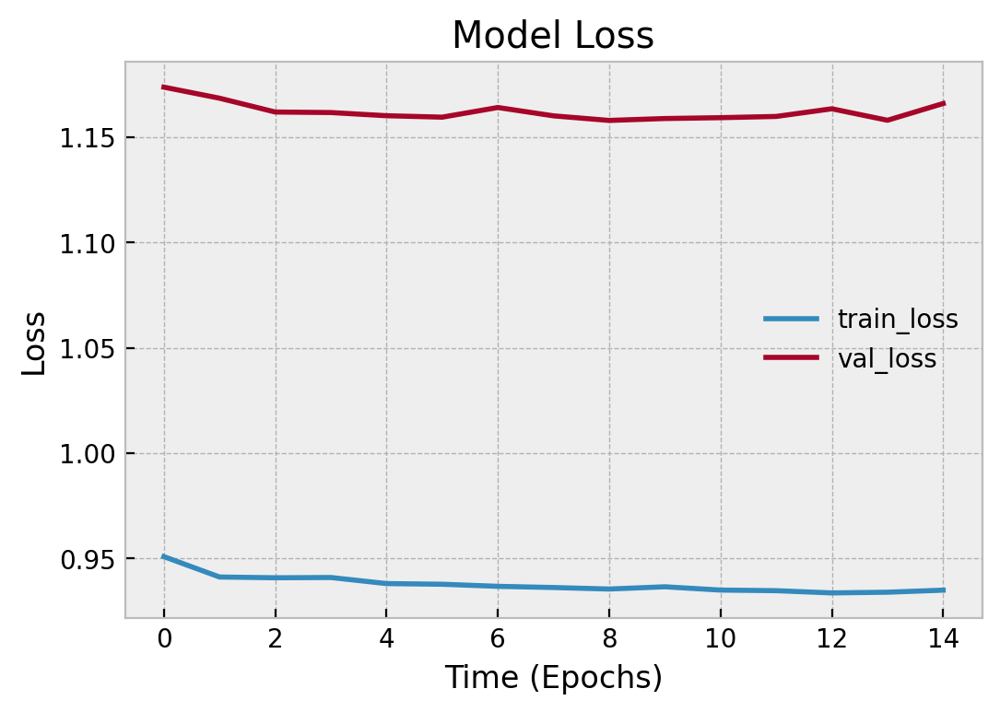

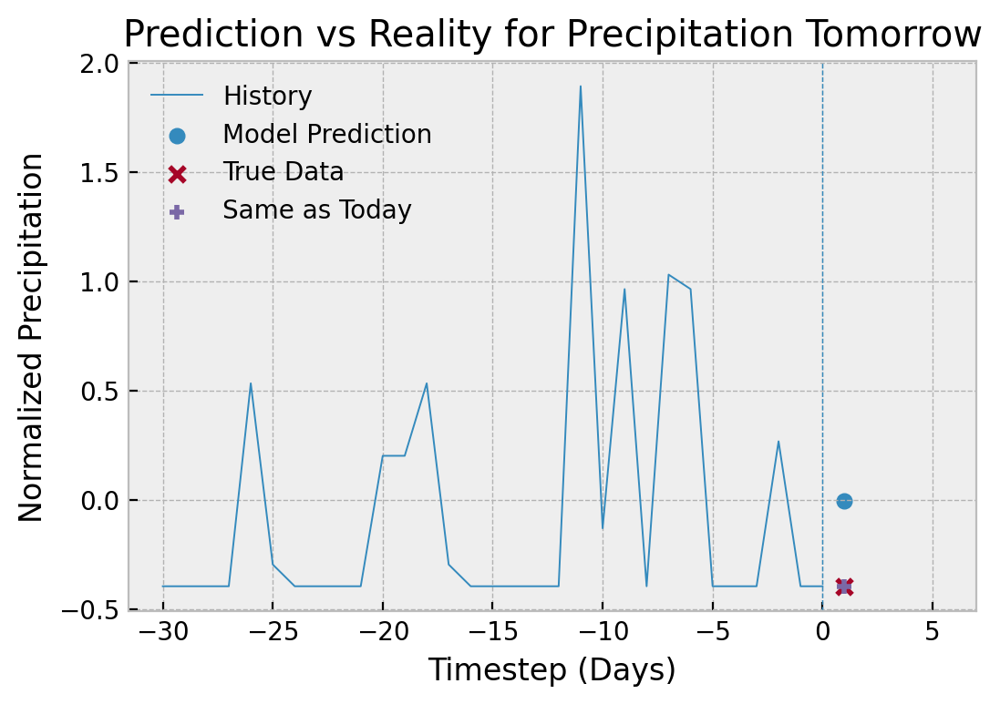

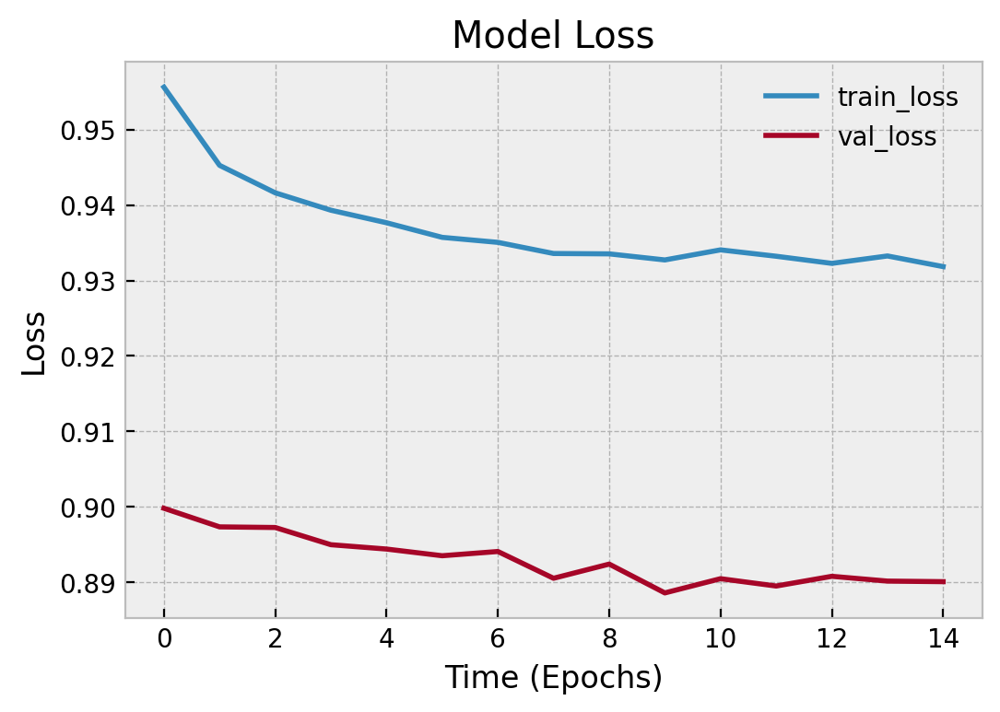

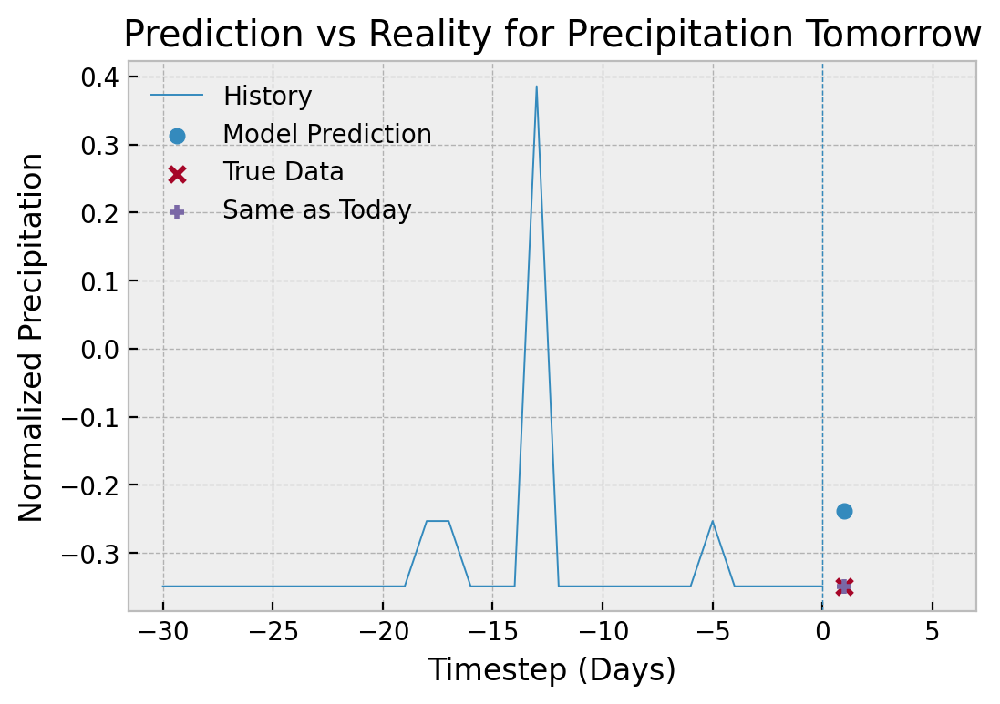

In [80]:
for i in prcp_stations: #model for 4 stations precipitation
    Prcp_model(i)

## Precipitation Prediction Conclusions

#### Station # 946 USW00026411 FAIRBANKS INTL AP, United States

This model has a high loss and the training and validation loss stay relatively constant over the training period. This shows that not a lot of training is done and the model performance is not improving significantly. 

The model does a better job at predicting the snowfall tomorrow compared to just assuming the snowfall is the same as today. 

#### Station # 944 USW00025624 COLD BAY AP, United States at 55.2208, -162.7325, 23.8

This model has a high loss and the training and validation loss stay relatively constant over the training period. This shows that not a lot of training is done and the model performance is not improving significantly. 

The model does a better job at predicting the snowfall tomorrow compared to just assuming the snowfall is the same as today.

#### Station # 949 USW00026615 BETHEL AP, United States at 60.785, -161.8292, 31.1

This model has a high loss and the training and validation loss stay relatively constant over the training period. This shows that not a lot of training is done and the model performance is not improving significantly. 

The model does a worse job at predicting the snowfall tomorrow compared to just assuming the snowfall is the same as today.

#### Station # 951 USW00026617 NOME MUNI AP, United States at 64.5111, -165.44, 4.0

This model has a high loss and the training and validation loss stay relatively constant over the training period. This shows that not a lot of training is done and the model performance is not improving significantly. 

The model does a worse job at predicting the snowfall tomorrow compared to just assuming the snowfall is the same as today.


## Task 2 Conclusions

### Predicting maximum temperature tomorrow
It can be seen from the plots of loss that the models have better performance after training. However, when it comes to predicting the maximum temperature tomorrow, the model is better nor worse when it comes to predicting the maximum temperature tomorrow. In 2 cases, the model prediction is closer to the true future, and in 2 cases, the maximum temperature today is closer to the true future compared to the model prediction. 

### Predicting minimum temperature tomorrow
It can be seen from the plots of loss that the models have better performance after training. However, when it comes to predicting the minimum temperature tomorrow, the model is better nor worse when it comes to predicting the maximum temperature tomorrow. In 3 cases, the model prediction is closer to the true future, and in 1 case, the minimum temperature today is closer to the true future compared to the model prediction. 

### Predicting snow depth, snowfall, precipitation tomorrow
It can be seen from the plots of loss that the models have marginally better performance after training. 

When it comes to predicting snow depth, snowfall, and precipitation tomorrow, in most cases, it is more accurate to assume that the value today will be closer to the true value tomorrow when compared to the prediction from the model. This could be due to the volatile nature of amount of snow depth, snowfall, and precipitation compared to temperature data. 

This suggests that temperature data has lower volatility and residuals to the underlying patterns/trends compared to snow depth, snowfall, and precipitation data. The trained model predicts a value based on the historical data trends. Therefore, for temperature values, it is more likely to be able to predict a value that is more accurate than just assuming the temperature will be the same as today. However, for snow and precipitation, the volatile nature means that the real data deviates from the underlying trends, which means it is difficult to predict. This means that just assuming the snow or rain will be the same tomorrow as today is more accurate than using machine learning to predict. 
